In [ ]:
# Starting the Project ✨

import scipy.io
import numpy as np

mat=scipy.io.loadmat(r"C:\Users\angel\Desktop\SBC-Final\EEG_Motor_Imagery_Classification_and_Clustering-main\datasets\BCICIV_calib_ds1b.mat")

In [ ]:
EEG = mat['cnt']    # retrieves the EEG from the  .,mat file 
EEG = 0.1 * EEG.astype(np.float64)  # converts to 64-bit floating point , ensuring it can be processed numrically
#0.1  scales the EEG 

#if exists markers in the mat files
if 'mrk' in mat:
    mrk = mat['mrk']
    window_pos = mrk['pos'][0][0].flatten()   # retrieves the positions of markers  # array multidimensional într-un vector unidimensional (1D).
    window_label = mrk['y'][0][0].flatten()    # retrieves the labels of markers 
else:
    window_pos = None
    window_label = None

nfo = mat['nfo']
fs = nfo['fs'][0][0].item() #sampling frequencies
channel_name = [str(label[0]) for label in nfo['clab'][0][0].flatten()] # convers to a list of string the labels
classes = [str(cls[0]) for cls in nfo['classes'][0][0].flatten()]
xpos = nfo['xpos'][0][0].flatten()  #position x of eeg on the scalp 
ypos = nfo['ypos'][0][0].flatten()   #position y of the eeg on the scalp 

In [ ]:
print("Continuous EEG signals (cnt):", EEG.shape)  #190594 points/samples and 59 channels electroeds
if window_pos is not None and window_label is not None:
    print("Positions of cues (pos):", window_pos)
    print("Target classes (y):", window_label)
print("Sampling rate (fs):", fs)
print("Channel labels (clab):", channel_name)
print("Motor imagery classes:", classes)
print("X-positions of electrodes (xpos):", xpos)
print("Y-positions of electrodes (ypos):", ypos)

Continuous EEG signals (cnt): (190594, 59)
Positions of cues (pos): [  2085   2885   3685   4485   5285   6085   6885   7685   8485   9285
  10085  10885  11685  12485  13285  16286  17086  17886  18687  19486
  20286  21086  21886  22686  23486  24286  25086  25886  26686  27486
  30487  31287  32087  32887  33687  34487  35287  36087  36887  37687
  38487  39287  40087  40887  41687  44688  45488  46288  47088  47888
  48688  49488  50288  51088  51888  52688  53488  54288  55088  55888
  58887  59687  60487  61287  62087  62887  63687  64487  65287  66087
  66887  67687  68487  69287  70087  73088  73888  74688  75488  76288
  77088  77888  78688  79488  80288  81088  81888  82688  83488  84288
  87287  88087  88887  89687  90487  91287  92087  92887  93687  94487
  97390  98190  98990  99790 100590 101390 102190 102990 103790 104590
 105390 106190 106990 107790 108590 111590 112390 113190 113990 114790
 115590 116390 117190 117990 118790 119590 120390 121190 121990 122790
 125789 1

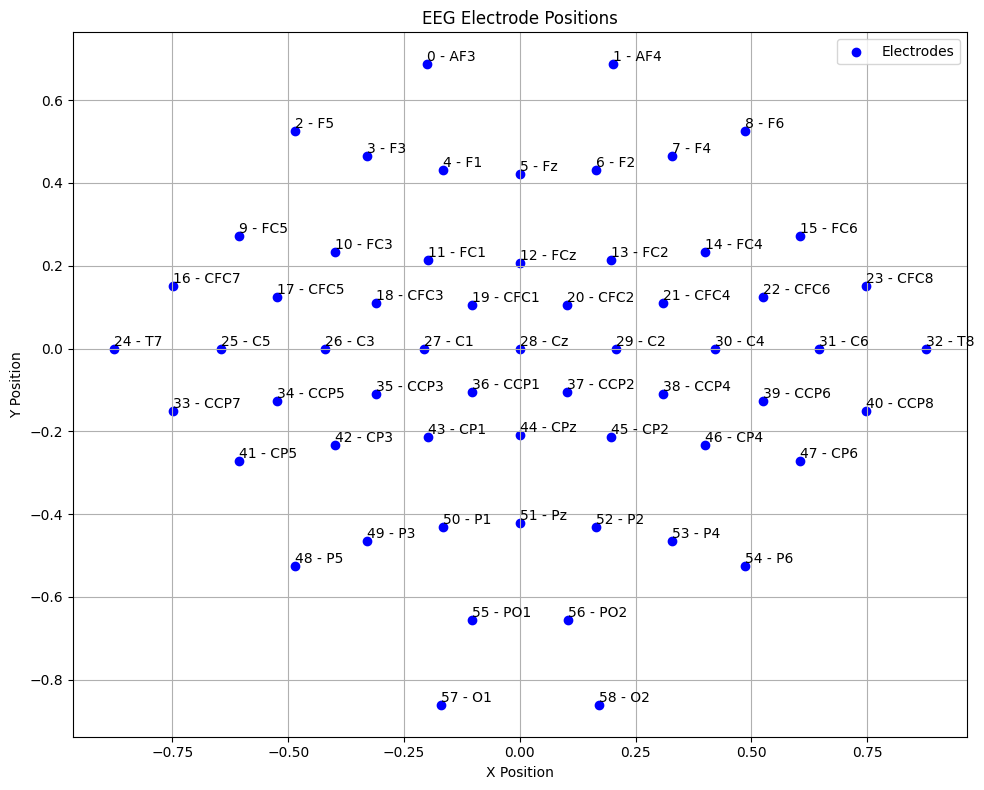

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.scatter(xpos, ypos, marker='o', color='b', label='Electrodes')

for index, (x, y, name) in  enumerate(zip(xpos, ypos, channel_name)):
    plt.text(x, y, f'{index} - {name}', fontsize=10, ha='left', va='bottom')

plt.title('EEG Electrode Positions')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
from scipy.signal import butter, filtfilt

def butter_bandpass(lowcut, highcut, fs, order=3):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return b, a

def bandpass_filter(data, lowcut, highcut, fs, order=3):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data, axis=0)
    return y

In [ ]:
mu_band = (8, 12)
beta_band = (13, 30)

EEG_mu = bandpass_filter(EEG, mu_band[0], mu_band[1], fs)
EEG_beta = bandpass_filter(EEG, beta_band[0], beta_band[1], fs)

EEG_mu_beta = bandpass_filter(EEG, mu_band[0], beta_band[1], fs)

print("Original EEG signals (EEG):", EEG.shape)
print("Mu band EEG signals (EEG_mu):", EEG_mu.shape)
print("Beta band EEG signals (EEG_beta):", EEG_beta.shape)
print("mu+beta EEG signals (EEG_mu_beta):", EEG_mu_beta.shape)

Original EEG signals (EEG): (190594, 59)
Mu band EEG signals (EEG_mu): (190594, 59)
Beta band EEG signals (EEG_beta): (190594, 59)
mu+beta EEG signals (EEG_mu_beta): (190594, 59)


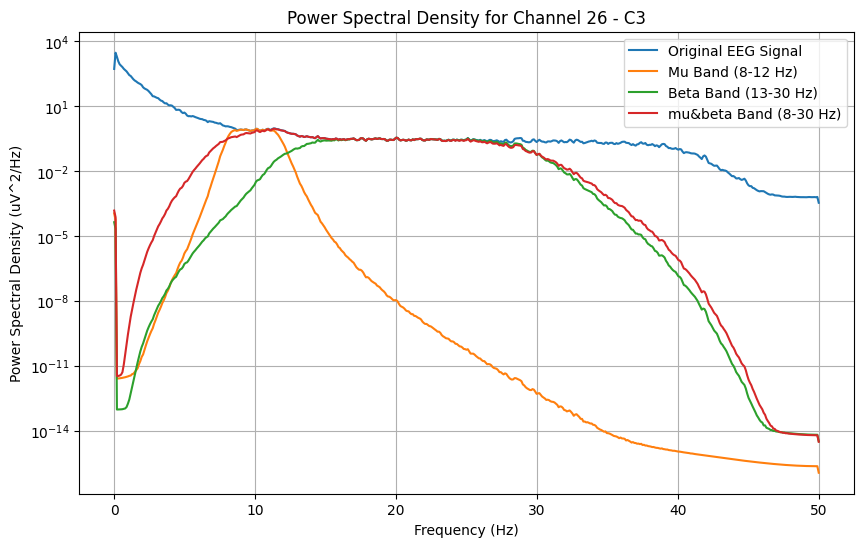

In [ ]:
import matplotlib.pyplot as plt
from scipy.signal import welch

def plot_psd(data, fs, title, channel_index):
    f, Pxx = welch(data[:, channel_index], fs, nperseg=1024)
    plt.semilogy(f, Pxx)

channel_to_plot = 26

plt.figure(figsize=(10, 6))

plot_psd(EEG, fs, 'Original EEG Signal', channel_to_plot)
plot_psd(EEG_mu, fs, 'Mu Band (8-12 Hz)', channel_to_plot)
plot_psd(EEG_beta, fs, 'Beta Band (13-30 Hz)', channel_to_plot)
plot_psd(EEG_mu_beta, fs, 'EEG_mu_beta Band (8-30 Hz)', channel_to_plot)

plt.title(f'Power Spectral Density for Channel {channel_to_plot} - C3')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (uV^2/Hz)')
plt.legend(['Original EEG Signal', 'Mu Band (8-12 Hz)', 'Beta Band (13-30 Hz)','mu&beta Band (8-30 Hz)'])
plt.grid()
plt.show()

In [ ]:
## CAR FILTER 

In [ ]:
# Extrage average-ul tuturor electrozilor , ramanand cu particularitatile fiecaruia

def apply_car_filter(data):
    mean_signal = np.mean(data, axis=1, keepdims=True)
    car_filtered = data - mean_signal
    return car_filtered

EEG_mu_car = apply_car_filter(EEG_mu)
EEG_beta_car = apply_car_filter(EEG_beta)
EEG_mu_beta_car = apply_car_filter(EEG_mu_beta)

print("CAR-filtered Mu band EEG signals (EEG_mu_car):", EEG_mu_car.shape)
print("CAR-filtered Beta band EEG signals (EEG_beta_car):", EEG_beta_car.shape)
print("CAR-filtered mu+Beta band EEG signals (EEG_mu_beta_car):", EEG_mu_beta_car.shape)

CAR-filtered Mu band EEG signals (EEG_mu_car): (190594, 59)
CAR-filtered Beta band EEG signals (EEG_beta_car): (190594, 59)
CAR-filtered mu+Beta band EEG signals (EEG_mu_beta_car): (190594, 59)


In [ ]:
## LAPLACIAN FILTER 

In [ ]:
def apply_laplacian_filter(data, electrode_locations, radius=0.25):
    filtered_data = np.zeros_like(data)
    n_channels = data.shape[0]
    n_samples = data.shape[1]

    for i in range(n_channels):
        channel_data = data[i]
        channel_location = electrode_locations[i]
        distance = np.linalg.norm(electrode_locations - channel_location, axis=1)
        neighbors = np.nonzero(distance <= radius)
        filtered_data[i] = channel_data - np.mean(channel_data[neighbors])
    return filtered_data

electrode_locations = np.column_stack((xpos, ypos))

EEG_mu_laplacian = apply_laplacian_filter(EEG_mu.T, electrode_locations)
EEG_beta_laplacian = apply_laplacian_filter(EEG_beta.T, electrode_locations)
EEG_mu_beta_laplacian = apply_laplacian_filter(EEG_mu_beta.T, electrode_locations)

EEG_mu_laplacian = EEG_mu_laplacian.T
EEG_beta_laplacian = EEG_beta_laplacian.T
EEG_mu_beta_laplacian = EEG_mu_beta_laplacian.T

print("Laplacian-filtered Mu band EEG signals (EEG_mu_laplacian):", EEG_mu_laplacian.shape)
print("Laplacian-filtered Beta band EEG signals (EEG_beta_laplacian):", EEG_beta_laplacian.shape)
print("Laplacian-filtered mu&Beta band EEG signals (EEG_mu_beta_laplacian):", EEG_mu_beta_laplacian.shape)

Laplacian-filtered Mu band EEG signals (EEG_mu_laplacian): (190594, 59)
Laplacian-filtered Beta band EEG signals (EEG_beta_laplacian): (190594, 59)
Laplacian-filtered mu&Beta band EEG signals (EEG_mu_beta_laplacian): (190594, 59)


In [ ]:
#### Plotting the signals 

In [ ]:
import matplotlib.pyplot as plt

def amplitude_plot(EEG1, EEG2, EEG3):

  plt.figure(figsize=(20, 10))
  channels_to_plot = [1, 28, 55]

  for i, ch in enumerate(channels_to_plot):
      plt.subplot(len(channels_to_plot), 3, 3*i + 1)
      plt.plot(EEG1[:800, ch],color='darkred')
      plt.title(f'Original EEG Data - Channel {channel_name[ch]}')
      plt.xlabel('Time')
      plt.ylabel('Amplitude')

      plt.subplot(len(channels_to_plot), 3, 3*i + 2)
      plt.plot(EEG2[:800, ch],color='darkgreen')
      plt.title(f'CAR Filtered EEG Data - Channel {channel_name[ch]}')
      plt.xlabel('Time')
      plt.ylabel('Amplitude')

      plt.subplot(len(channels_to_plot), 3, 3*i + 3)
      plt.plot(EEG3[:800, ch])
      plt.title(f'Laplacian Filtered EEG Data - Channel {channel_name[ch]}')
      plt.xlabel('Time')
      plt.ylabel('Amplitude')

  plt.tight_layout()
  plt.show()




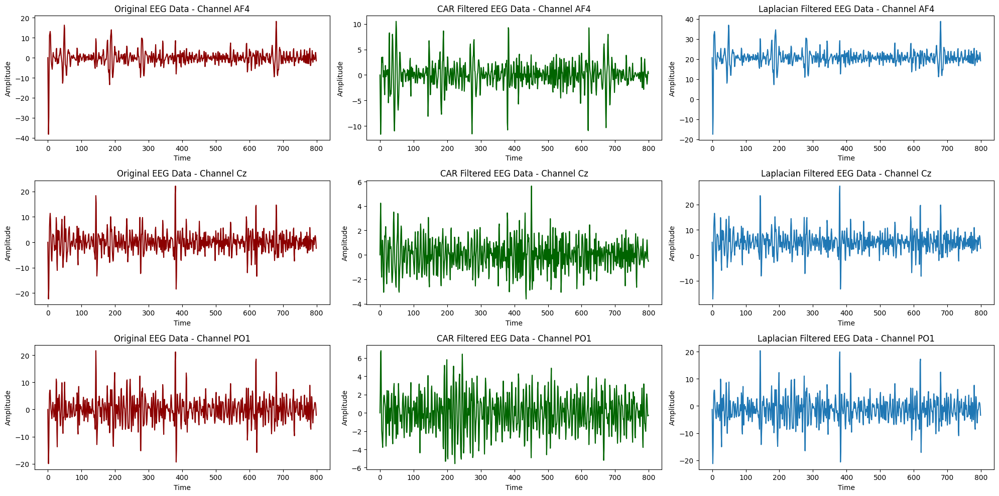

In [ ]:
amplitude_plot(EEG_mu_beta, EEG_mu_beta_car, EEG_mu_beta_laplacian)

In [ ]:
# Plotting singals ( mu_band original , mu_car , mu_laplacian ) 

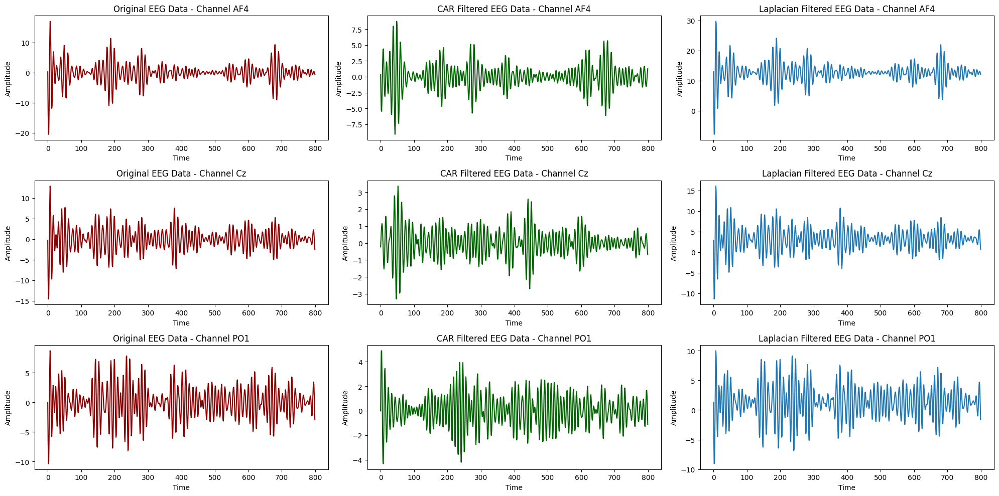

In [ ]:
amplitude_plot(EEG_mu, EEG_mu_car, EEG_mu_laplacian)

In [ ]:
# Plotting signals ( beta_band original , beta_car , beta_laplacian )

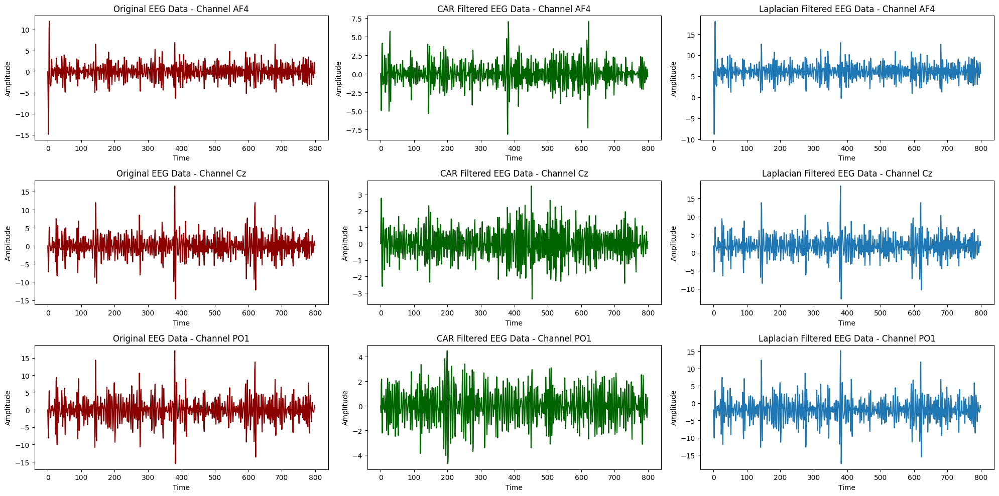

In [ ]:

amplitude_plot(EEG_beta, EEG_beta_car, EEG_beta_laplacian)

In [ ]:
 ### FEATURE EXTRACTION  ( Common Spacial Patterns + Principal Component Analysis ) 

In [ ]:
### Data Preparation 

In [ ]:
window_size = 800

EEG_3D_mu_beta = np.array([EEG_mu_beta[start:start + window_size, :] for start in window_pos])
EEG_3D_mu_beta_T = EEG_3D_mu_beta.transpose(0,2,1)

EEG_3D_mu_beta_car = np.array([EEG_mu_beta_car[start:start + window_size, :] for start in window_pos])
EEG_3D_mu_beta_car_T = EEG_3D_mu_beta_car.transpose(0,2,1)

EEG_3D_mu_beta_laplacian = np.array([EEG_mu_beta_laplacian[start:start + window_size, :] for start in window_pos])
EEG_3D_mu_beta_laplacian_T = EEG_3D_mu_beta_laplacian.transpose(0,2,1)

print(EEG_mu_beta_car.shape)
print(EEG_3D_mu_beta_car.shape)
print(EEG_3D_mu_beta_car_T.shape)

(190594, 59)
(200, 800, 59)
(200, 59, 800)


In [ ]:
### Train & Spliting

In [ ]:
from sklearn.model_selection import train_test_split

EEG_3D_mu_beta_T_train, EEG_3D_mu_beta_T_test, y_mu_beta_train, y_mu_beta_test = train_test_split(EEG_3D_mu_beta_T, window_label, test_size=0.25, stratify=window_label, random_state=30)
print(EEG_3D_mu_beta_T_train.shape)

EEG_3D_mu_beta_car_T_train, EEG_3D_mu_beta_car_T_test, y_mu_beta_car_train, y_mu_beta_car_test = train_test_split(EEG_3D_mu_beta_car_T, window_label, test_size=0.25, stratify=window_label, random_state=30)
print(EEG_3D_mu_beta_car_T_train.shape)

EEG_3D_mu_beta_laplacian_T_train, EEG_3D_mu_beta_laplacian_T_test, y_mu_beta_laplacian_train, y_mu_beta_laplacian_test = train_test_split(EEG_3D_mu_beta_laplacian_T, window_label, test_size=0.25, stratify=window_label, random_state=30)
print(EEG_3D_mu_beta_laplacian_T_train.shape)

(150, 59, 800)
(150, 59, 800)
(150, 59, 800)


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
pip install mne

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
## Apppling the CSP feature extraction 

In [ ]:
from mne.decoding import CSP

### Semnalul nefiltrat -  CSP cu 58 de features 
csp58 = CSP(n_components=58, reg='ledoit_wolf', log=True, cov_est='epoch')

EEG_3D_mu_beta_T_train_csp58 = csp58.fit_transform(EEG_3D_mu_beta_T_train, y_mu_beta_train)
EEG_3D_mu_beta_T_test_csp58 = csp58.transform(EEG_3D_mu_beta_T_test)

Computing rank from data with rank=None
    Using tolerance 83 (2.2e-16 eps * 59 dim * 6.4e+15  max singular value)
    Estimated rank (data): 59
    data: rank 59 computed from 59 data channels with 0 projectors
Reducing data rank from 59 -> 59
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LE

In [ ]:
csp58 = CSP(n_components=58, reg='ledoit_wolf', log=True, cov_est='epoch')

#Semnalul filtrat cu Laplacian CSP  58 de features 

EEG_3D_mu_beta_laplacian_T_train_csp58 = csp58.fit_transform(EEG_3D_mu_beta_laplacian_T_train, y_mu_beta_laplacian_train)
EEG_3D_mu_beta_laplacian_T_test_csp58 = csp58.transform(EEG_3D_mu_beta_laplacian_T_test)

Computing rank from data with rank=None
    Using tolerance 2.1e+02 (2.2e-16 eps * 59 dim * 1.6e+16  max singular value)
    Estimated rank (data): 59
    data: rank 59 computed from 59 data channels with 0 projectors
Reducing data rank from 59 -> 59
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance usi

In [ ]:
csp2_T = CSP(n_components=2, reg='ledoit_wolf', log=True, cov_est='epoch')

# Semnalul filtrat cu csp + 2 features

EEG_3D_mu_beta_car_csp2 = csp2_T.fit_transform(EEG_3D_mu_beta_car, window_label)

Computing rank from data with rank=None
    Using tolerance 1.3e+02 (2.2e-16 eps * 800 dim * 7.2e+14  max singular value)
    Estimated rank (data): 795
    data: rank 795 computed from 800 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 800 -> 795
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covari

In [ ]:
csp2 = CSP(n_components=2, reg='ledoit_wolf', log=True, cov_est='epoch')

# semnalul filtrat cu CAR cu 2 feature 
EEG_3D_mu_beta_car_T_csp2 = csp2.fit_transform(EEG_3D_mu_beta_car_T, window_label)

Computing rank from data with rank=None
    Using tolerance 34 (2.2e-16 eps * 59 dim * 2.6e+15  max singular value)
    Estimated rank (data): 58
    data: rank 58 computed from 59 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 59 -> 58
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using 

In [ ]:
#Concatenating the train + test EEG DATA


In [ ]:
EEG_3D_mu_beta_T_csp58 = np.concatenate((EEG_3D_mu_beta_T_train_csp58, EEG_3D_mu_beta_T_test_csp58), axis=0)
train_test_labels = np.concatenate((y_mu_beta_train, y_mu_beta_test), axis=0)
print("EEG CSP feature Shape",EEG_3D_mu_beta_T_csp58.shape)

EEG CSP feature Shape (200, 58)


In [ ]:
csp58 = CSP(n_components=58, reg='ledoit_wolf', log=True, cov_est='epoch')

# Semnal filtrat cu CAR 58 de feature
EEG_3D_mu_beta_car_T_train_csp58 = csp58.fit_transform(EEG_3D_mu_beta_car_T_train, y_mu_beta_car_train)
EEG_3D_mu_beta_car_T_test_csp58 = csp58.transform(EEG_3D_mu_beta_car_T_test)

Computing rank from data with rank=None
    Using tolerance 29 (2.2e-16 eps * 59 dim * 2.2e+15  max singular value)
    Estimated rank (data): 58
    data: rank 58 computed from 59 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 59 -> 58
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using LEDOIT_WOLF
Done.
Estimating class=-1 covariance using 

In [ ]:
# Mu+Beta Band , CAR FILTER , CSP WITH 58 FEATURES 
EEG_3D_mu_beta_car_T_csp58 = np.concatenate((EEG_3D_mu_beta_car_T_train_csp58, EEG_3D_mu_beta_car_T_test_csp58), axis=0)
car_train_test_labels = np.concatenate((y_mu_beta_car_train, y_mu_beta_car_test), axis=0)
print("EEG CSP feature Shape",EEG_3D_mu_beta_car_T_csp58.shape)

EEG CSP feature Shape (200, 58)


In [ ]:
#Mu+Beta Band , Laplacian Filter , CSP WITH 58 FEATURES

EEG_3D_mu_beta_laplacian_T_csp58= np.concatenate((EEG_3D_mu_beta_laplacian_T_train_csp58, EEG_3D_mu_beta_laplacian_T_test_csp58), axis=0)
laplacian_train_test_labels = np.concatenate((y_mu_beta_laplacian_train, y_mu_beta_laplacian_test), axis=0)
print("EEG CSP feature Shape",EEG_3D_mu_beta_laplacian_T_csp58.shape)

EEG CSP feature Shape (200, 58)


In [ ]:
### Plotting MU-BAND with CAR filter 

In [ ]:
import matplotlib.pyplot as plt
def plot_csp(csp_features, labels , title ):
  plt.figure(figsize=(8, 6))
  n_components = EEG_3D_mu_beta_car_T_csp58.shape[1]

  if n_components == 1:
      plt.scatter(csp_features[:, 0], np.zeros_like(csp_features[:, 0]), c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('CSP Component 1')
      plt.yticks([])
  else:
      plt.scatter(csp_features[:, 0], csp_features[:, 1], c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('CSP Component 1')
      plt.ylabel('CSP Component 2')

  plt.title('CSP Features ' + title)
  plt.colorbar(label='Class Label')
  plt.show()

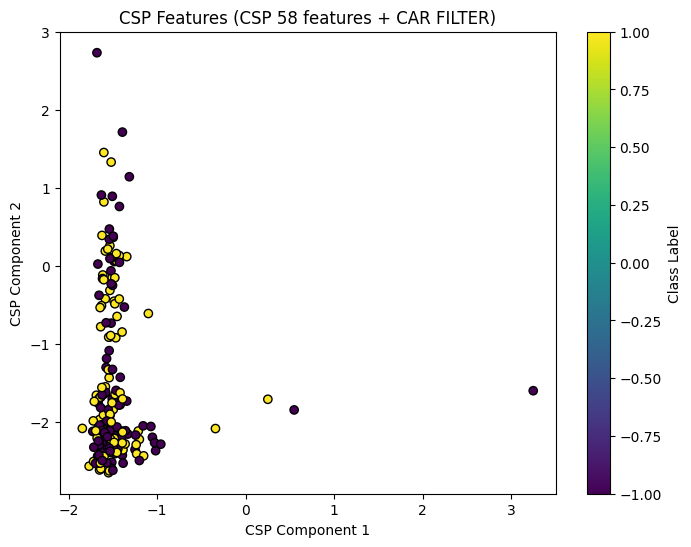

In [ ]:
plot_csp(EEG_3D_mu_beta_car_T_csp58 ,train_test_labels, "(CSP 58 features + CAR FILTER)")

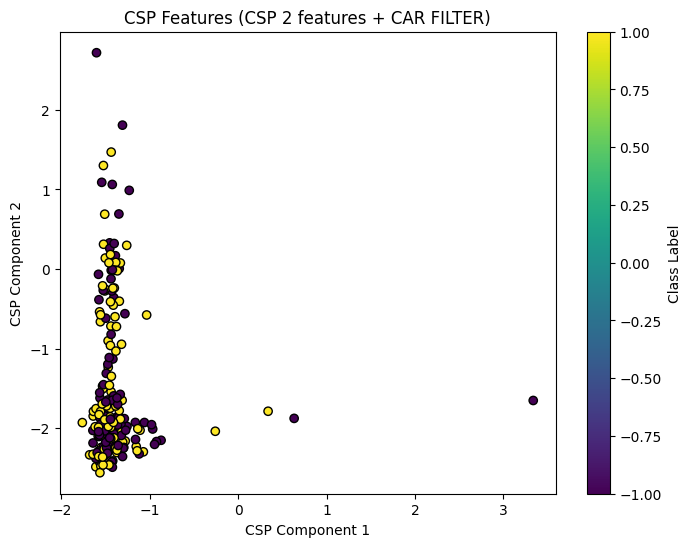

In [ ]:
plot_csp(EEG_3D_mu_beta_car_T_csp2 ,window_label, "(CSP 2 features + CAR FILTER)")

In [ ]:
### Applying PCA after CSP filtering - to fiind aprox 95% variance with a specified number of components 

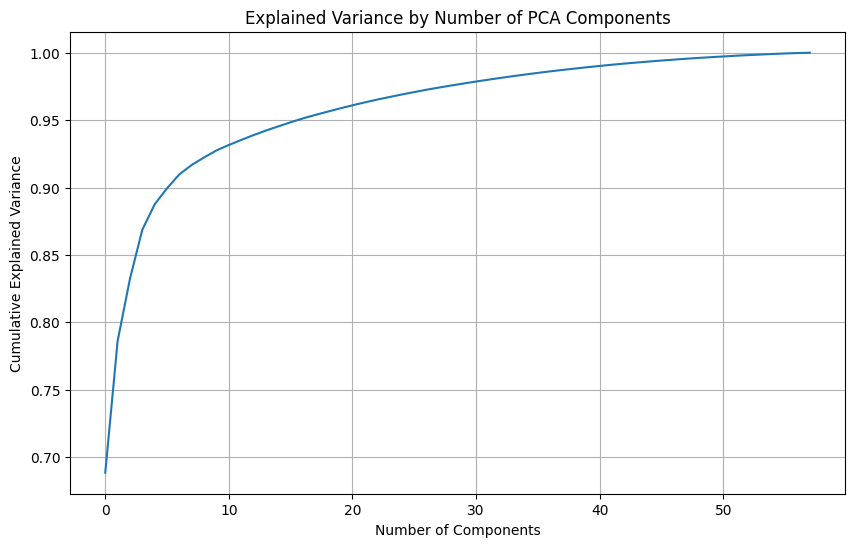

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(EEG_3D_mu_beta_car_T_train_csp58)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of PCA Components')
plt.grid(True)
plt.show()

In [ ]:
desired_variance = 0.95
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance >= desired_variance) + 1
print(f'Number of components to explain {desired_variance*100}% variance: {n_components}')


Number of components to explain 95.0% variance: 17


In [ ]:
#### Applying the PCA with 10 components

In [ ]:
pca = PCA(n_components=10)
EEG_3D_mu_beta_car_T_train_csp58_pca10 = pca.fit_transform(EEG_3D_mu_beta_car_T_train_csp58)
EEG_3D_mu_beta_car_T_test_csp58_pca10 =  pca.transform(EEG_3D_mu_beta_car_T_test_csp58)
print("train set shape:",EEG_3D_mu_beta_car_T_train_csp58_pca10.shape)
print("test set shape:",EEG_3D_mu_beta_car_T_test_csp58_pca10.shape)

train set shape: (150, 10)
test set shape: (50, 10)


In [ ]:
### Applying PCA on the original data 

(200, 47200)


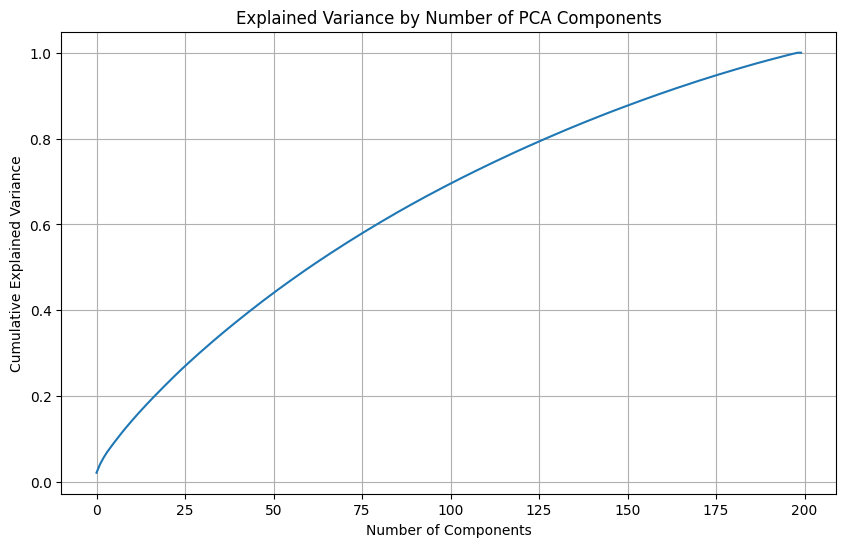

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

n_trials, n_channels , n_samples= EEG_3D_mu_beta_car.shape
EEG_3D_mu_beta_car_reshaped = EEG_3D_mu_beta_car.reshape(n_trials, -1)
print(EEG_3D_mu_beta_car_reshaped.shape)

pca = PCA()
pca.fit(EEG_3D_mu_beta_car_reshaped)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of PCA Components')
plt.grid(True)
plt.show()


In [ ]:
desired_variance = 0.95
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance >= desired_variance) + 1
print(f'Number of components to explain {desired_variance*100}% variance: {n_components}')

Number of components to explain 95.0% variance: 178


In [ ]:
### Fiind the n-components for the original data

In [ ]:
n_trials, n_channels , n_samples= EEG_3D_mu_beta_car.shape
EEG_3D_mu_beta_car_reshaped = EEG_3D_mu_beta_car.reshape(n_trials, -1)
print(EEG_3D_mu_beta_car_reshaped.shape)

n_components = 160

pca = PCA(n_components=n_components)
EEG_3D_mu_beta_car_pca160 = pca.fit_transform(EEG_3D_mu_beta_car_reshaped)

print(EEG_3D_mu_beta_car_pca160.shape)

(200, 47200)
(200, 160)


In [ ]:
n_components = min(EEG_3D_mu_beta_car_reshaped.shape[1], 2)

pca = PCA(n_components=n_components)
EEG_3D_mu_beta_car_pca2 = pca.fit_transform(EEG_3D_mu_beta_car_reshaped)

print(EEG_3D_mu_beta_car_pca2.shape)

(200, 2)


In [ ]:
## Plotting the PCA after the analysis with 58 features and best n-compoentnts

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
def plot_pca(pca_features, labels, title) :
  plt.figure(figsize=(8, 6))

  if n_components == 1:
      plt.scatter(pca_features[:, 0], np.zeros_like(pca_features[:, 0]), c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('Principal Component 1')
      plt.yticks([])
  else:
      plt.scatter(pca_features[:, 0], pca_features[:, 1], c=labels, cmap='viridis', edgecolor='k')
      plt.xlabel('Principal Component 1')
      plt.ylabel('Principal Component 2')

  plt.title(title)
  plt.colorbar(label='Class Label')
  plt.show()

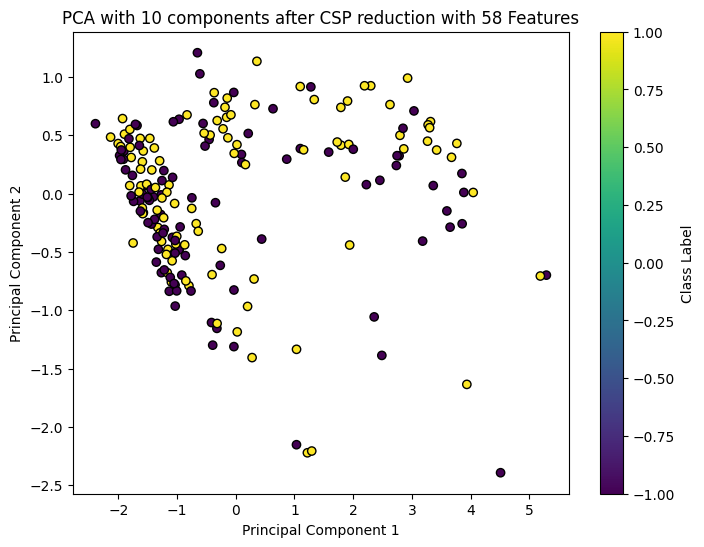

In [ ]:
EEG_3D_mu_beta_car_T_train_test_csp58_pca10 = np.concatenate((EEG_3D_mu_beta_car_T_train_csp58_pca10, EEG_3D_mu_beta_car_T_test_csp58_pca10), axis=0)
car_train_test_labels = np.concatenate((y_mu_beta_car_train, y_mu_beta_car_test), axis=0)
plot_pca(EEG_3D_mu_beta_car_T_train_test_csp58_pca10,car_train_test_labels,'PCA with 10 components after CSP reduction with 58 Features')

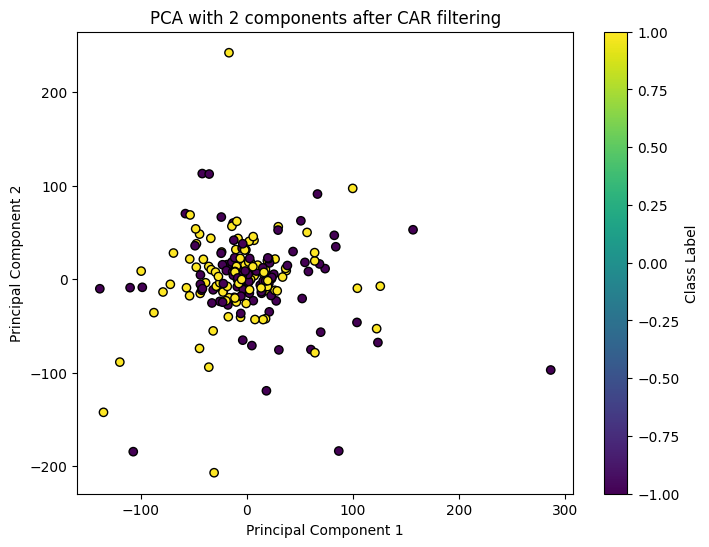

In [ ]:
plot_pca(EEG_3D_mu_beta_car_pca2,window_label,'PCA with 2 components after CAR filtering')

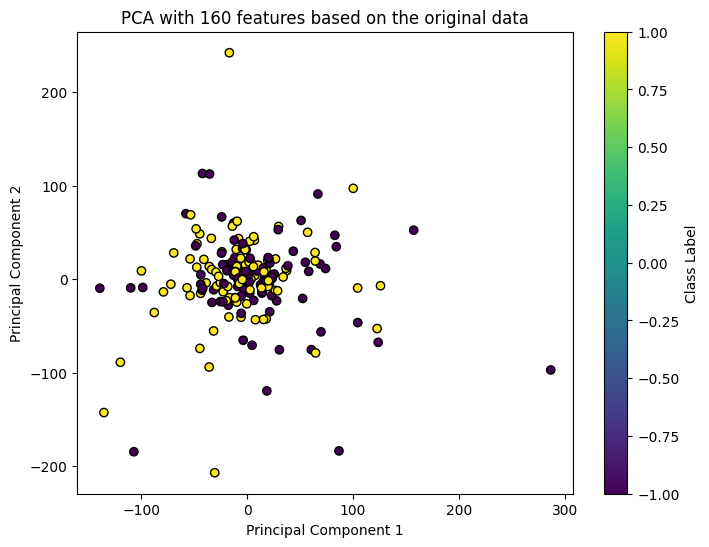

In [ ]:
plot_pca(EEG_3D_mu_beta_car_pca160,window_label,'PCA with 160 features based on the original data')  

In [ ]:
########## Classification ##################
pip install lightgbm

SyntaxError: invalid syntax (3301639837.py, line 2)

In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
import seaborn as sns

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

def classification(X_train, y_train, X_test, y_test):
  models = {
       'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Naive Bayes': GaussianNB(),
    'MLP Neural Network': MLPClassifier(),
  }

  results = {}
  for name, model in models.items():
      print()
      print(f"\033[38;5;208m{name}\033[0m")
      model.fit(X_train, y_train)
      y_pred = model.predict(X_test)
      accuracy = accuracy_score(y_test, y_pred)
      results[name] = accuracy
      print(f"\033[32mAccuracy: {accuracy:.2f}\033[0m")
      print(classification_report(y_test, y_pred))
      confusion = confusion_matrix(y_test, y_pred)
     

      

In [ ]:
classification(EEG_3D_mu_beta_car_T_train_csp58_pca10, y_mu_beta_car_train, EEG_3D_mu_beta_car_T_test_csp58_pca10, y_mu_beta_car_test)


Logistic Regression
Accuracy: 0.52
              precision    recall  f1-score   support

          -1       0.52      0.52      0.52        25
           1       0.52      0.52      0.52        25

    accuracy                           0.52        50
   macro avg       0.52      0.52      0.52        50
weighted avg       0.52      0.52      0.52        50


Decision Tree
Accuracy: 0.46
              precision    recall  f1-score   support

          -1       0.44      0.32      0.37        25
           1       0.47      0.60      0.53        25

    accuracy                           0.46        50
   macro avg       0.46      0.46      0.45        50
weighted avg       0.46      0.46      0.45        50


Random Forest
Accuracy: 0.48
              precision    recall  f1-score   support

          -1       0.48      0.44      0.46        25
           1       0.48      0.52      0.50        25

    accuracy                           0.48        50
   macro avg       0.48      0.4

In [ ]:
####################### CLUSTERING ##################################################

In [ ]:
######################### DB-SCAN METHOD ###############################

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.cm as cm

def apply_dbscan(data, eps=0.5, min_samples=5):

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(data)

    return cluster_labels

def plot_dbscan_clusters(data, cluster_labels):

    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)

    plt.figure(figsize=(7, 6))

    unique_labels = np.unique(cluster_labels)
    colors = [cm.nipy_spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [0, 0, 0, 1]

        class_member_mask = (cluster_labels == k)
        xy = reduced_data[class_member_mask]
        plt.scatter(xy[:, 0], xy[:, 1], c=[col], label=f'Cluster {k}' if k != -1 else 'Noise', edgecolor='k', s=50)

    plt.title("DBSCAN Clustering Results")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend()
    plt.show()

C:\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


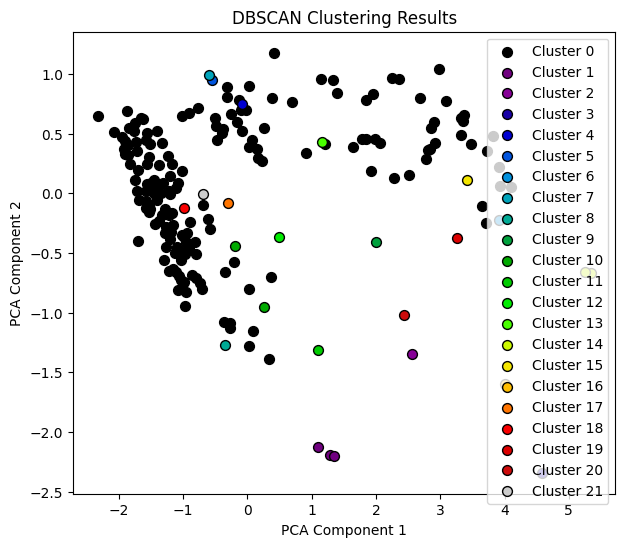

eps:  1.3
mins:  1


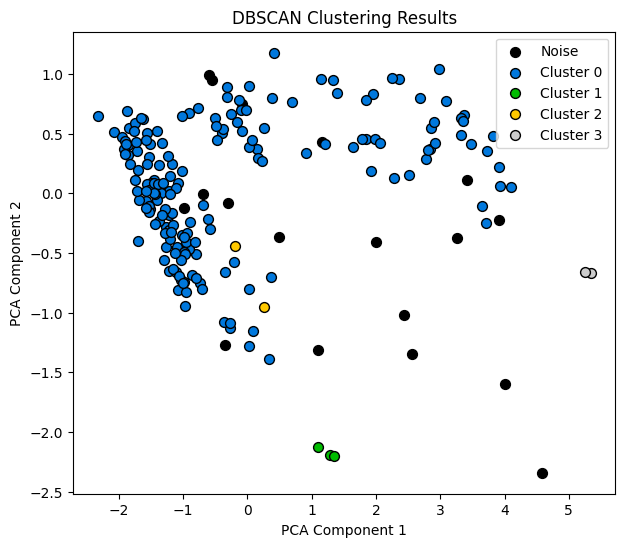

eps:  1.3
mins:  2


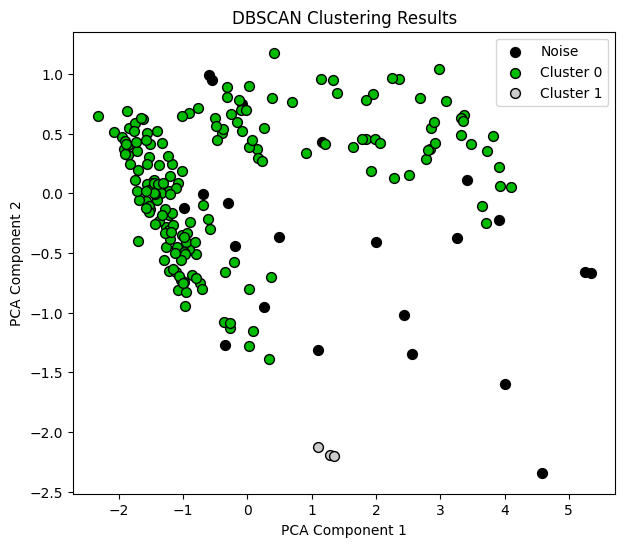

eps:  1.3
mins:  3


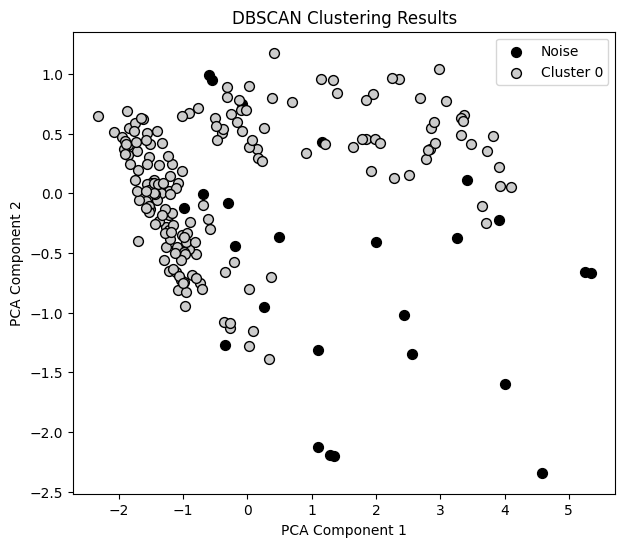

eps:  1.3
mins:  4


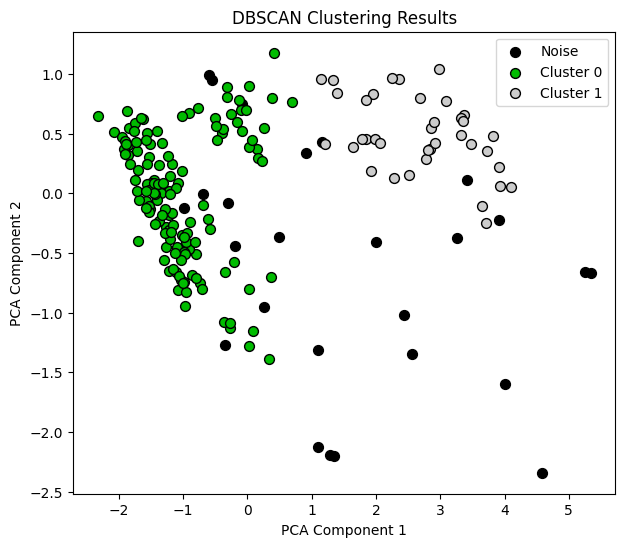

eps:  1.3
mins:  5


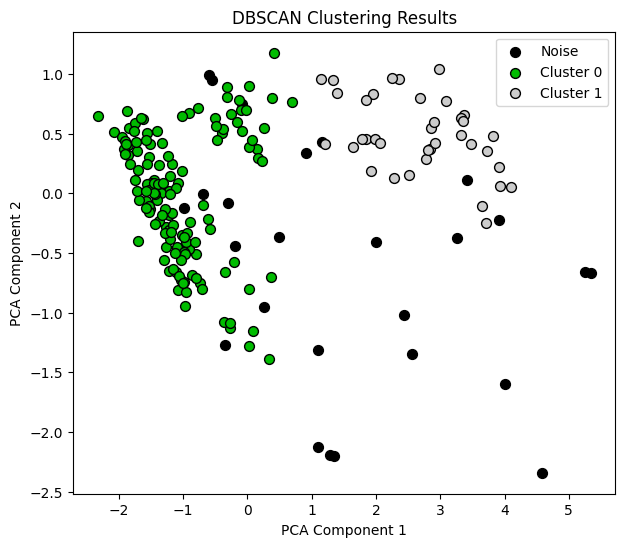

eps:  1.3
mins:  6


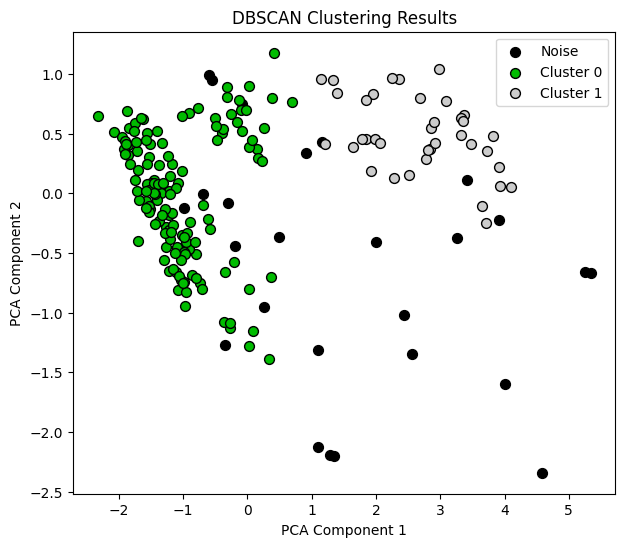

eps:  1.3
mins:  7


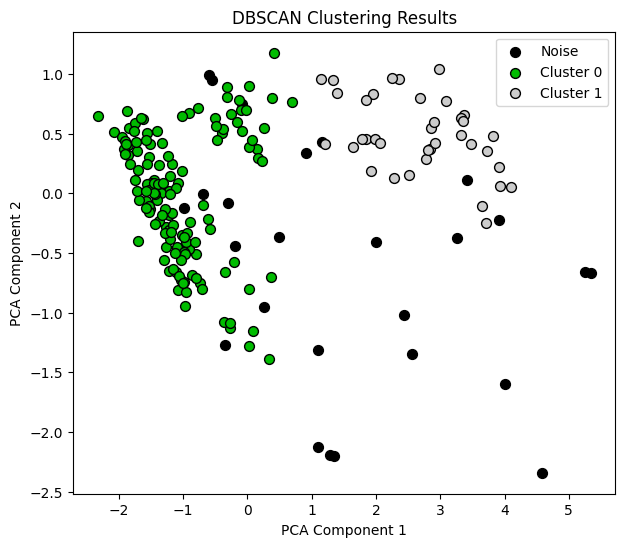

eps:  1.3
mins:  8


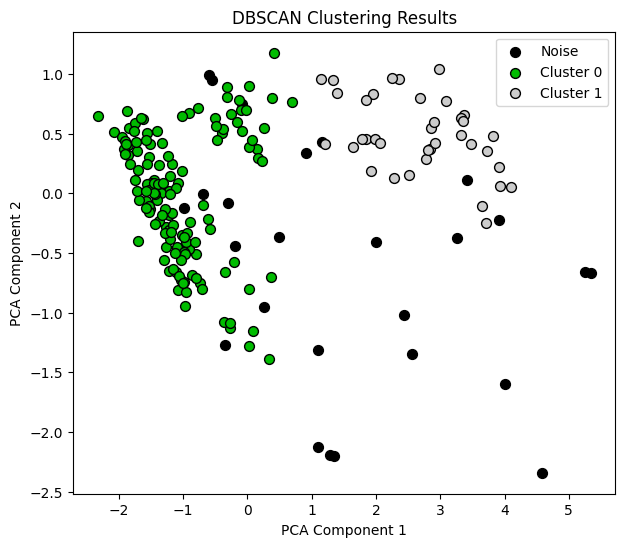

eps:  1.3
mins:  9


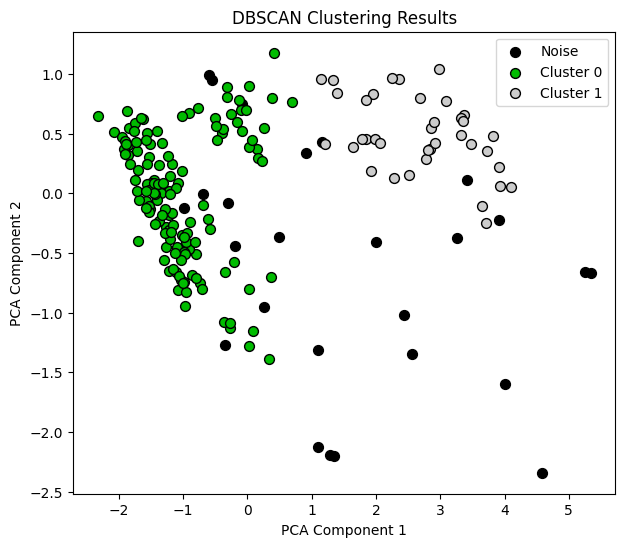

eps:  1.3
mins:  10


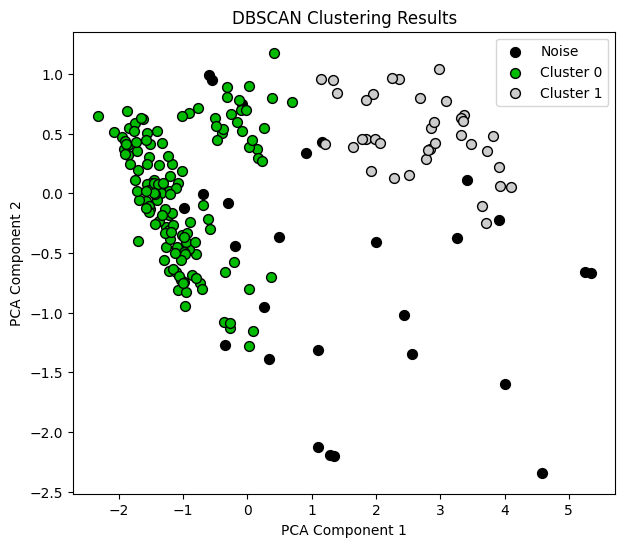

eps:  1.3
mins:  11


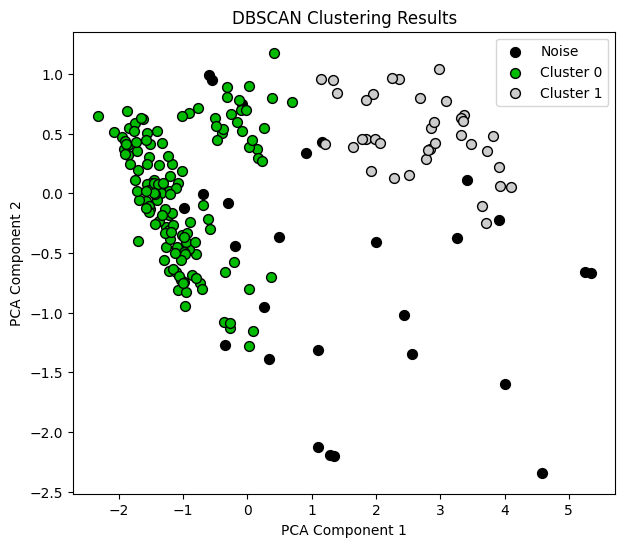

eps:  1.3
mins:  12


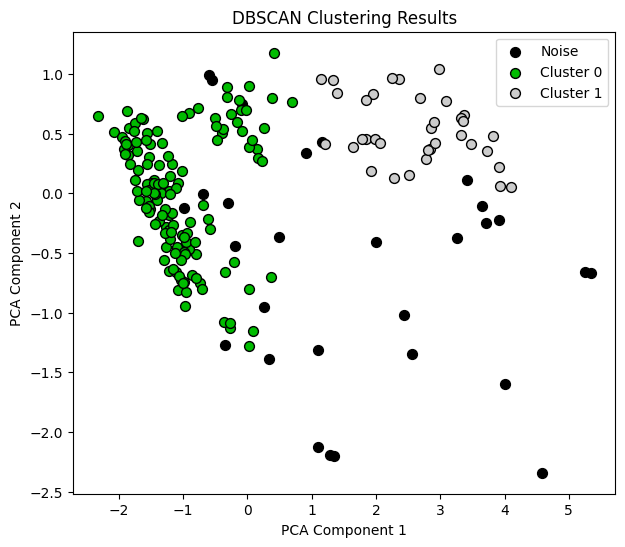

eps:  1.3
mins:  13


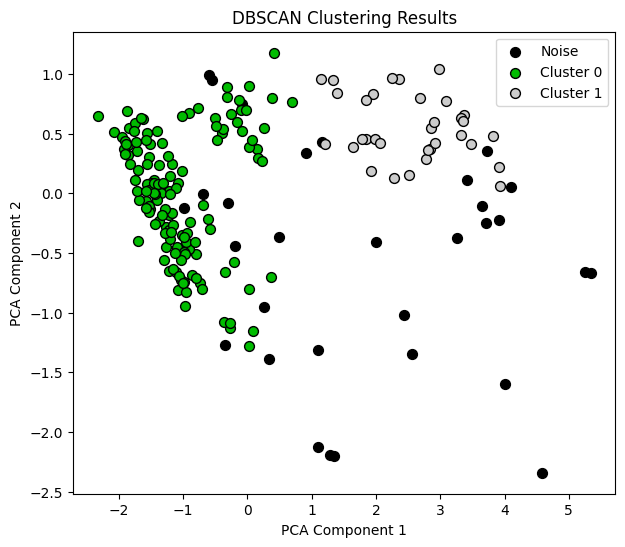

eps:  1.3
mins:  14


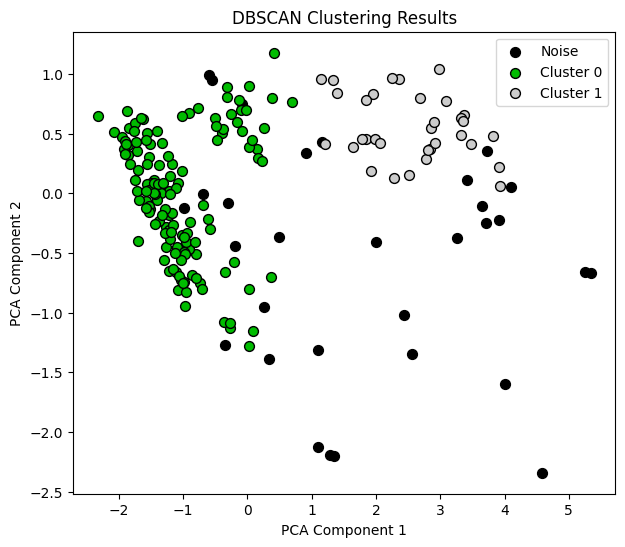

eps:  1.3
mins:  15


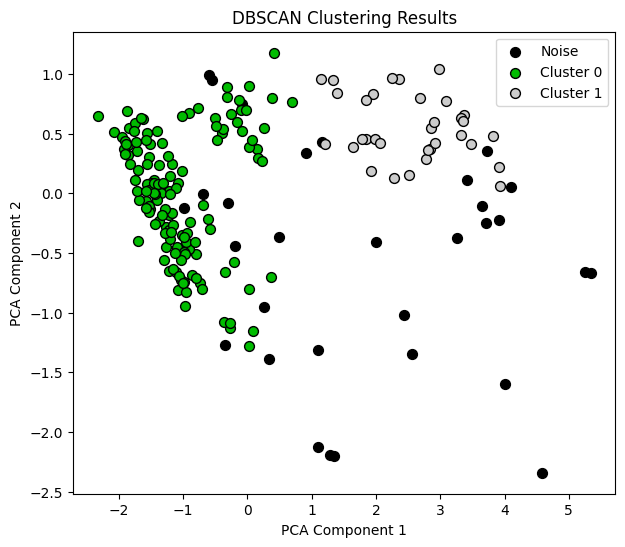

eps:  1.3
mins:  16


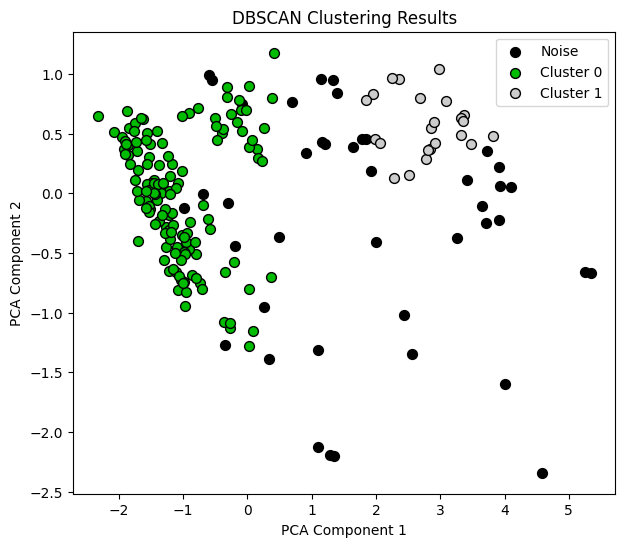

eps:  1.3
mins:  17


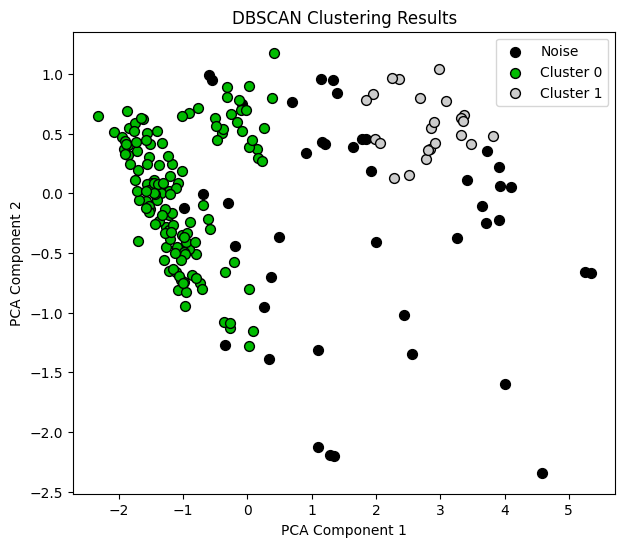

eps:  1.3
mins:  18


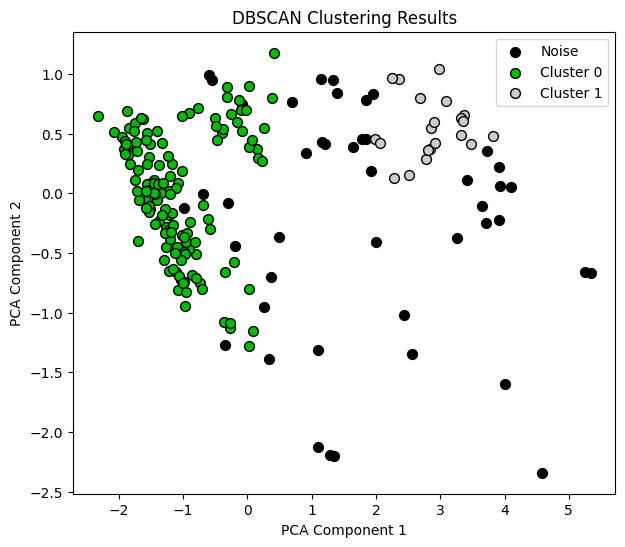

eps:  1.3
mins:  19


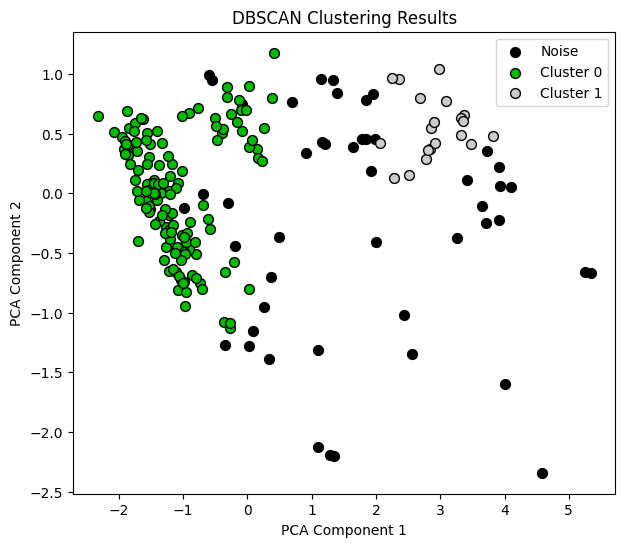

eps:  1.3
mins:  20


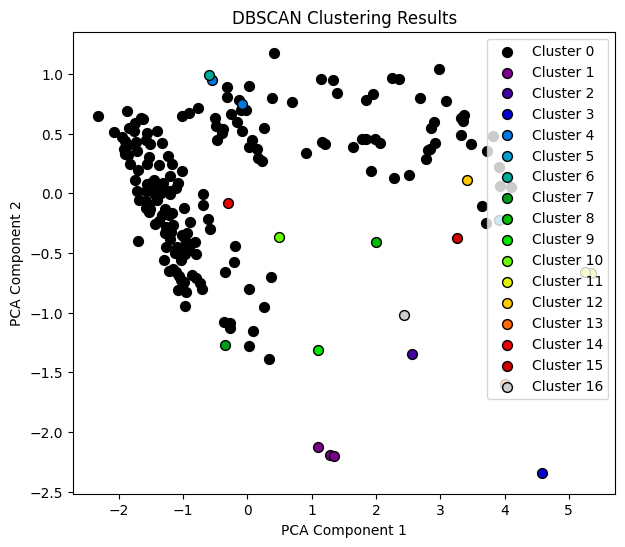

eps:  1.4
mins:  1


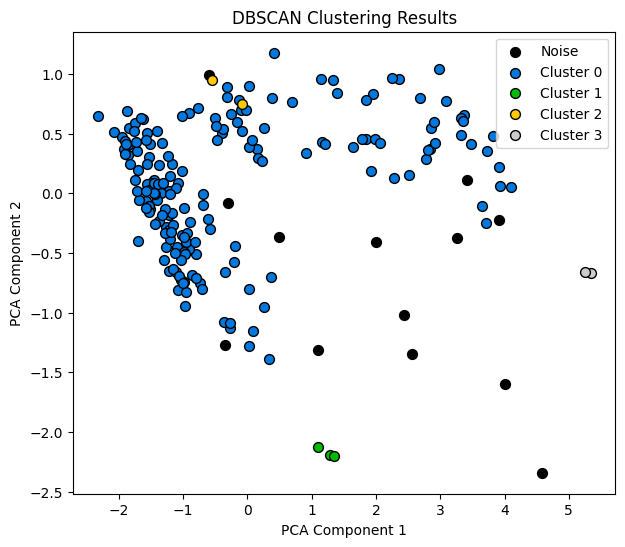

eps:  1.4
mins:  2


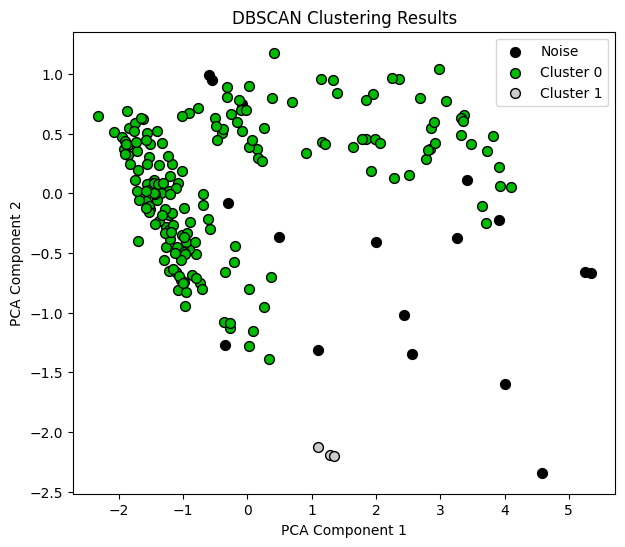

eps:  1.4
mins:  3


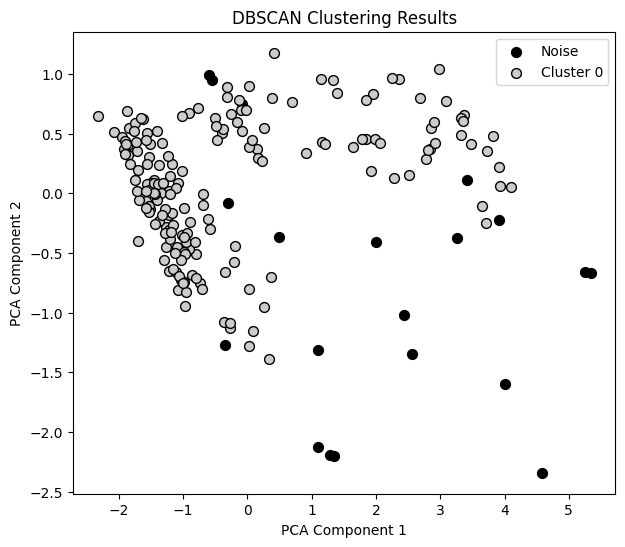

eps:  1.4
mins:  4


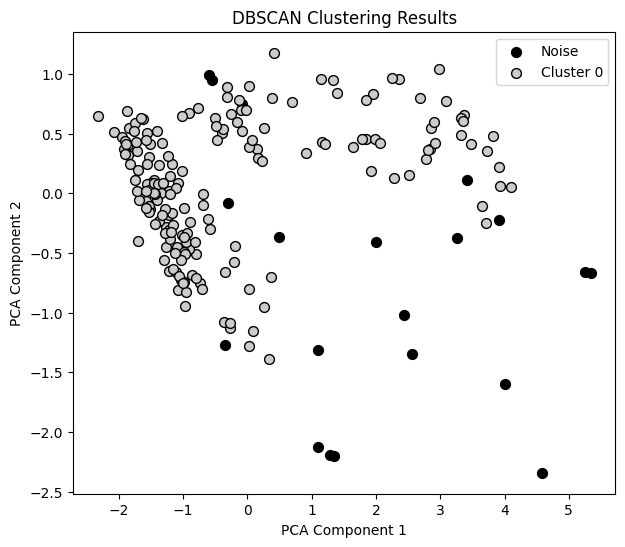

eps:  1.4
mins:  5


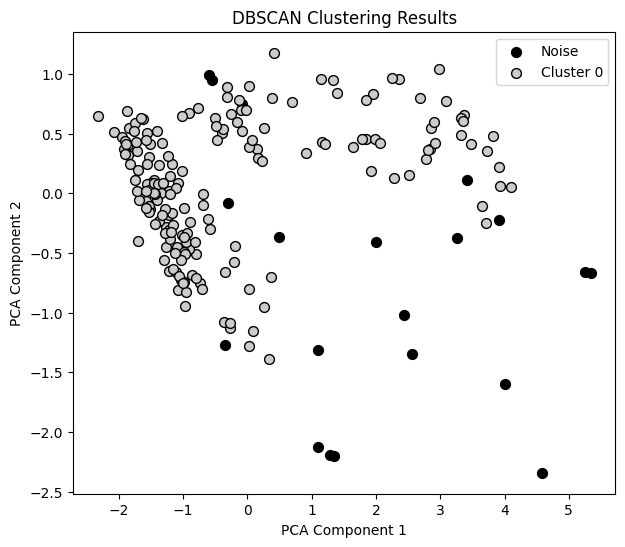

eps:  1.4
mins:  6


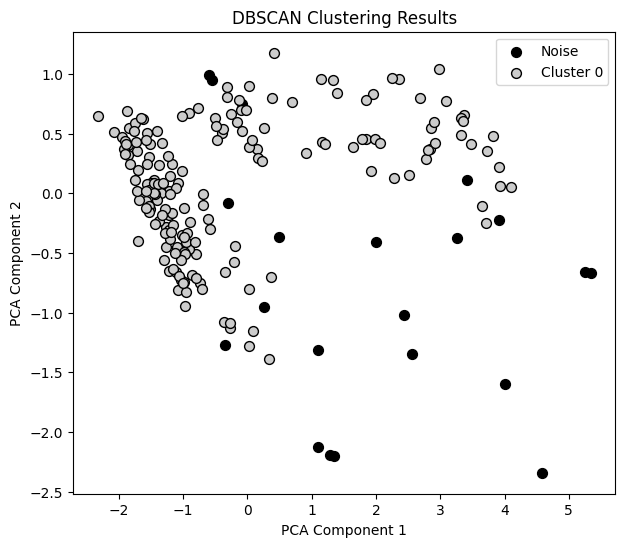

eps:  1.4
mins:  7


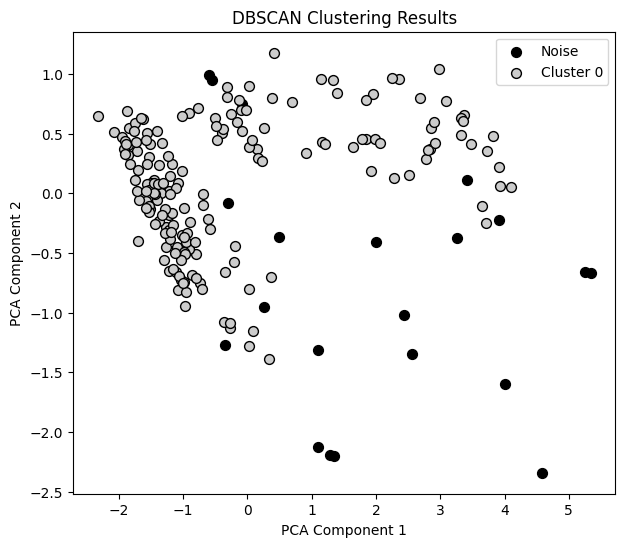

eps:  1.4
mins:  8


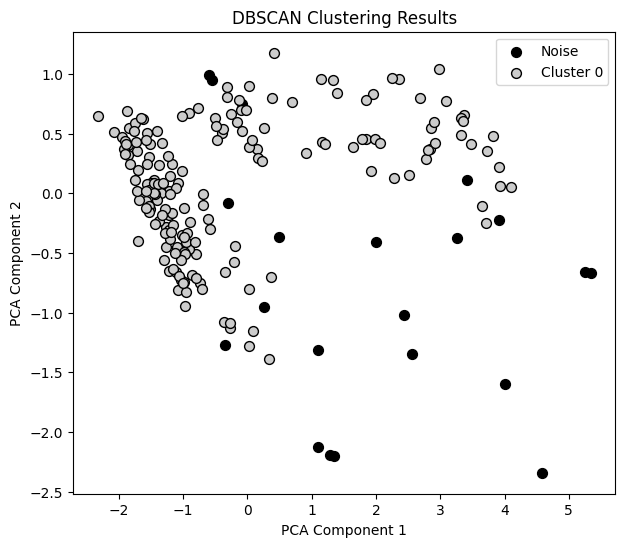

eps:  1.4
mins:  9


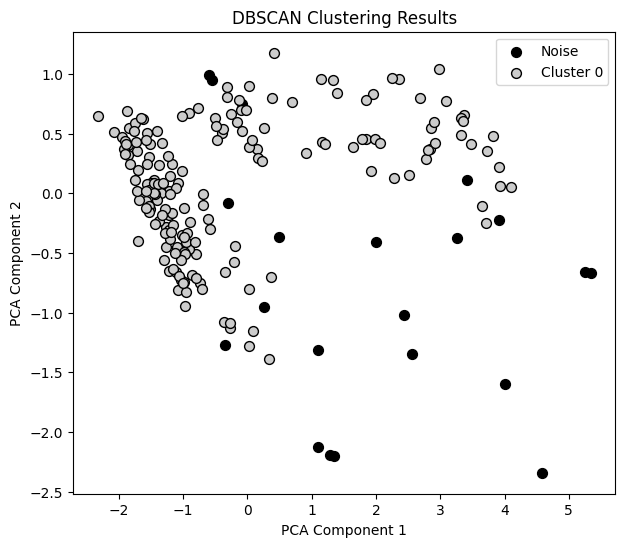

eps:  1.4
mins:  10


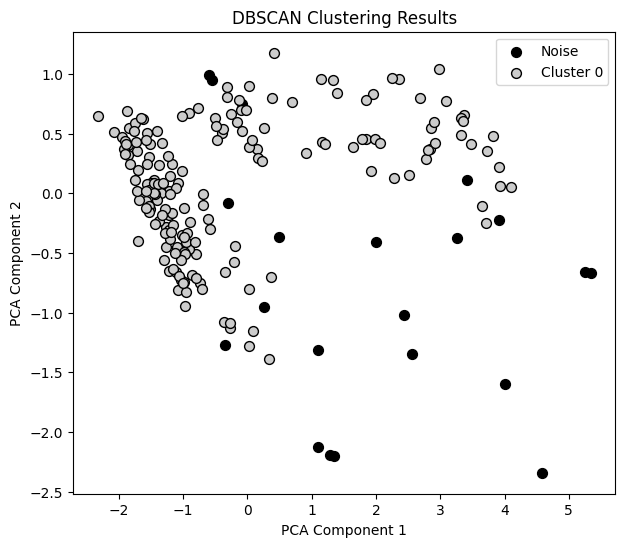

eps:  1.4
mins:  11


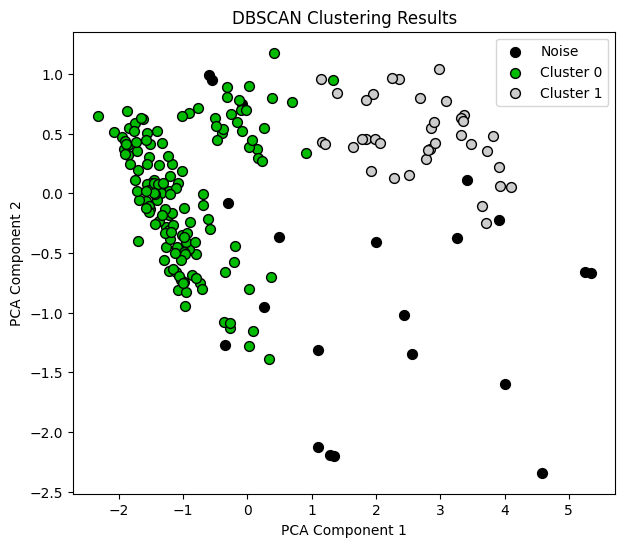

eps:  1.4
mins:  12


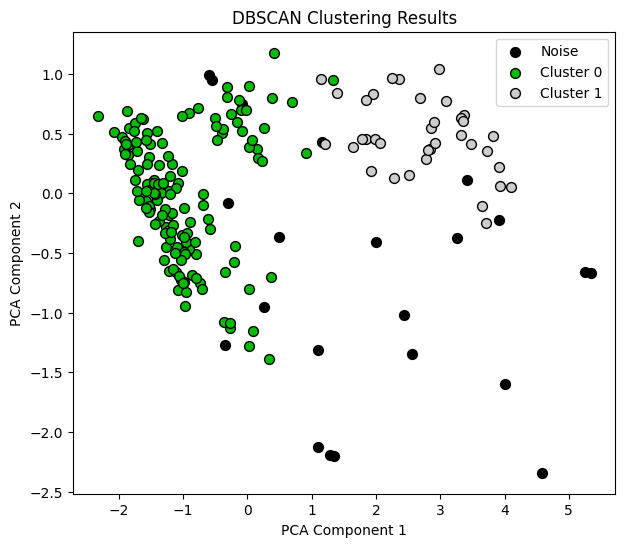

eps:  1.4
mins:  13


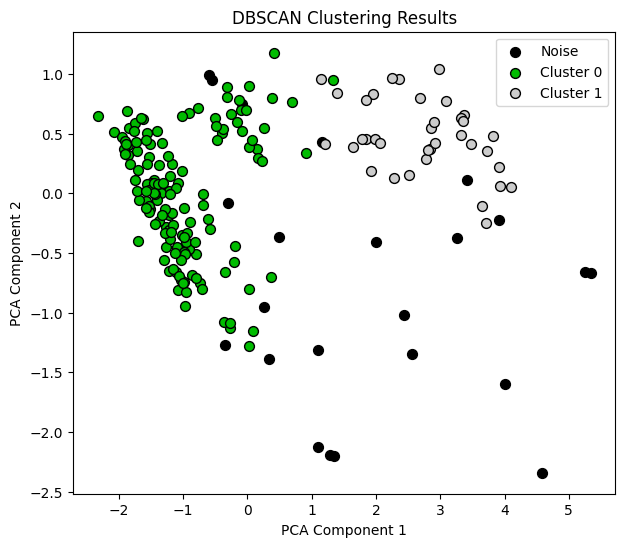

eps:  1.4
mins:  14


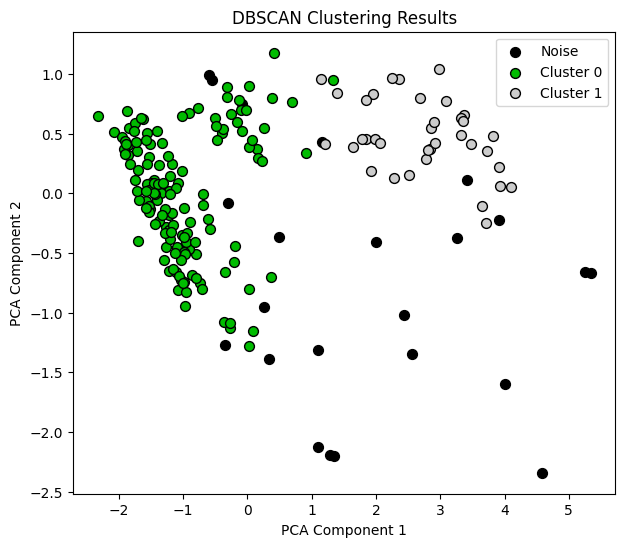

eps:  1.4
mins:  15


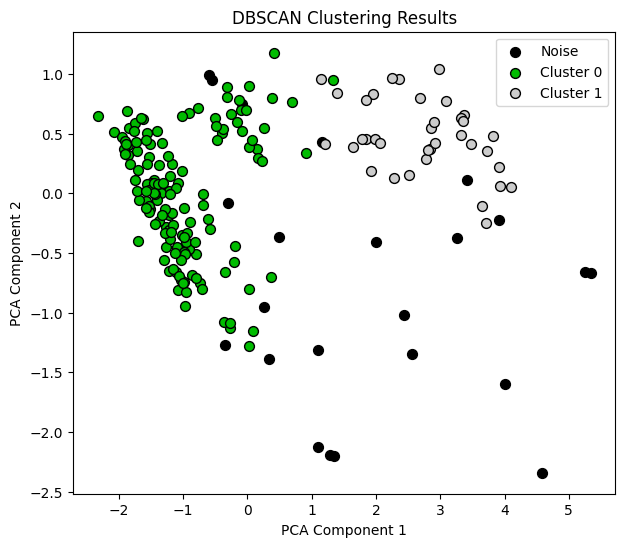

eps:  1.4
mins:  16


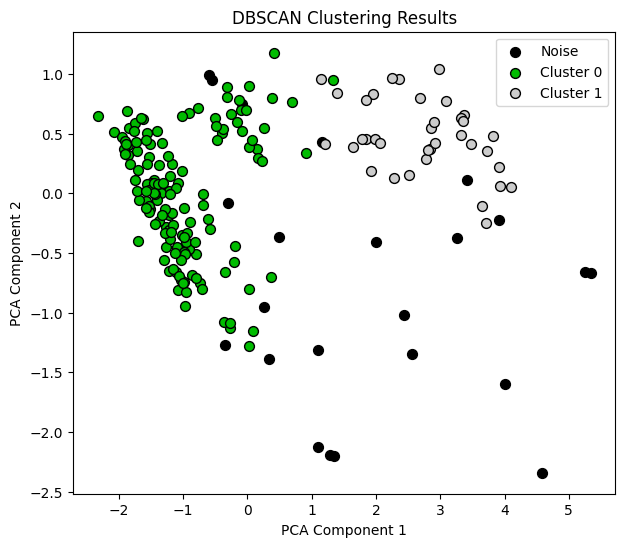

eps:  1.4
mins:  17


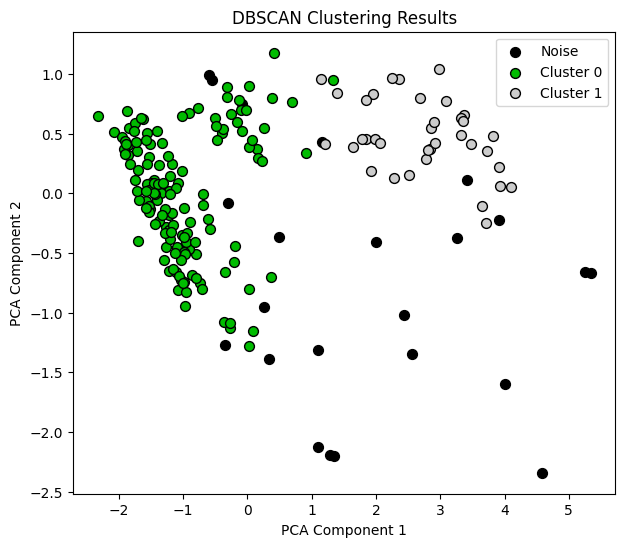

eps:  1.4
mins:  18


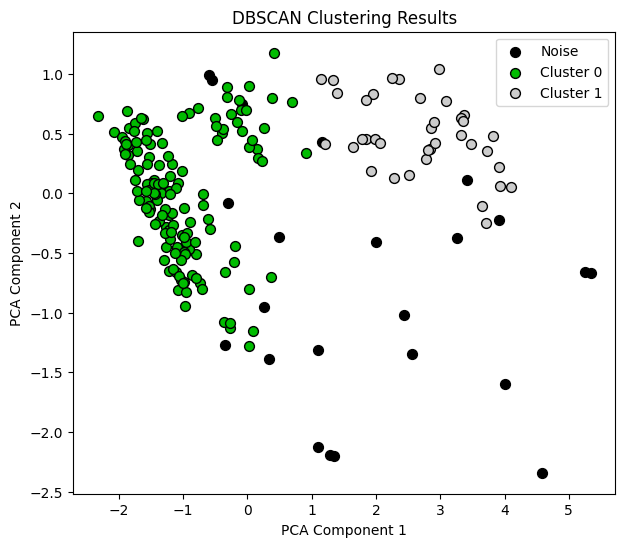

eps:  1.4
mins:  19


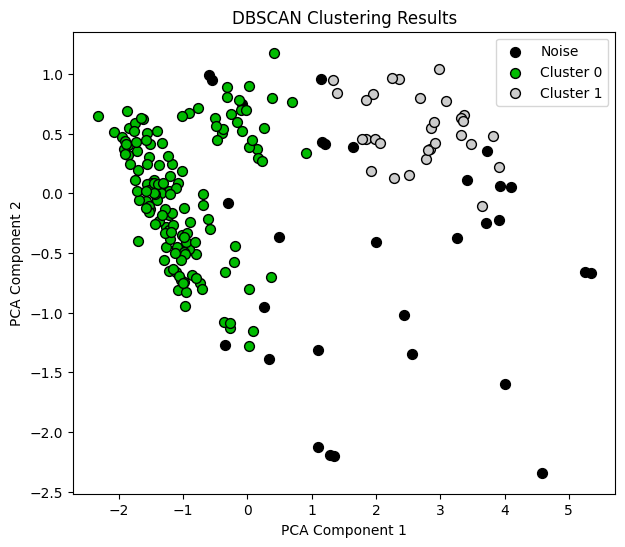

eps:  1.4
mins:  20


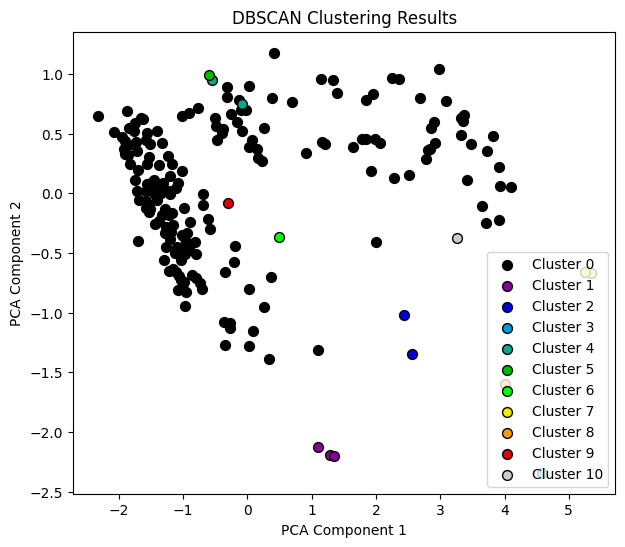

eps:  1.5
mins:  1


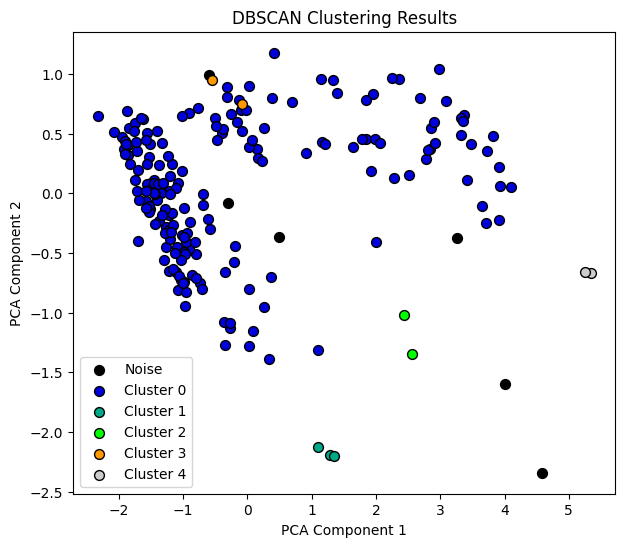

eps:  1.5
mins:  2


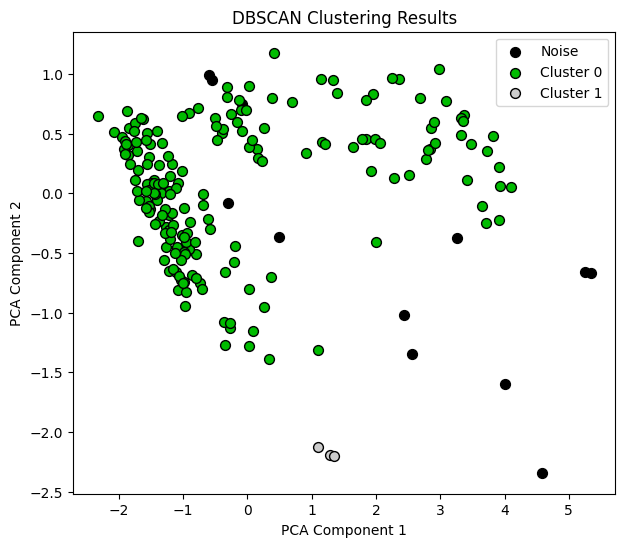

eps:  1.5
mins:  3


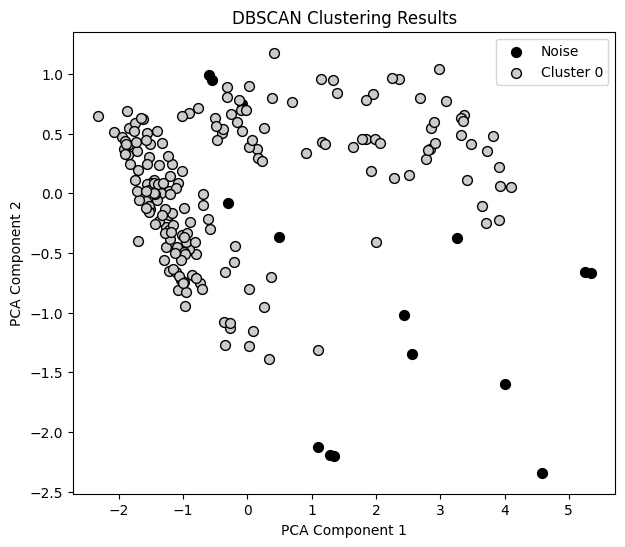

eps:  1.5
mins:  4


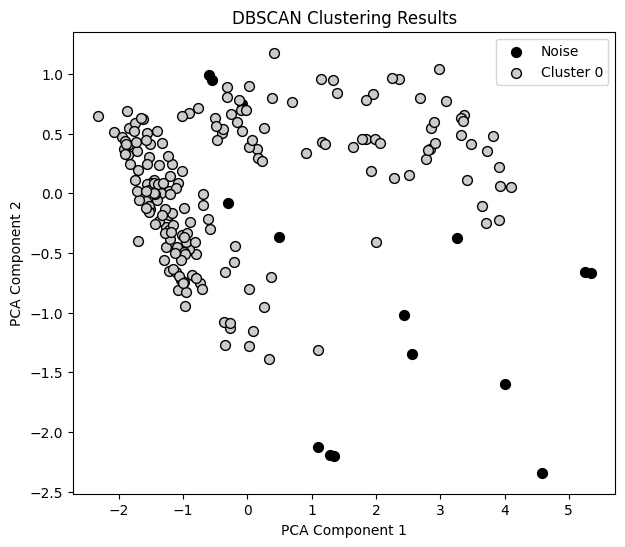

eps:  1.5
mins:  5


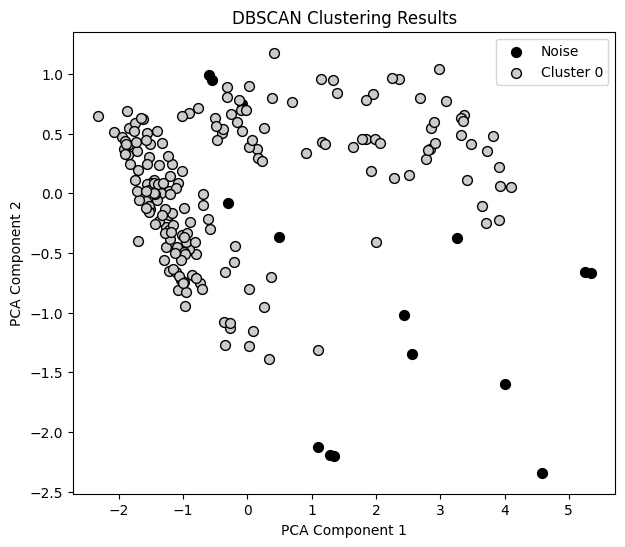

eps:  1.5
mins:  6


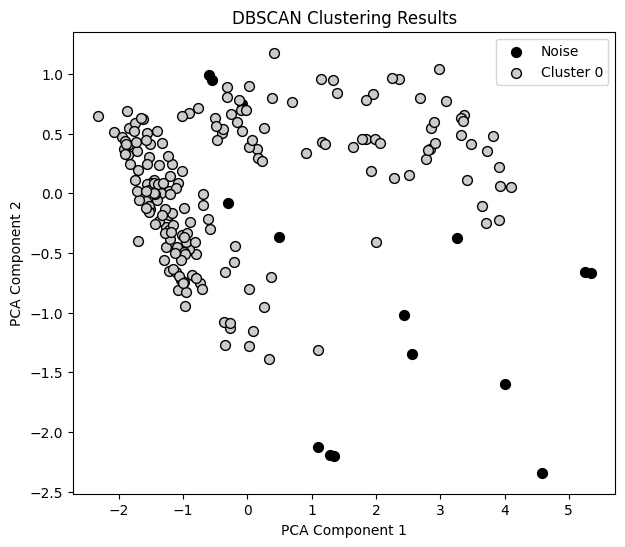

eps:  1.5
mins:  7


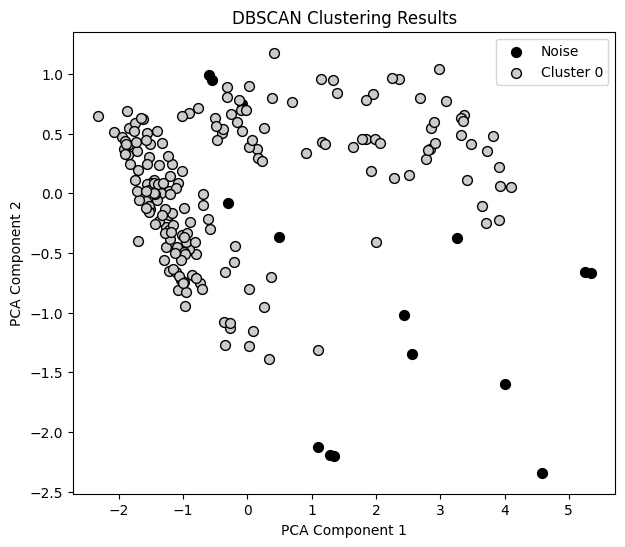

eps:  1.5
mins:  8


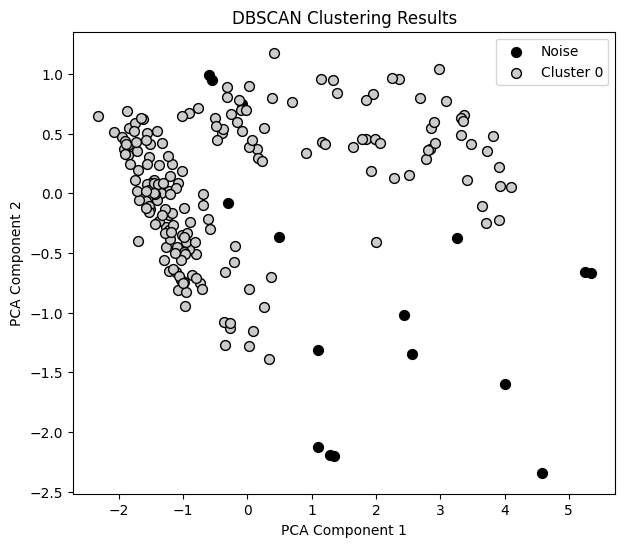

eps:  1.5
mins:  9


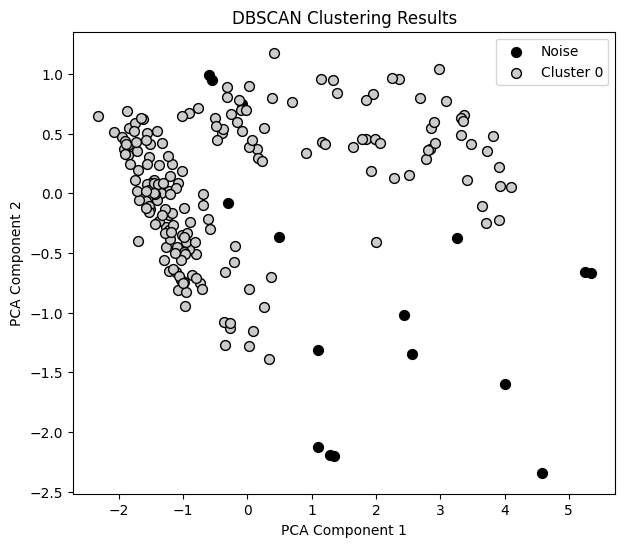

eps:  1.5
mins:  10


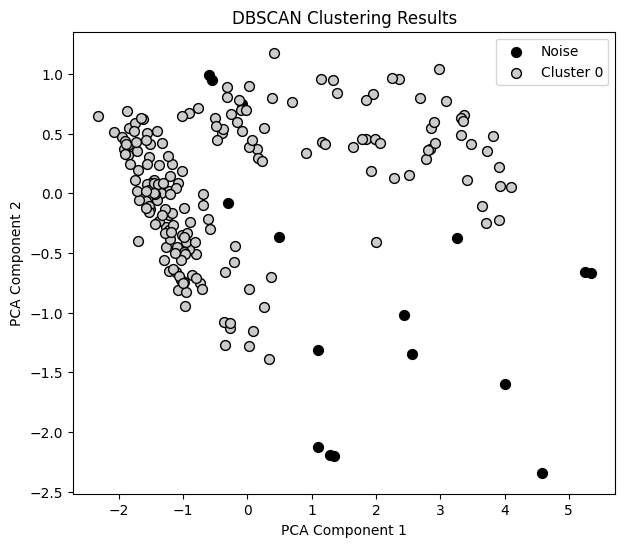

eps:  1.5
mins:  11


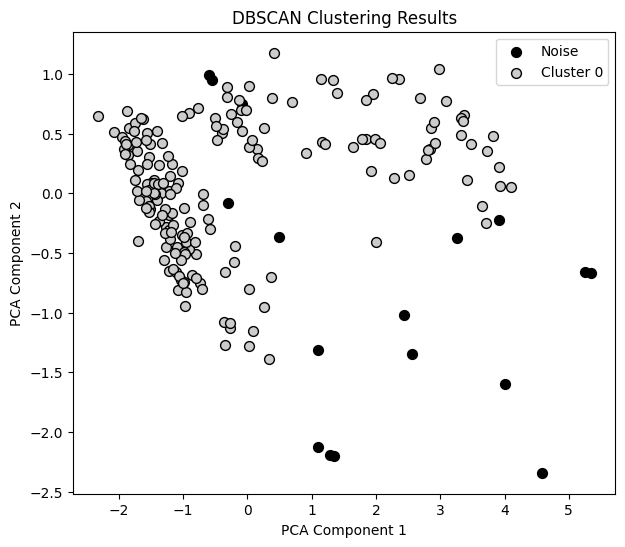

eps:  1.5
mins:  12


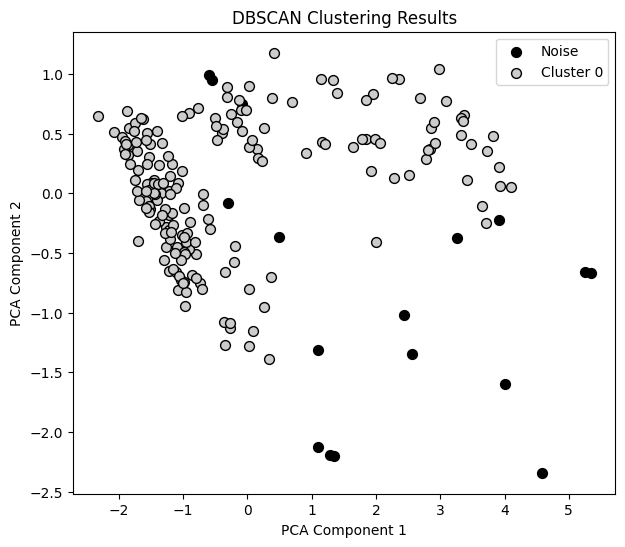

eps:  1.5
mins:  13


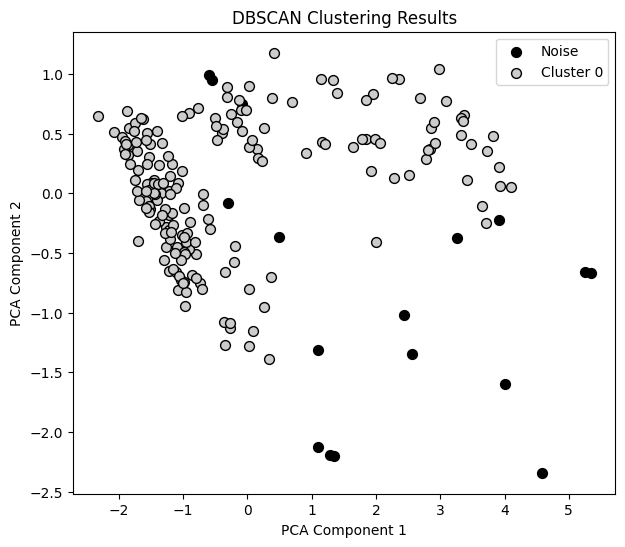

eps:  1.5
mins:  14


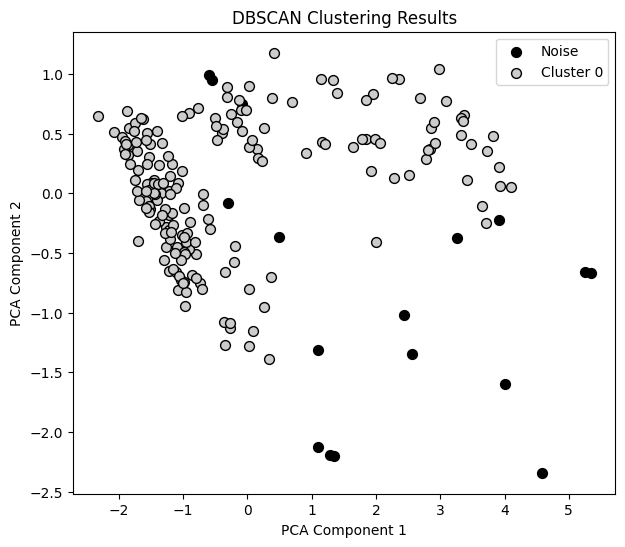

eps:  1.5
mins:  15


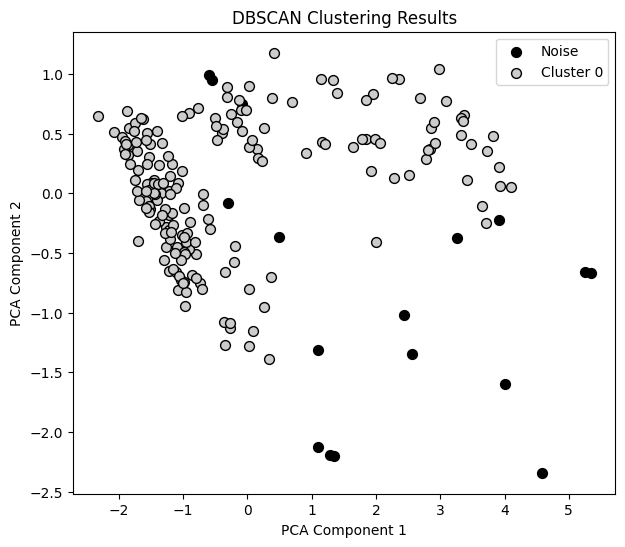

eps:  1.5
mins:  16


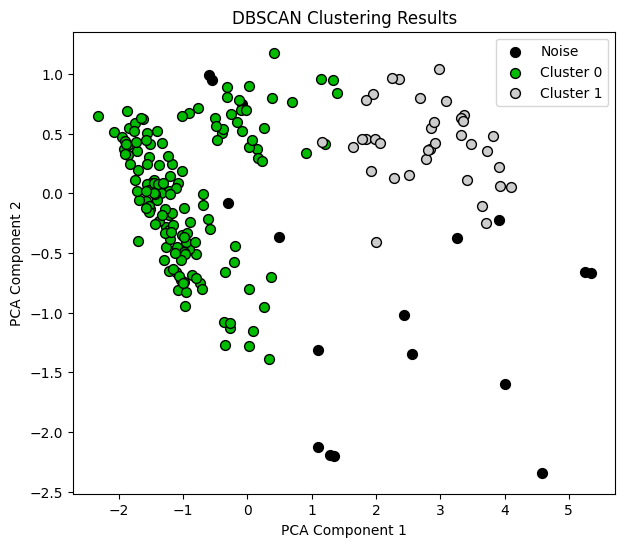

eps:  1.5
mins:  17


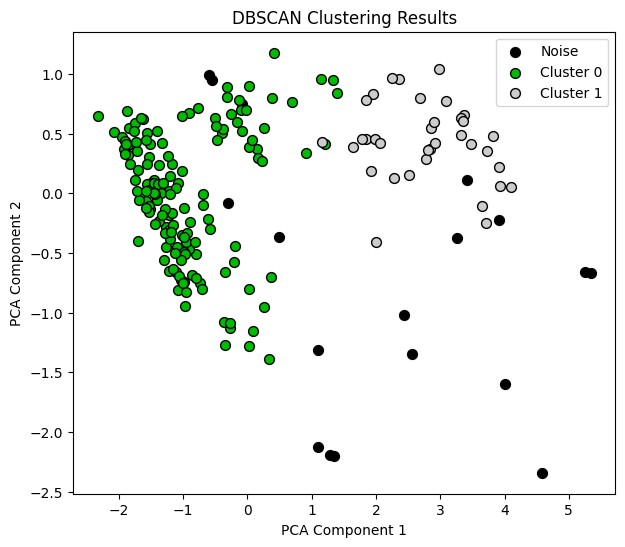

eps:  1.5
mins:  18


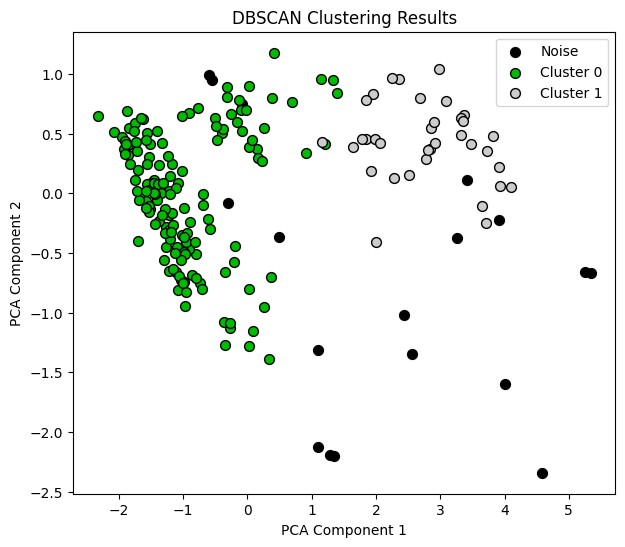

eps:  1.5
mins:  19


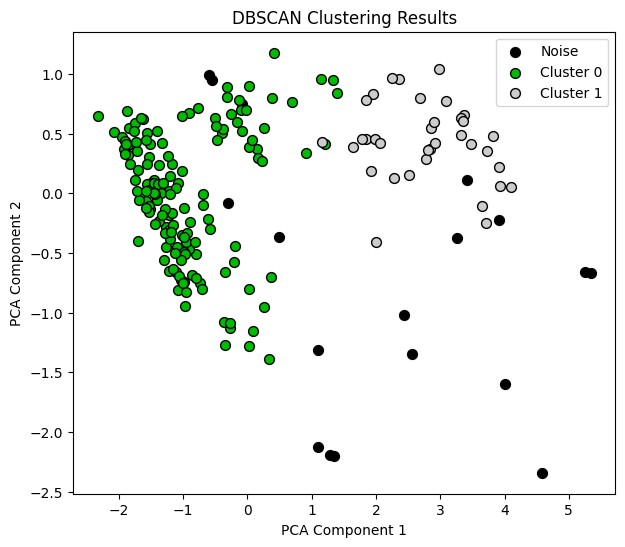

eps:  1.5
mins:  20


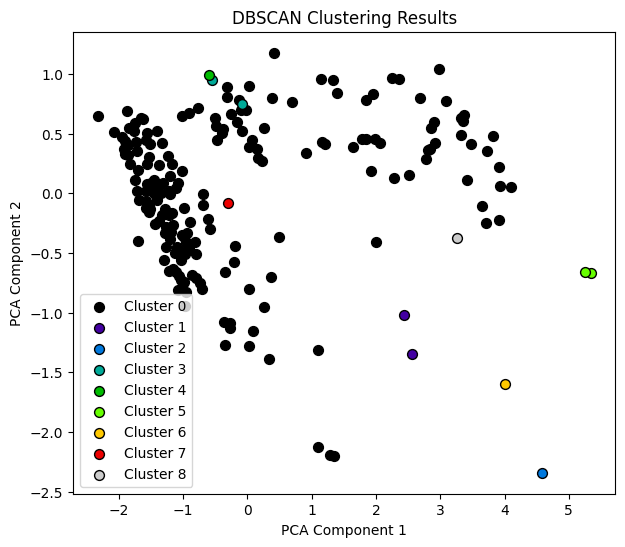

eps:  1.6
mins:  1


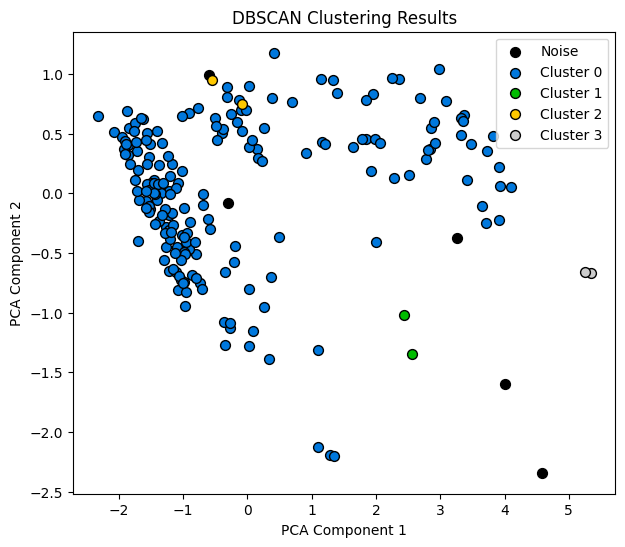

eps:  1.6
mins:  2


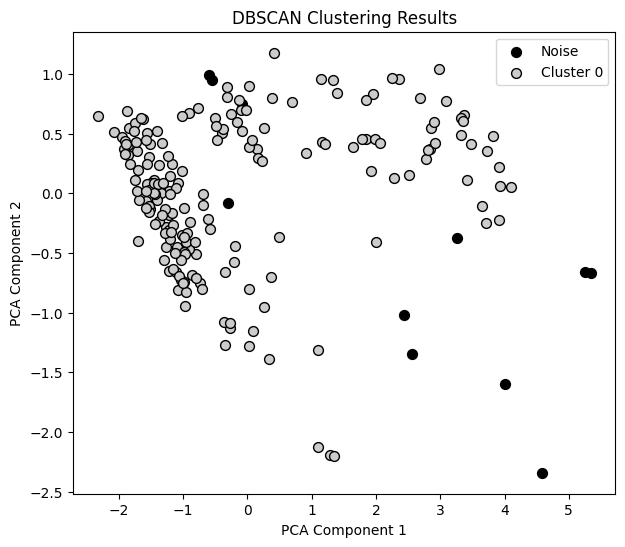

eps:  1.6
mins:  3


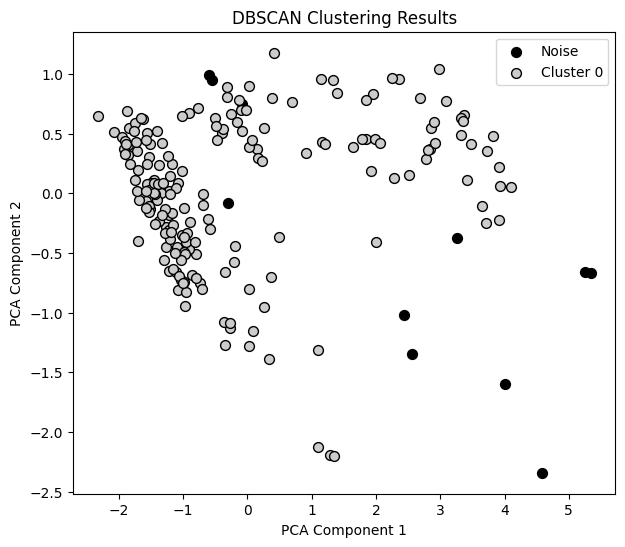

eps:  1.6
mins:  4


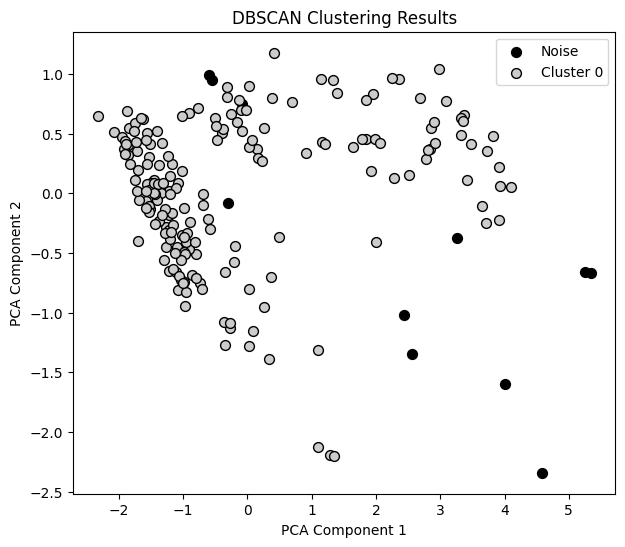

eps:  1.6
mins:  5


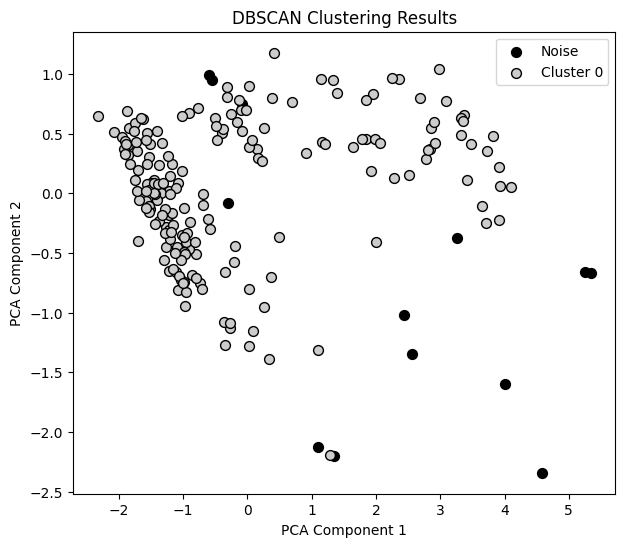

eps:  1.6
mins:  6


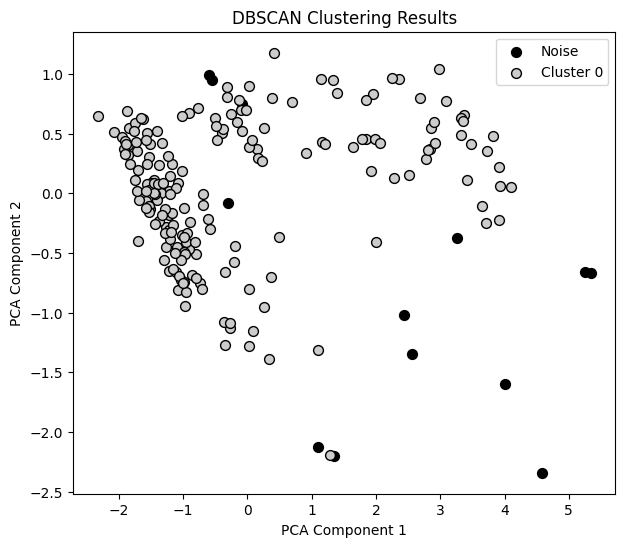

eps:  1.6
mins:  7


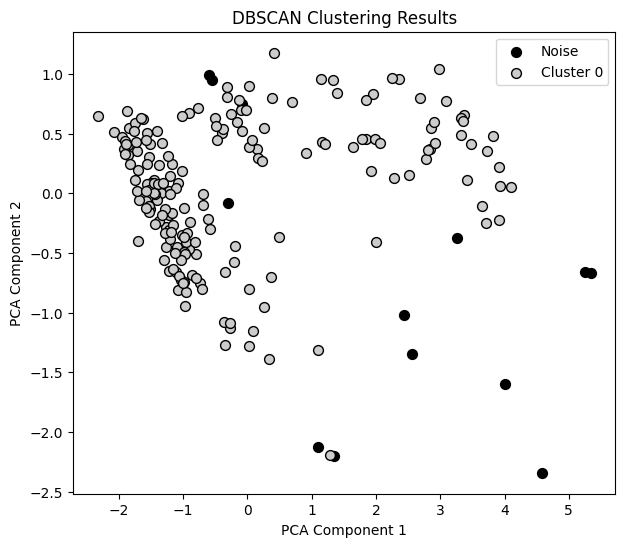

eps:  1.6
mins:  8


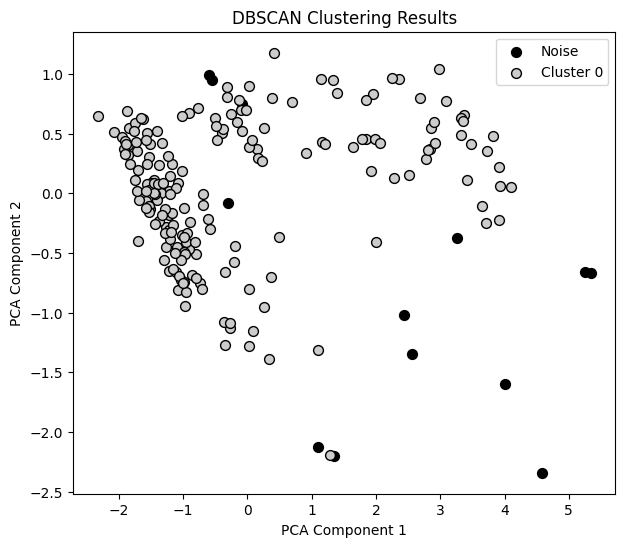

eps:  1.6
mins:  9


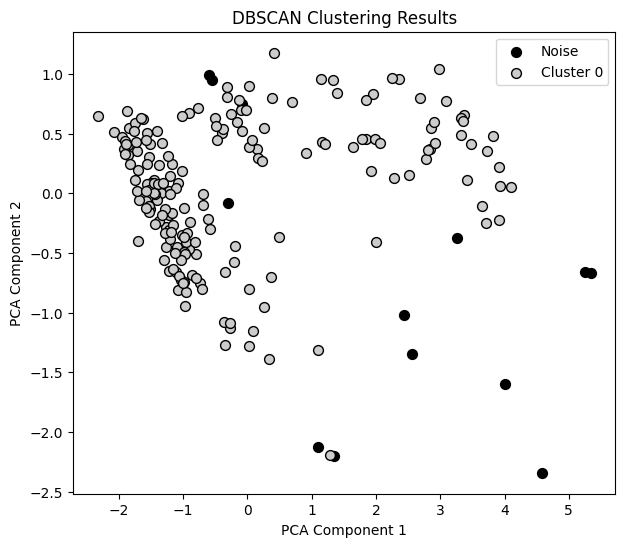

eps:  1.6
mins:  10


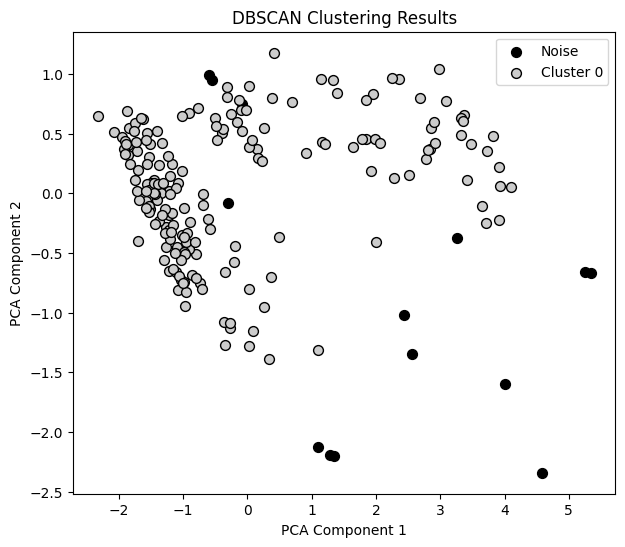

eps:  1.6
mins:  11


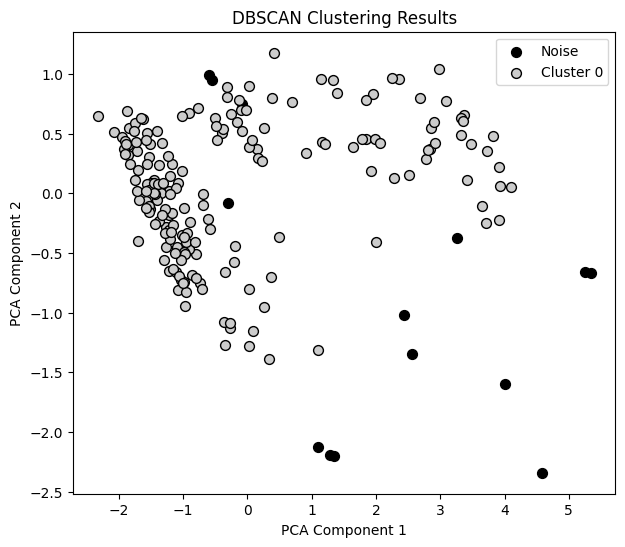

eps:  1.6
mins:  12


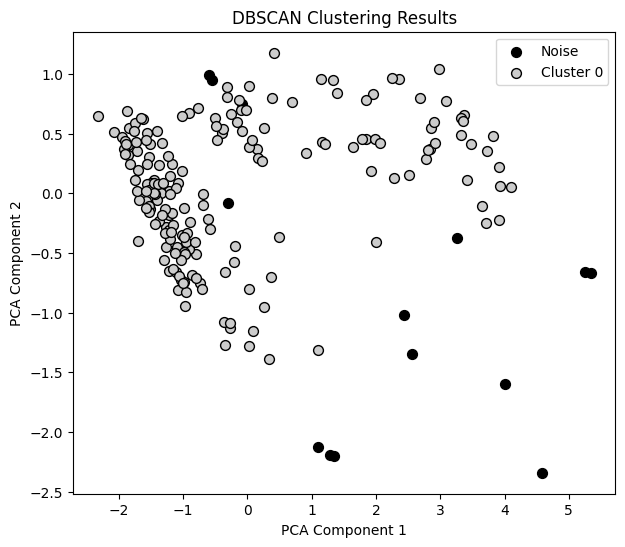

eps:  1.6
mins:  13


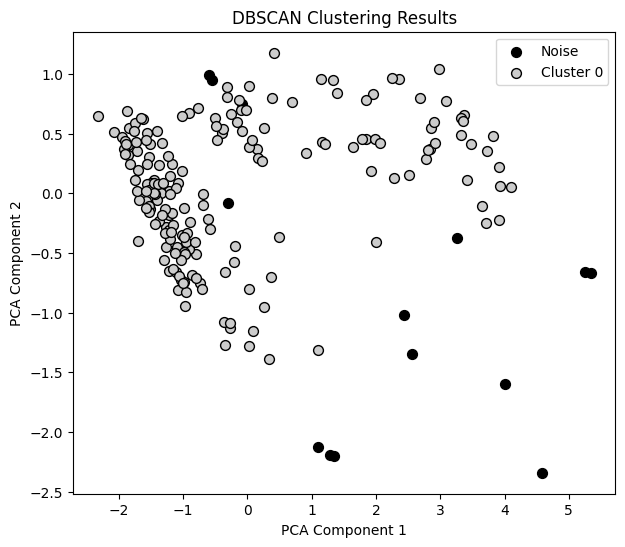

eps:  1.6
mins:  14


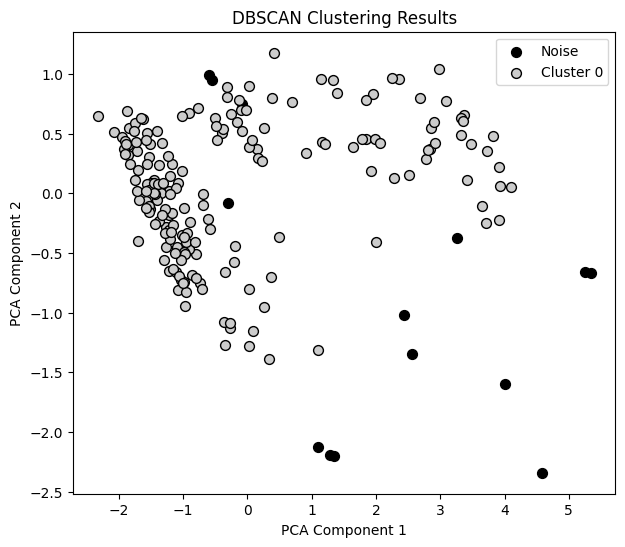

eps:  1.6
mins:  15


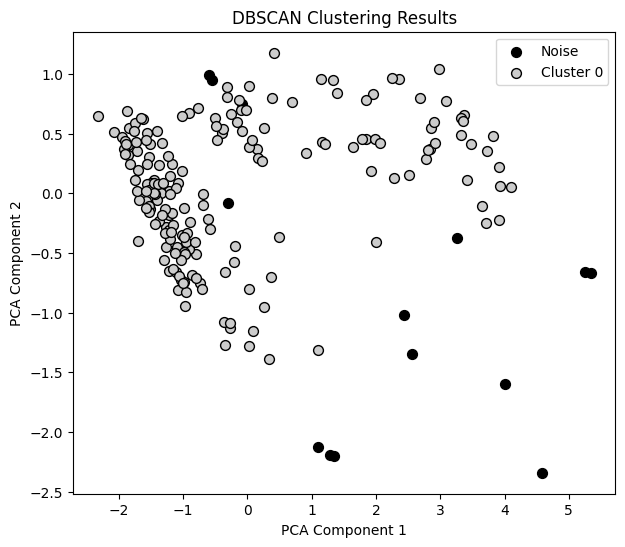

eps:  1.6
mins:  16


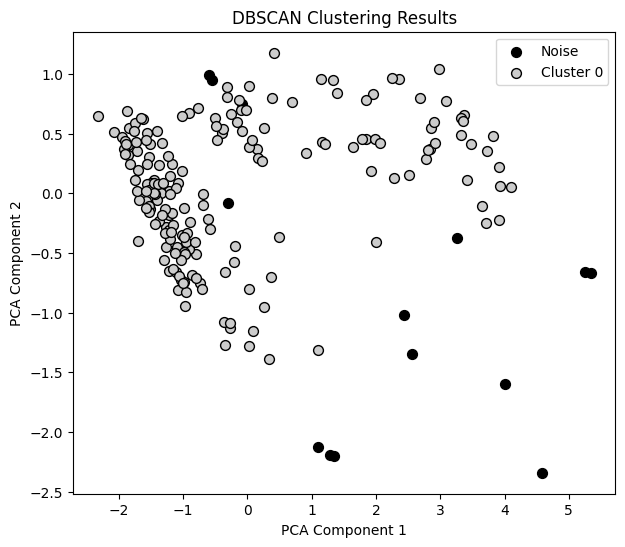

eps:  1.6
mins:  17


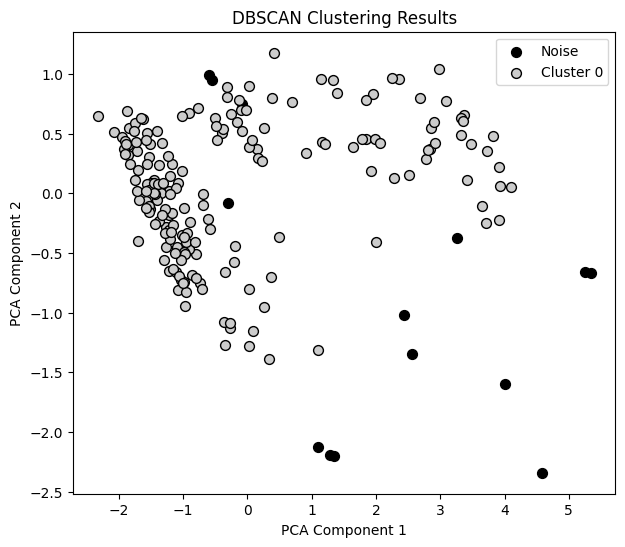

eps:  1.6
mins:  18


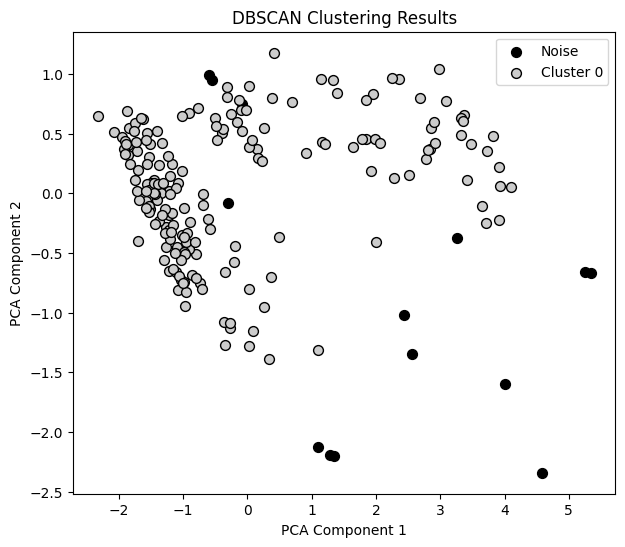

eps:  1.6
mins:  19


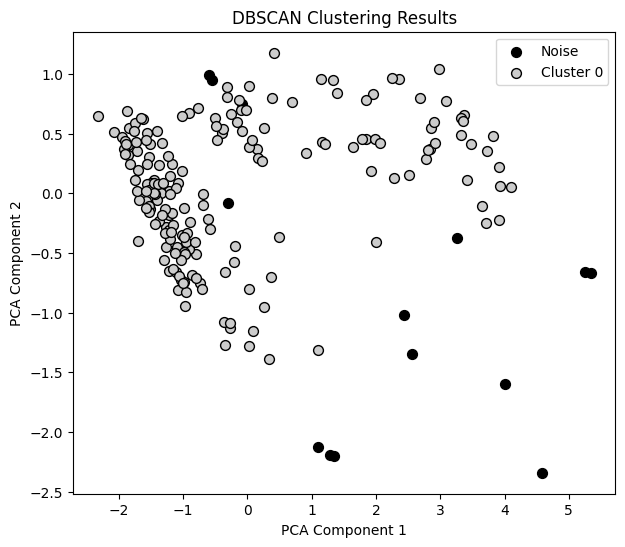

eps:  1.6
mins:  20


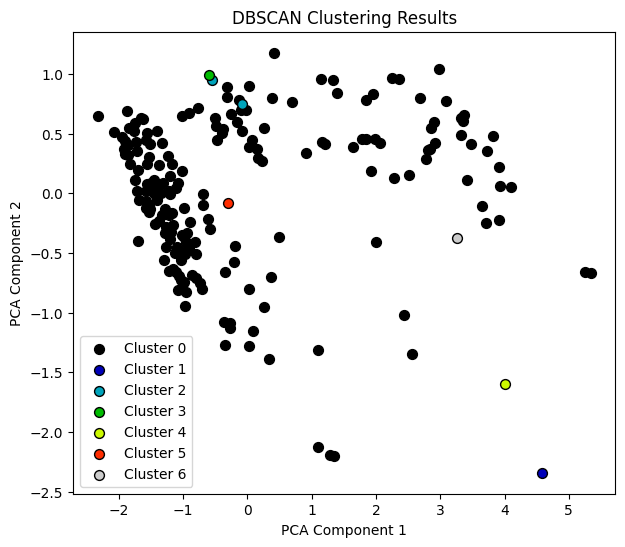

eps:  1.7
mins:  1


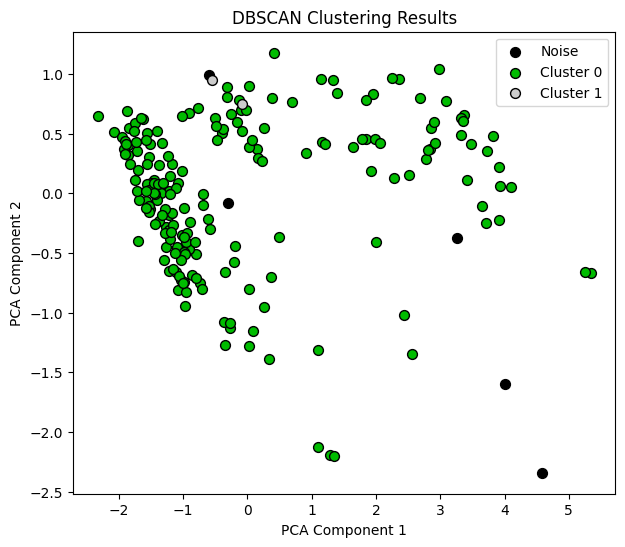

eps:  1.7
mins:  2


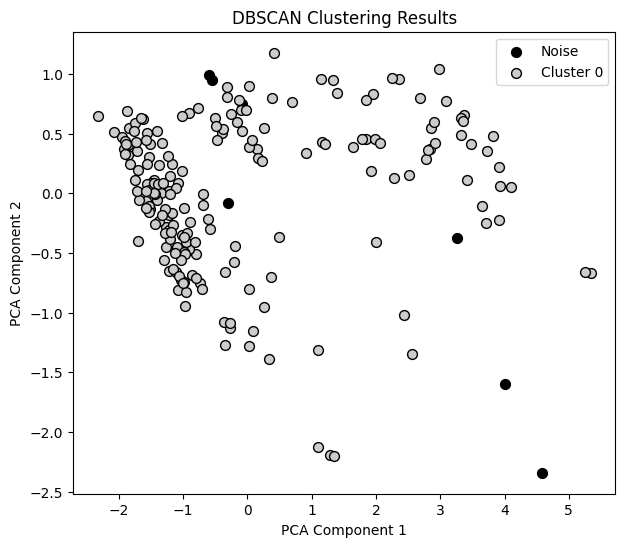

eps:  1.7
mins:  3


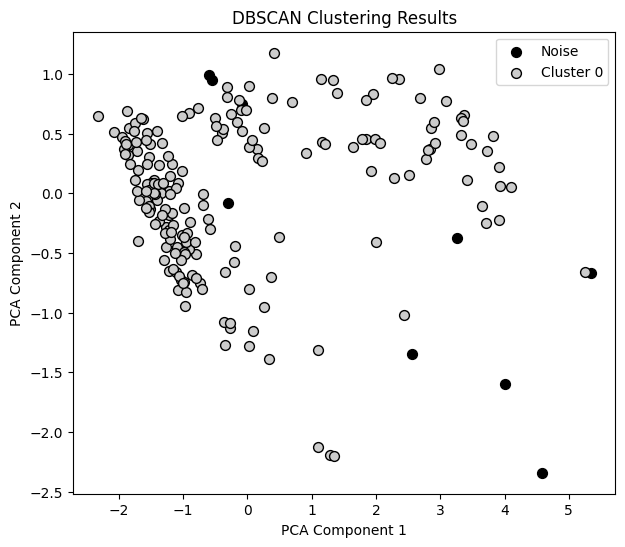

eps:  1.7
mins:  4


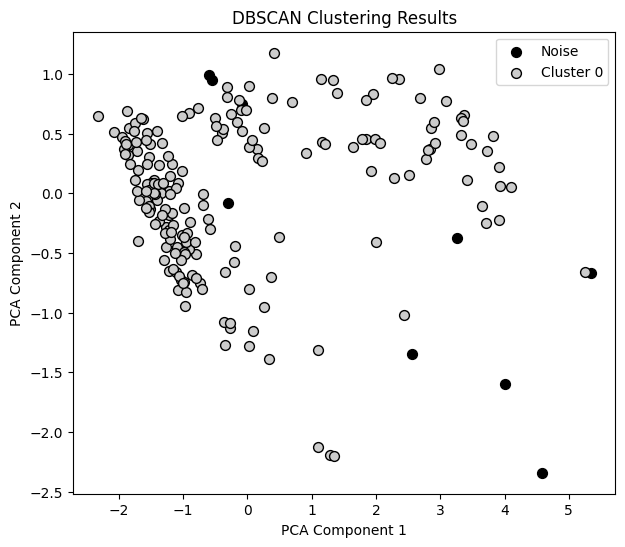

eps:  1.7
mins:  5


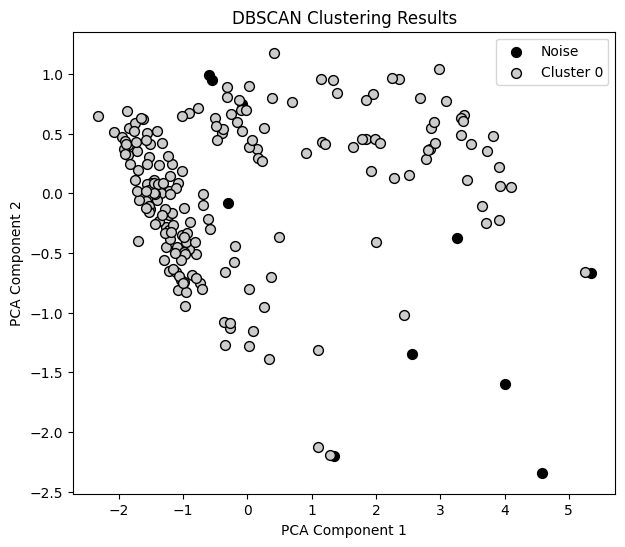

eps:  1.7
mins:  6


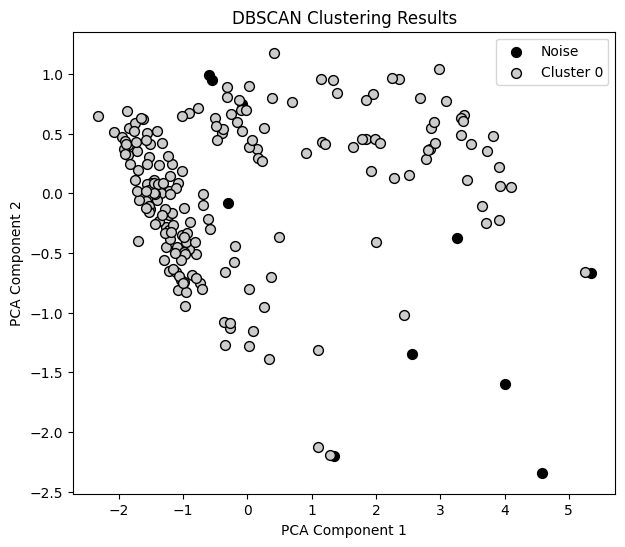

eps:  1.7
mins:  7


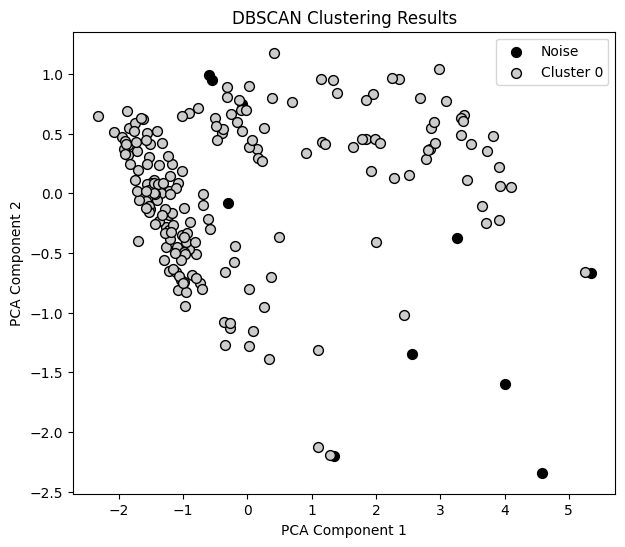

eps:  1.7
mins:  8


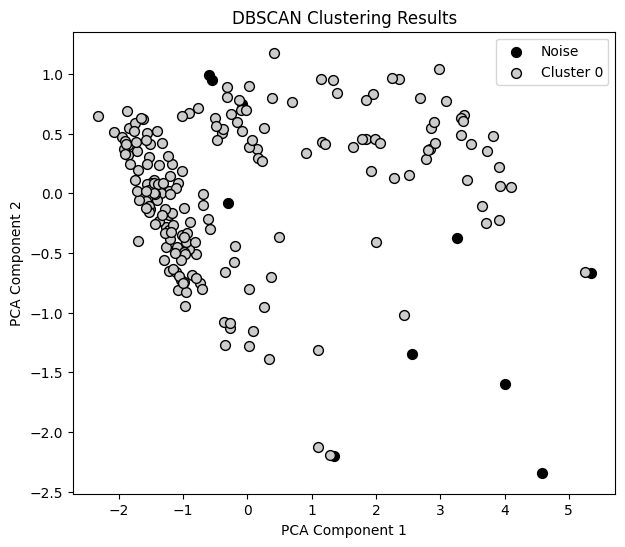

eps:  1.7
mins:  9


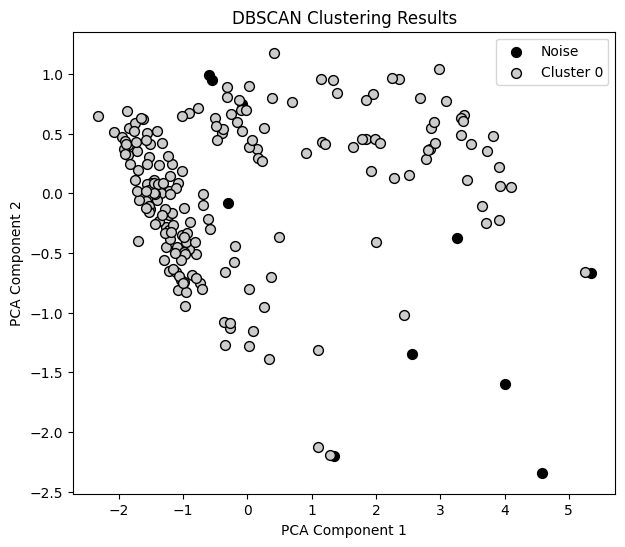

eps:  1.7
mins:  10


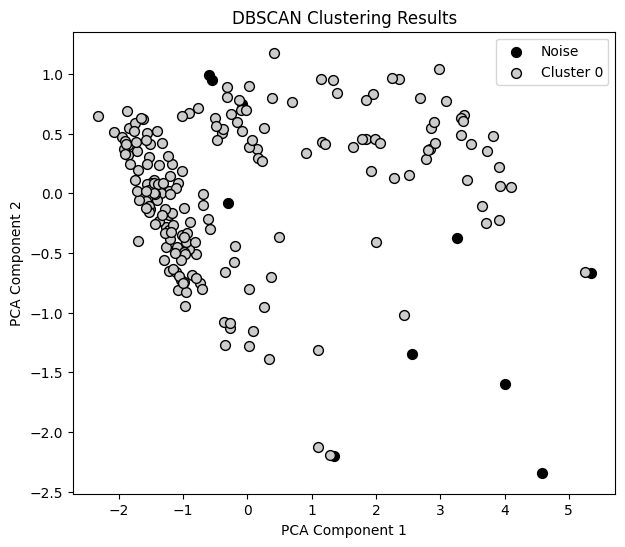

eps:  1.7
mins:  11


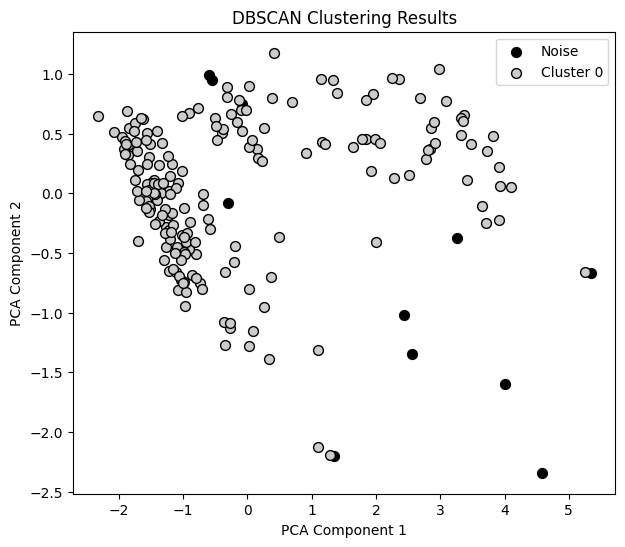

eps:  1.7
mins:  12


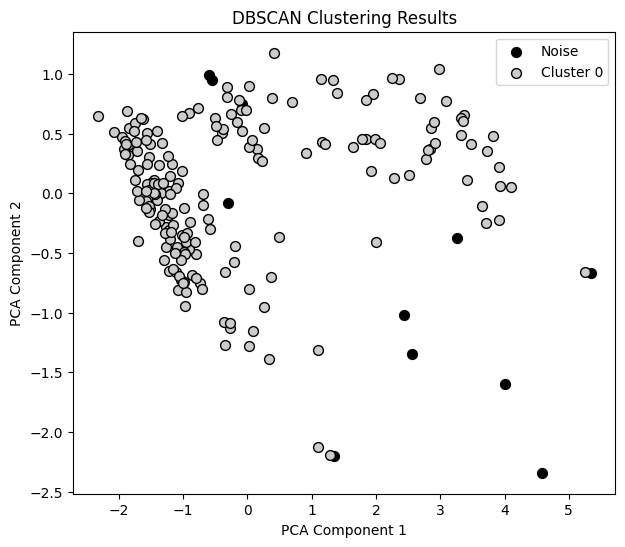

eps:  1.7
mins:  13


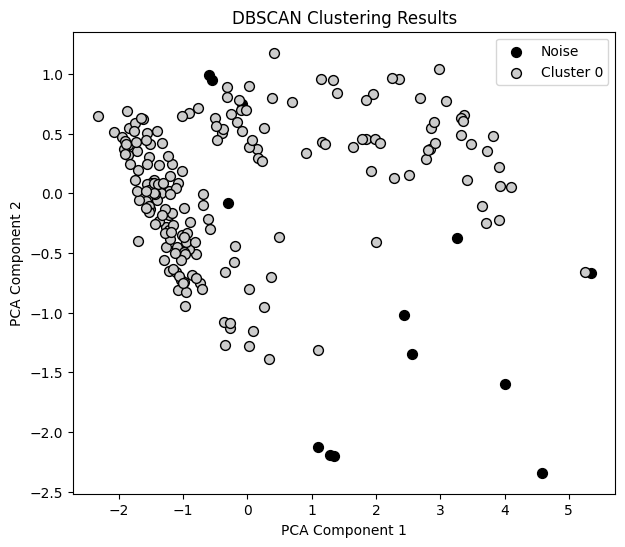

eps:  1.7
mins:  14


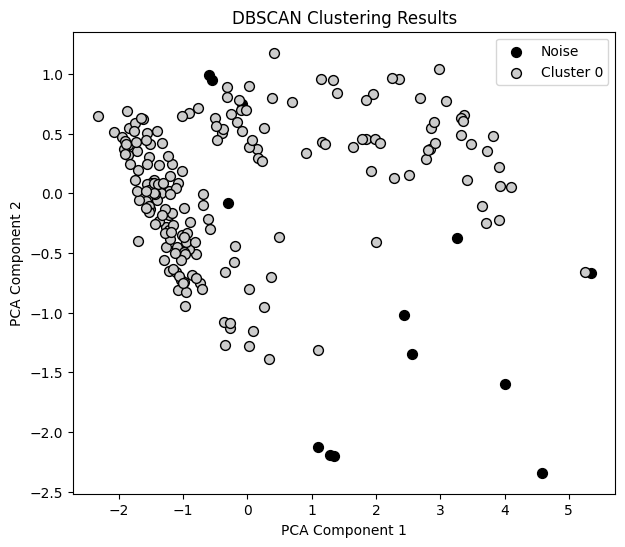

eps:  1.7
mins:  15


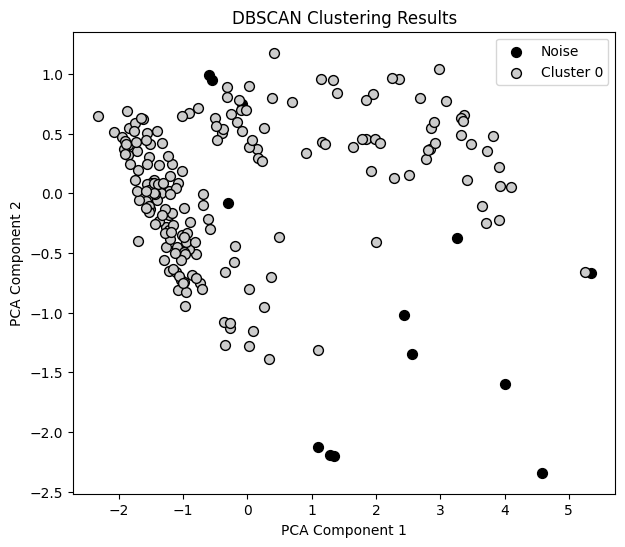

eps:  1.7
mins:  16


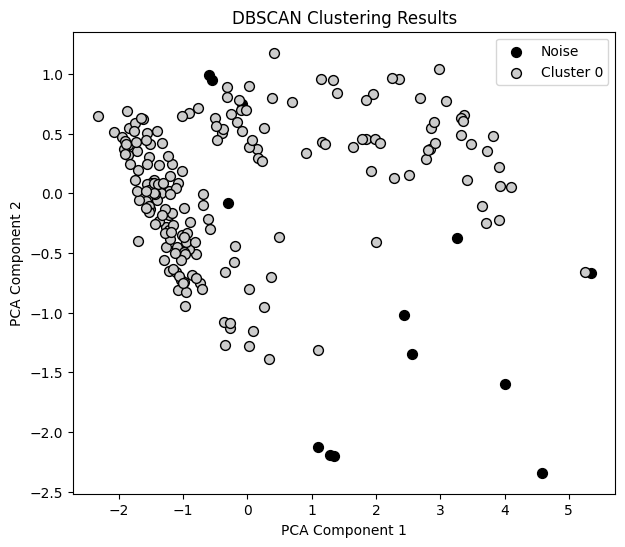

eps:  1.7
mins:  17


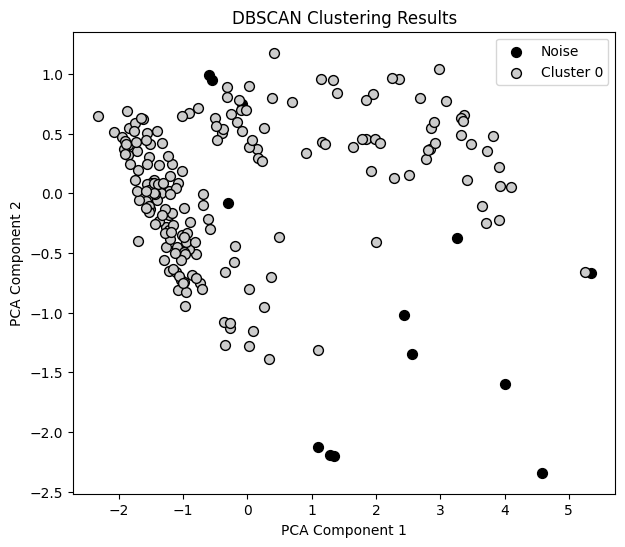

eps:  1.7
mins:  18


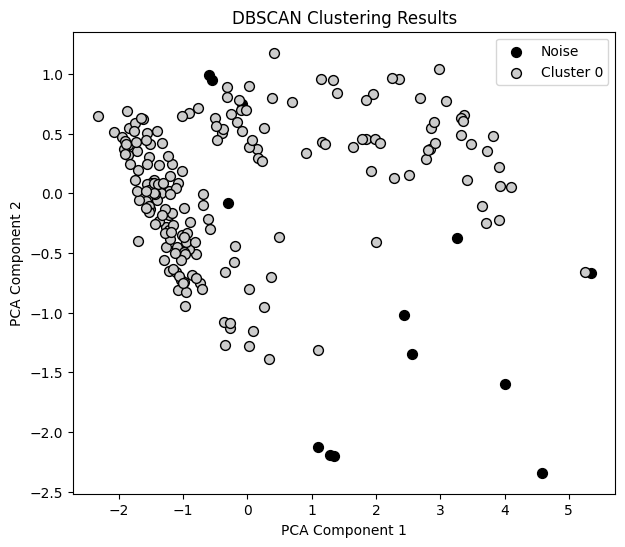

eps:  1.7
mins:  19


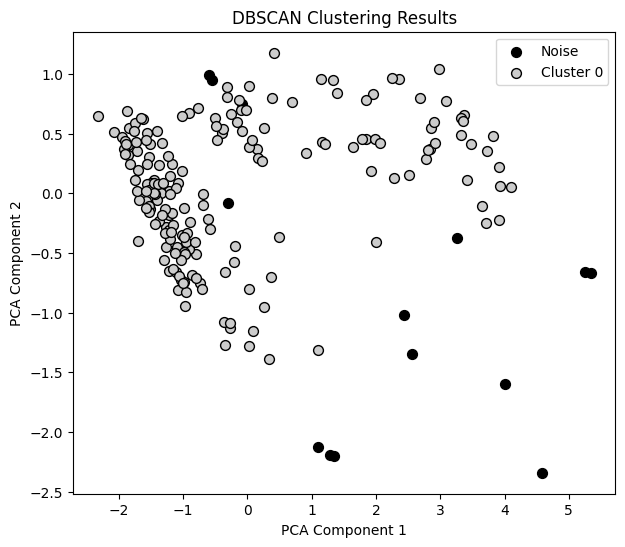

eps:  1.7
mins:  20


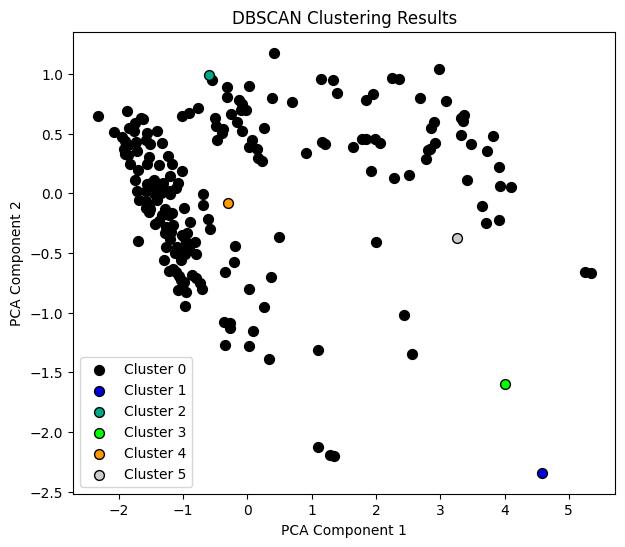

eps:  1.8
mins:  1


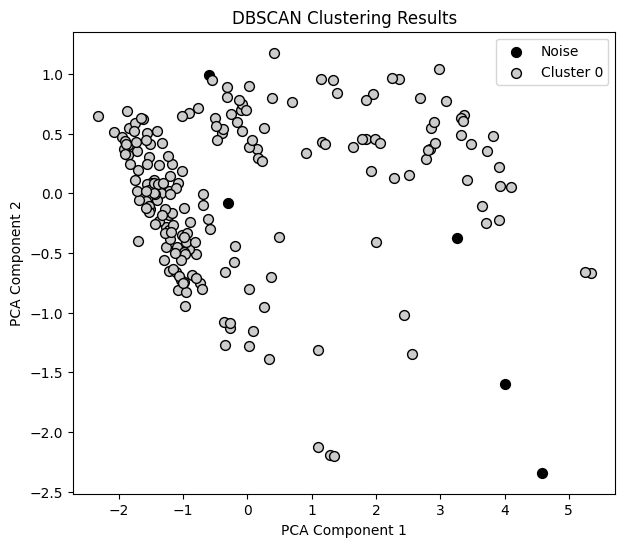

eps:  1.8
mins:  2


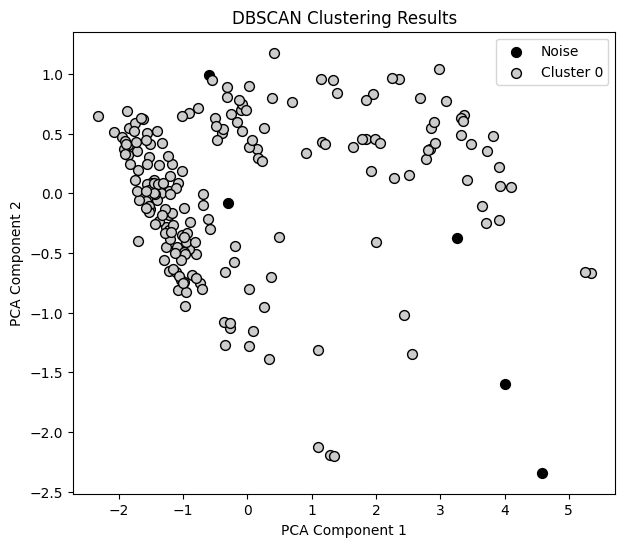

eps:  1.8
mins:  3


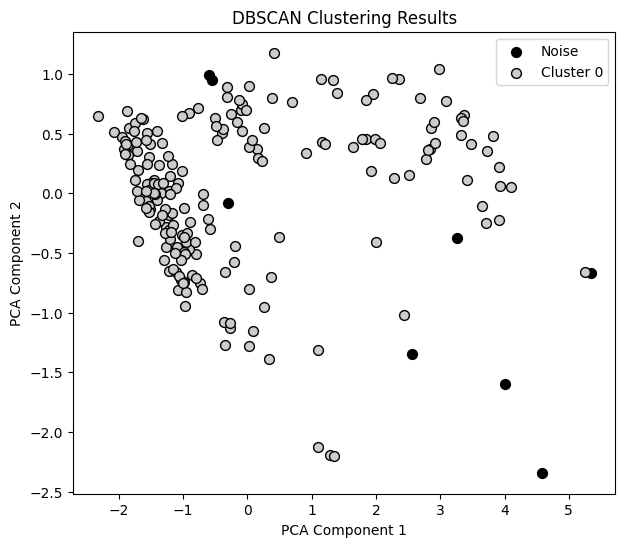

eps:  1.8
mins:  4


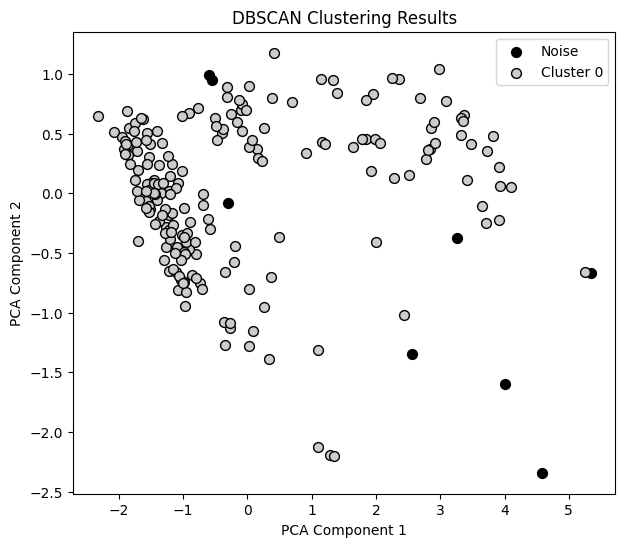

eps:  1.8
mins:  5


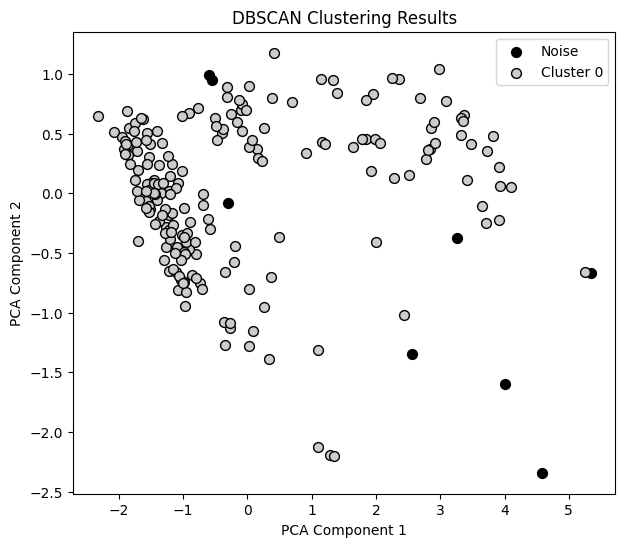

eps:  1.8
mins:  6


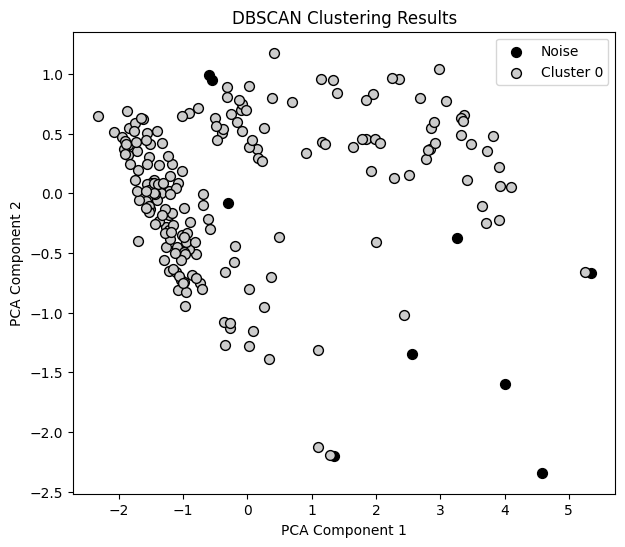

eps:  1.8
mins:  7


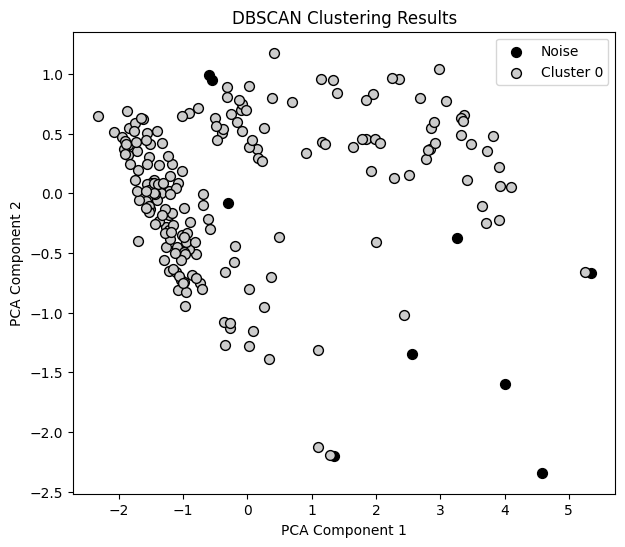

eps:  1.8
mins:  8


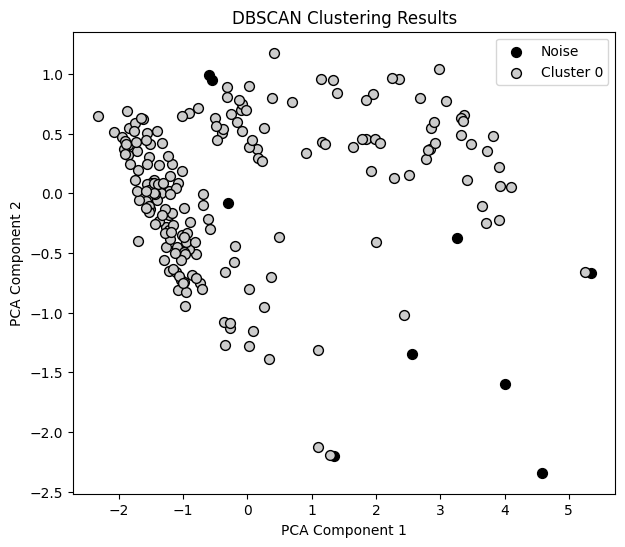

eps:  1.8
mins:  9


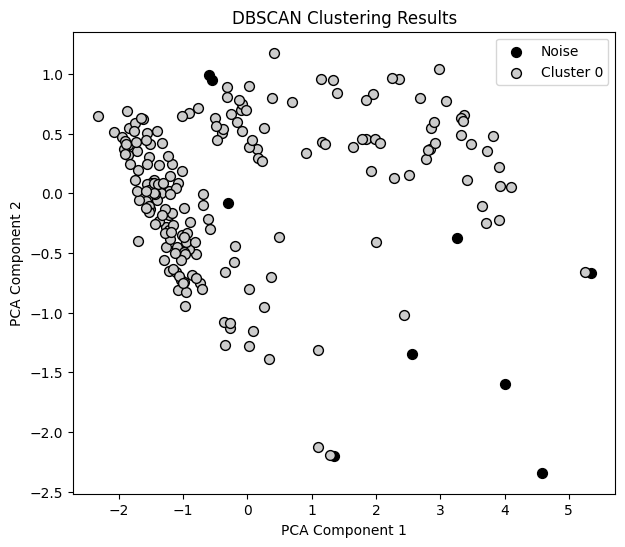

eps:  1.8
mins:  10


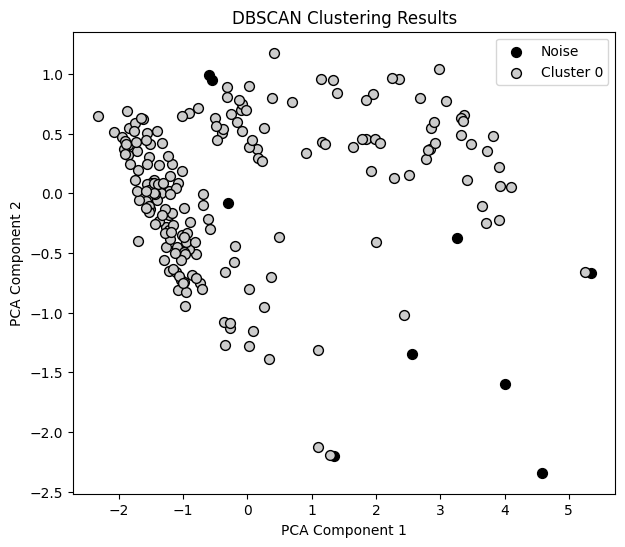

eps:  1.8
mins:  11


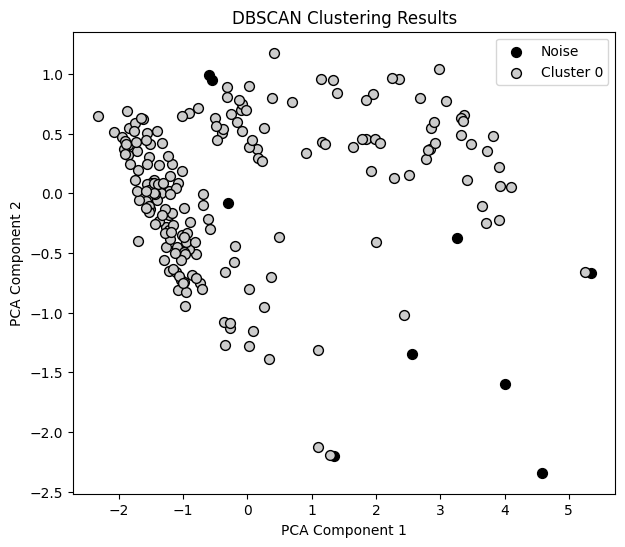

eps:  1.8
mins:  12


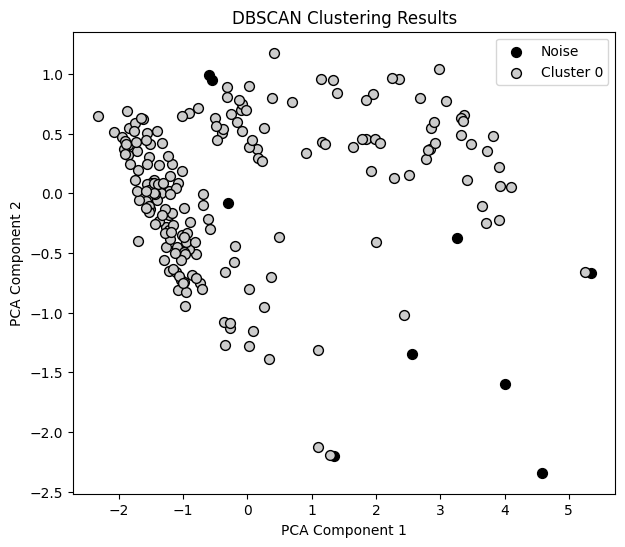

eps:  1.8
mins:  13


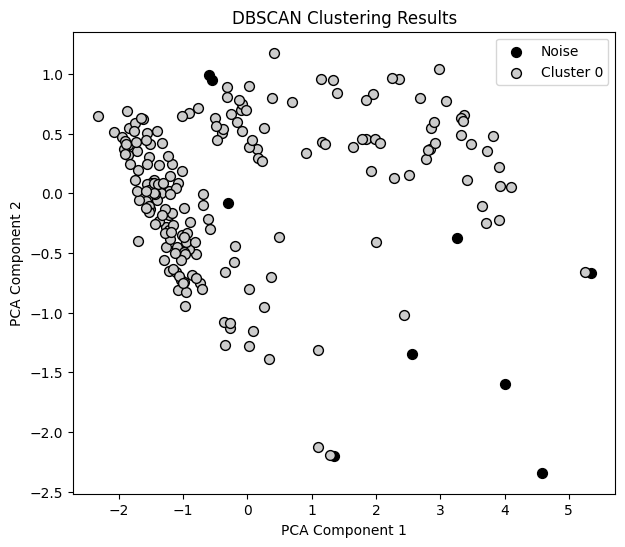

eps:  1.8
mins:  14


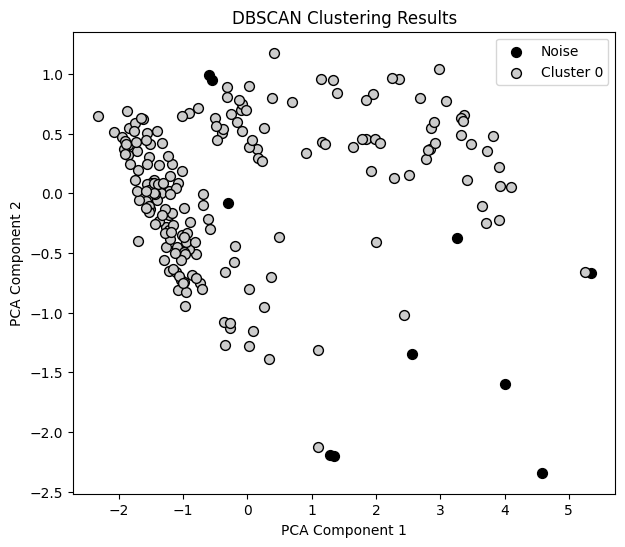

eps:  1.8
mins:  15


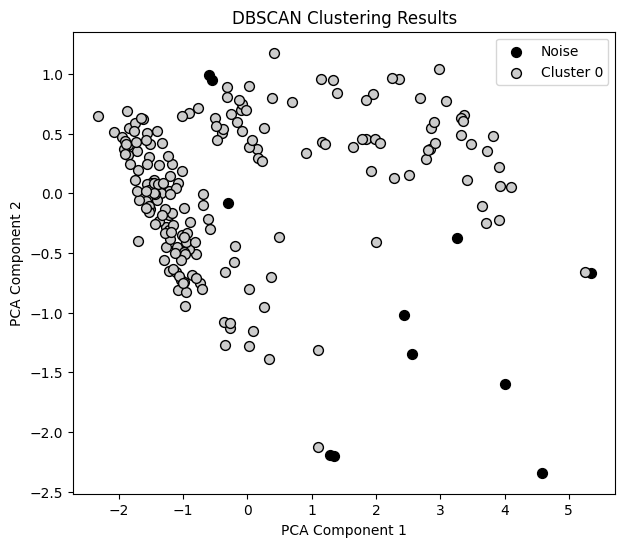

eps:  1.8
mins:  16


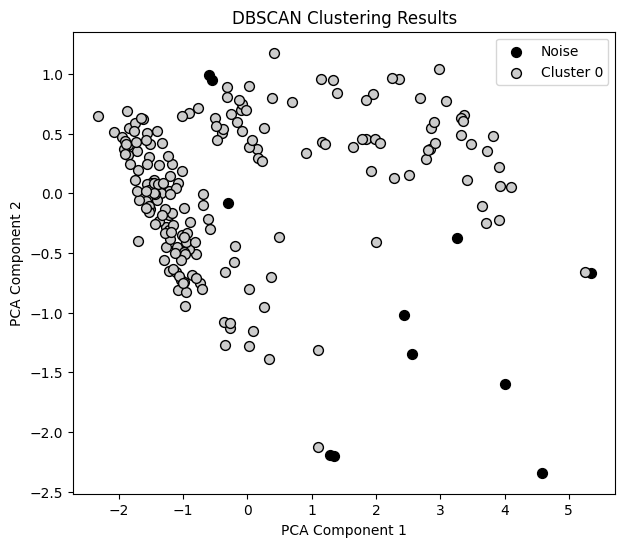

eps:  1.8
mins:  17


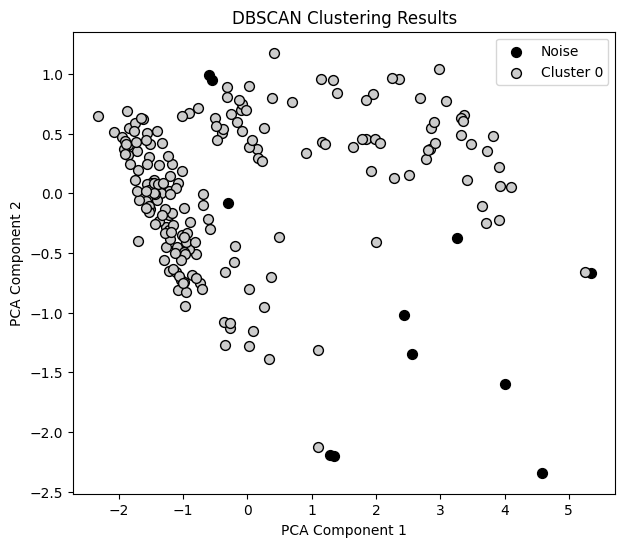

eps:  1.8
mins:  18


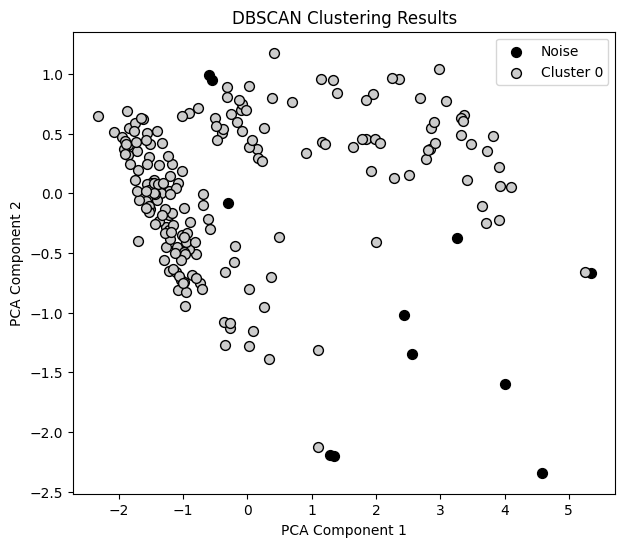

eps:  1.8
mins:  19


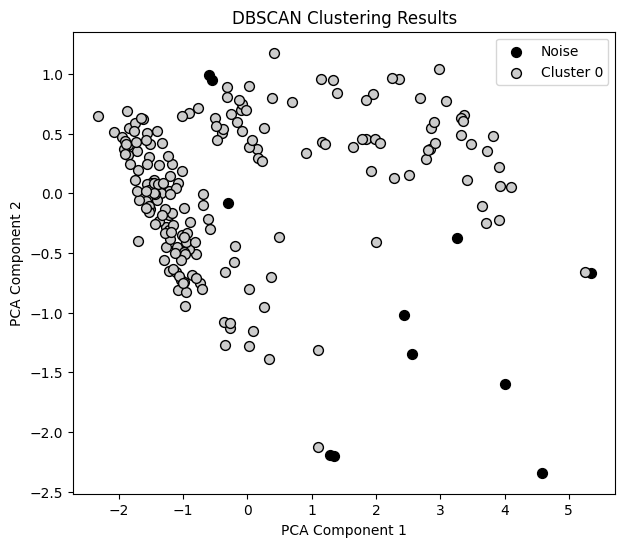

eps:  1.8
mins:  20


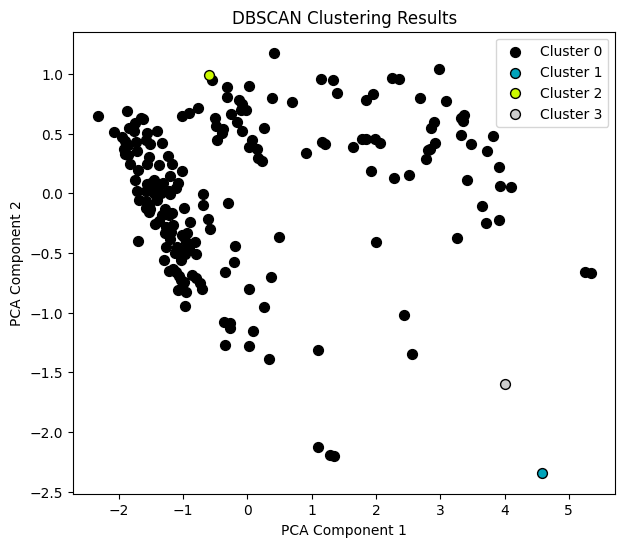

eps:  1.9
mins:  1


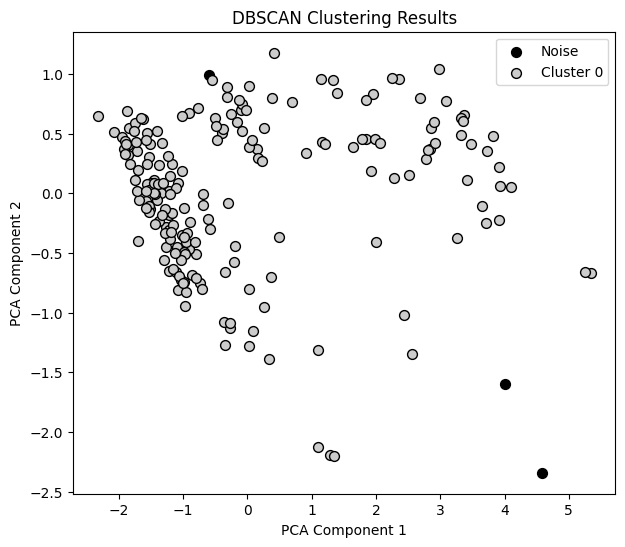

eps:  1.9
mins:  2


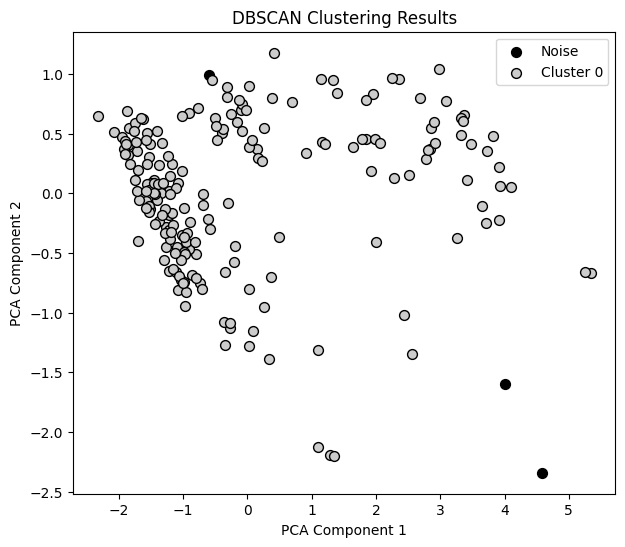

eps:  1.9
mins:  3


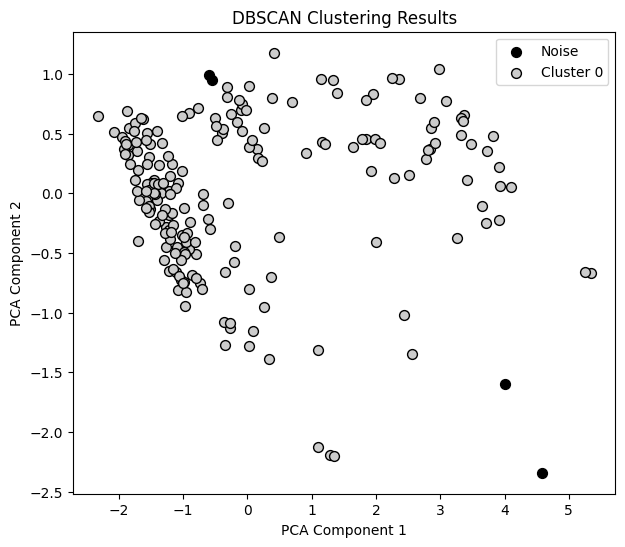

eps:  1.9
mins:  4


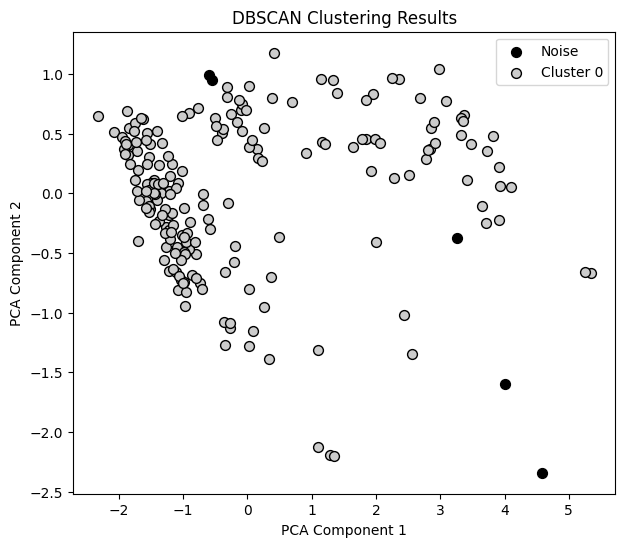

eps:  1.9
mins:  5


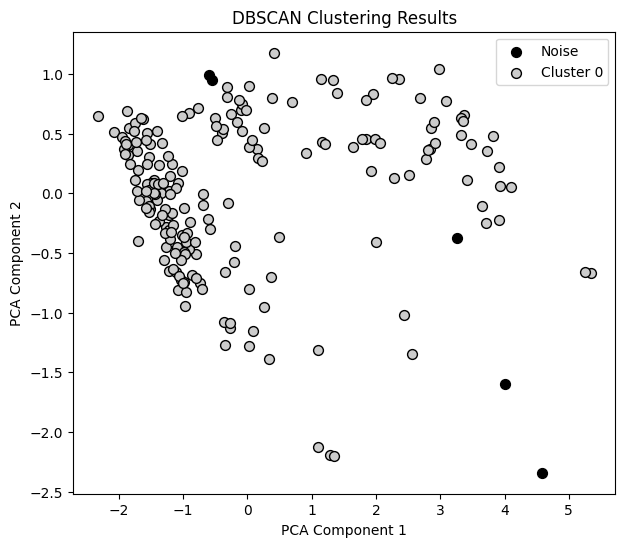

eps:  1.9
mins:  6


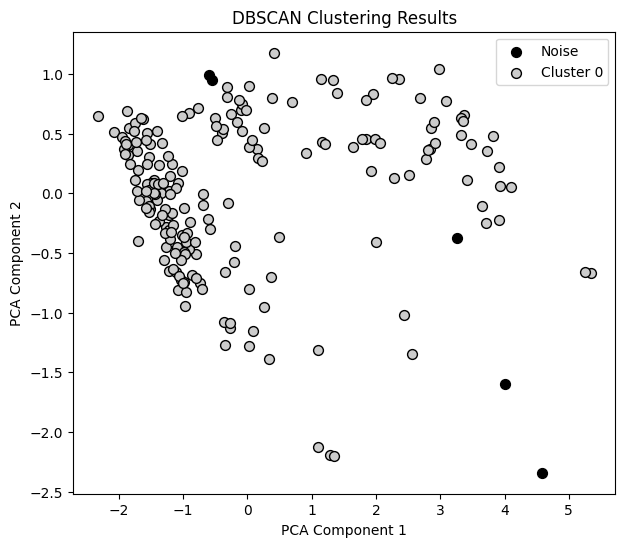

eps:  1.9
mins:  7


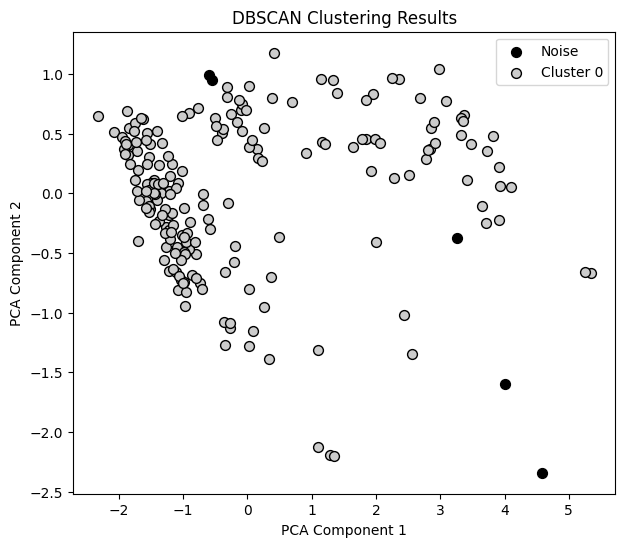

eps:  1.9
mins:  8


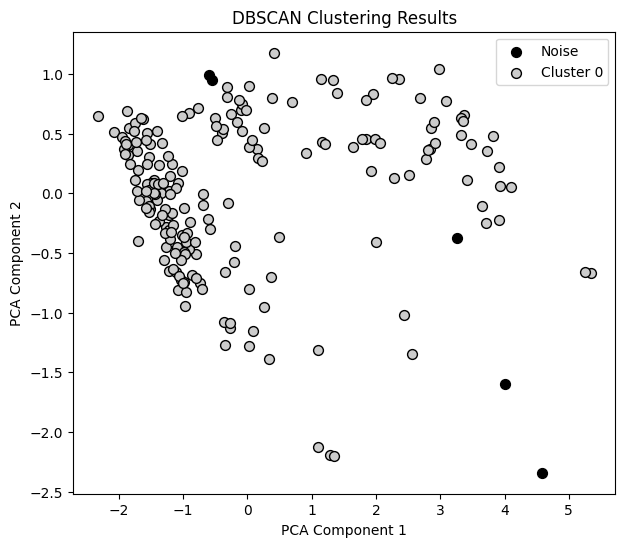

eps:  1.9
mins:  9


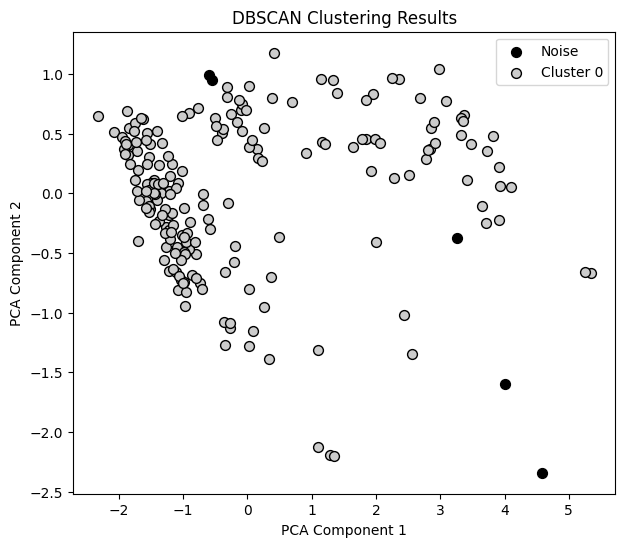

eps:  1.9
mins:  10


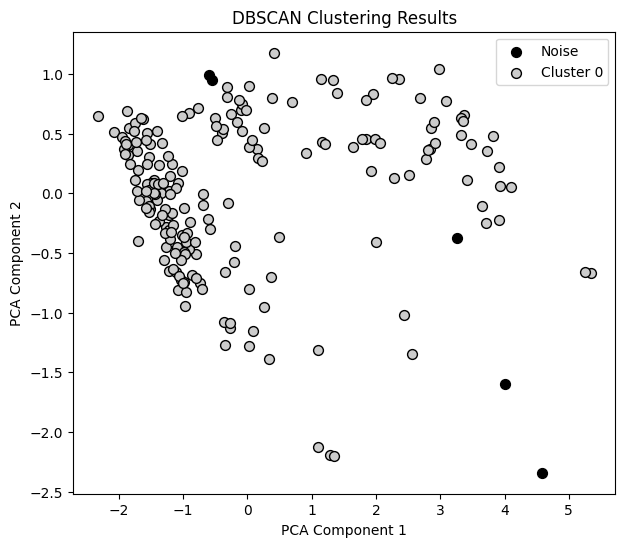

eps:  1.9
mins:  11


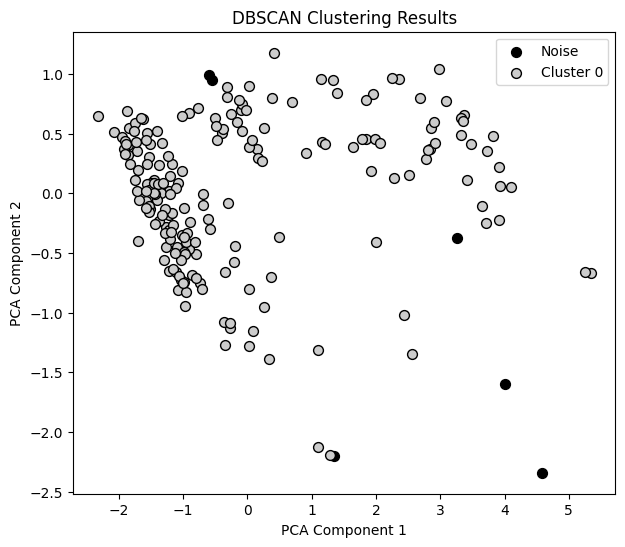

eps:  1.9
mins:  12


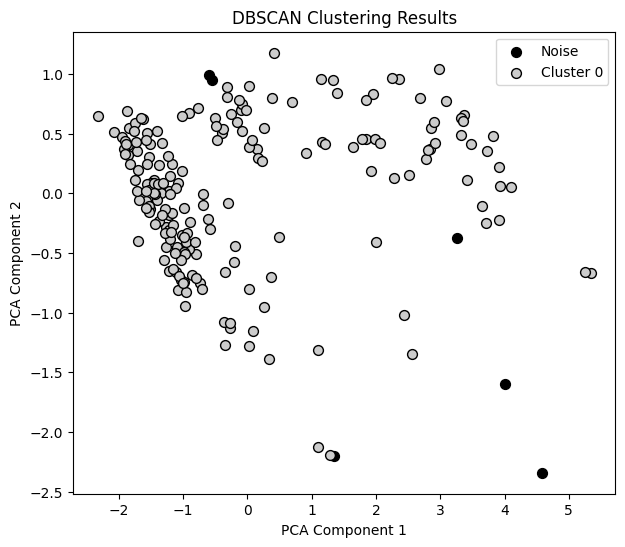

eps:  1.9
mins:  13


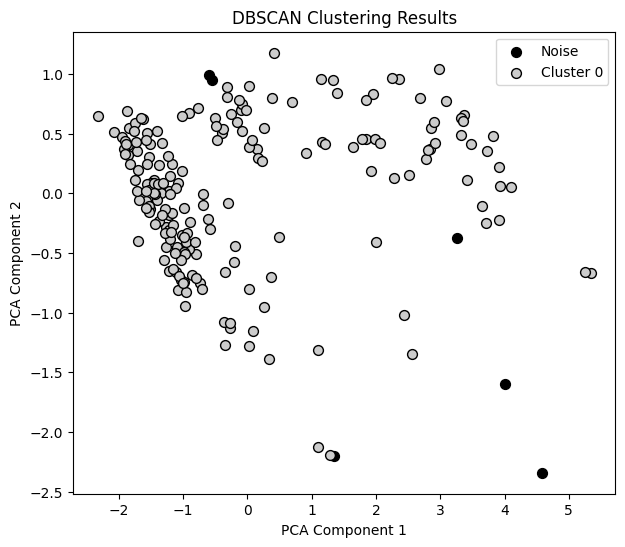

eps:  1.9
mins:  14


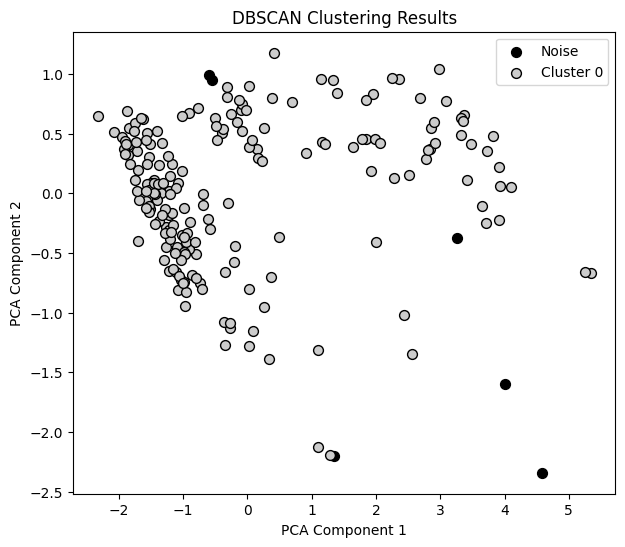

eps:  1.9
mins:  15


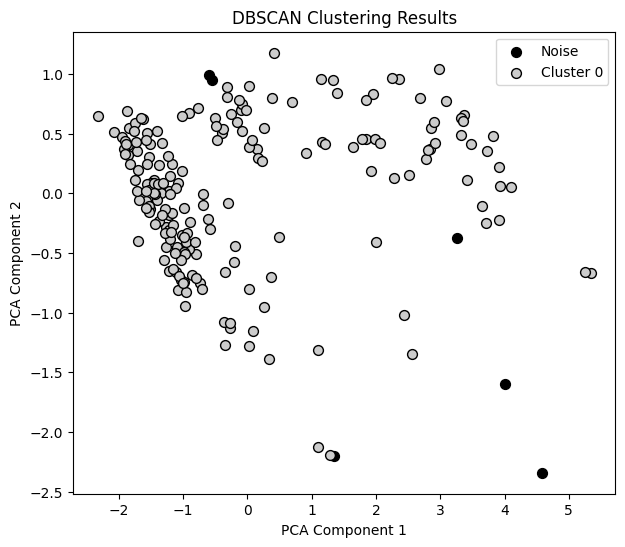

eps:  1.9
mins:  16


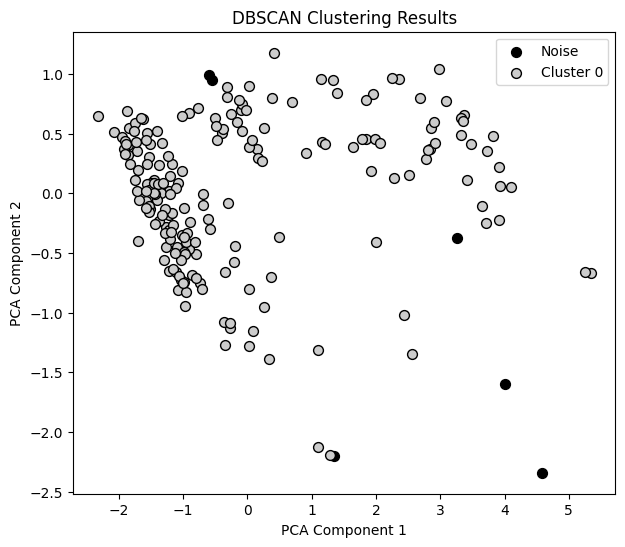

eps:  1.9
mins:  17


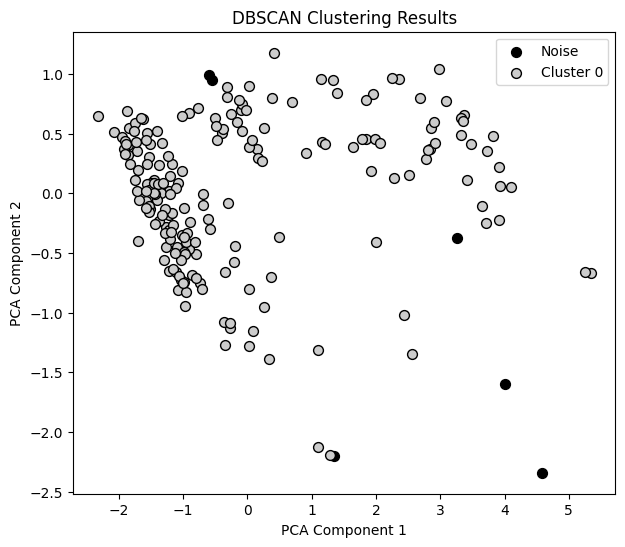

eps:  1.9
mins:  18


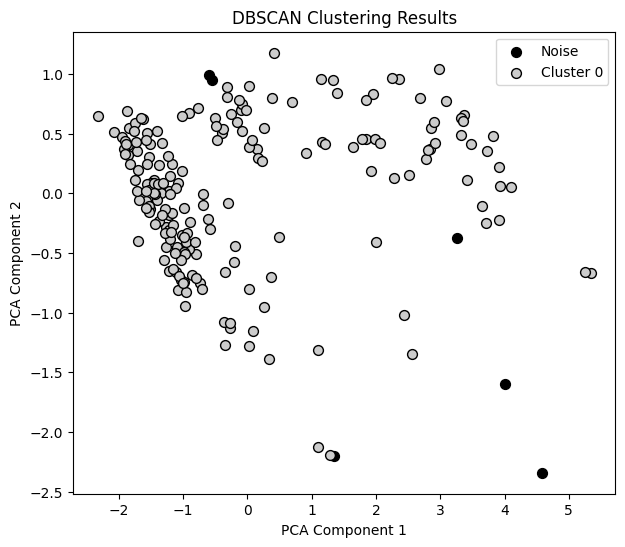

eps:  1.9
mins:  19


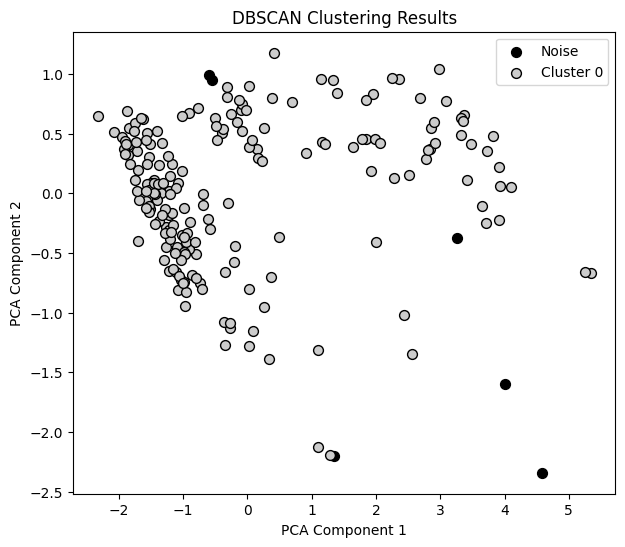

eps:  1.9
mins:  20


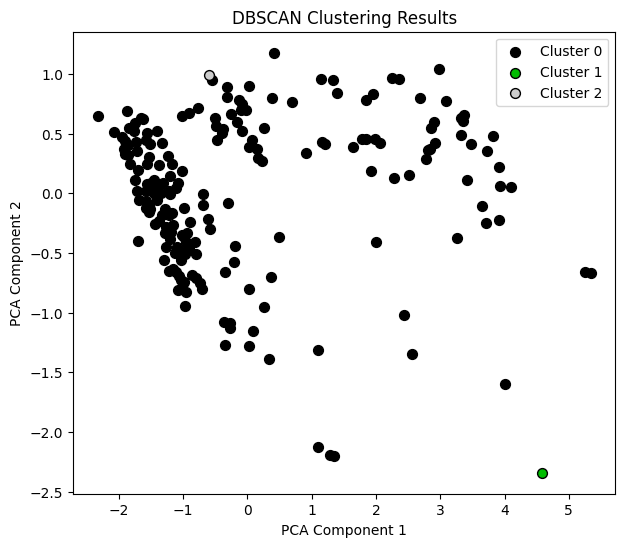

eps:  2
mins:  1


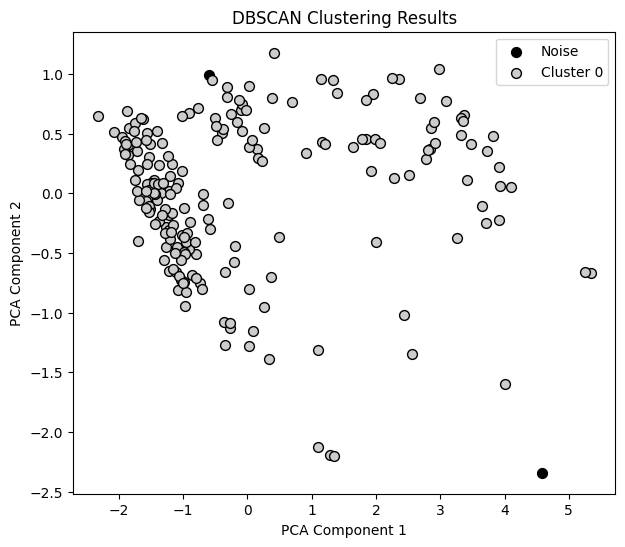

eps:  2
mins:  2


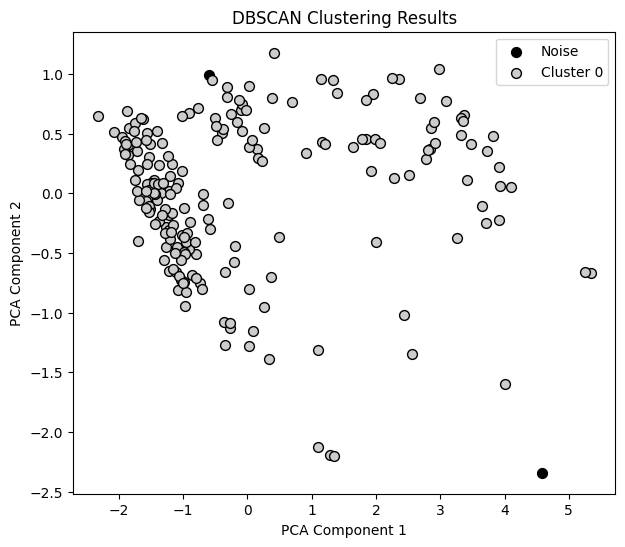

eps:  2
mins:  3


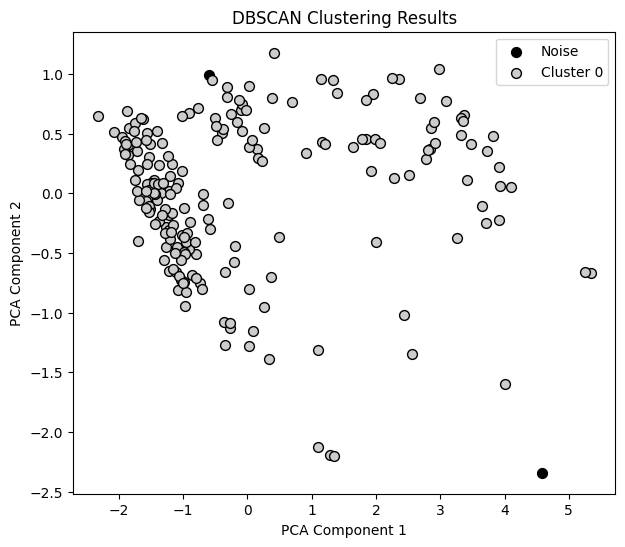

eps:  2
mins:  4


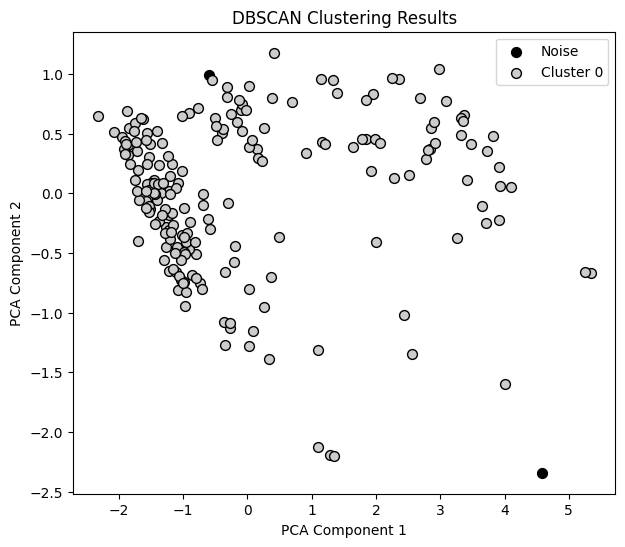

eps:  2
mins:  5


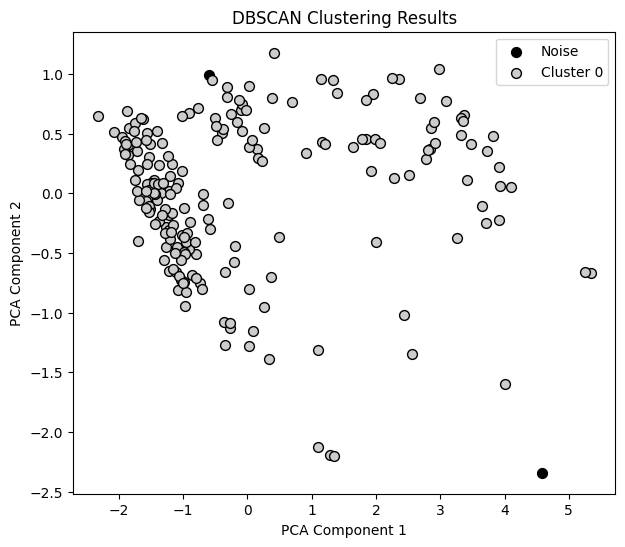

eps:  2
mins:  6


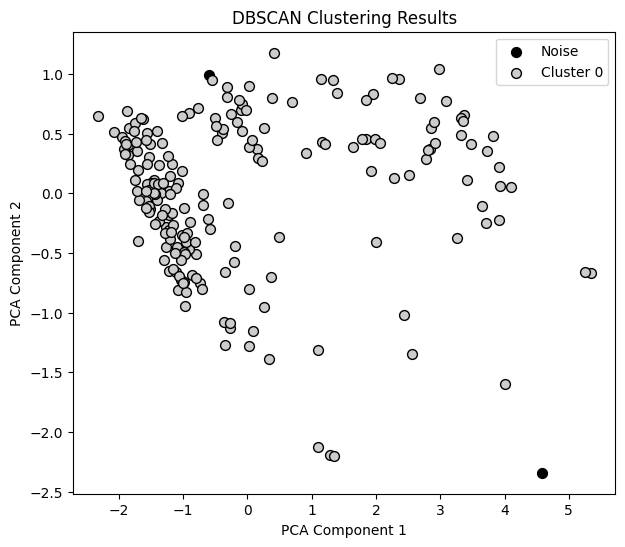

eps:  2
mins:  7


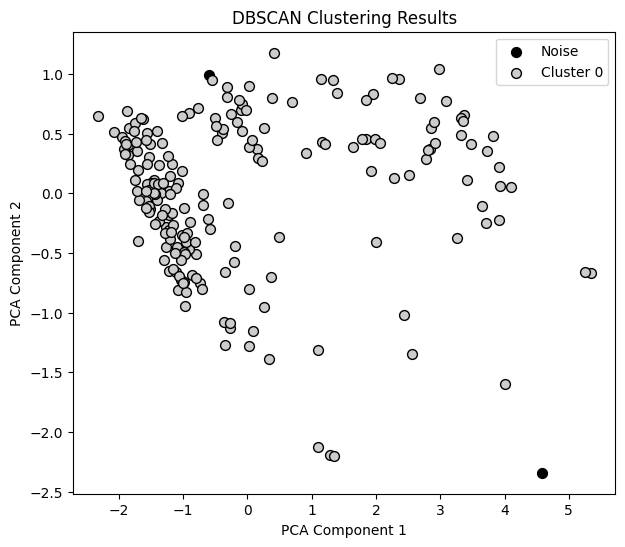

eps:  2
mins:  8


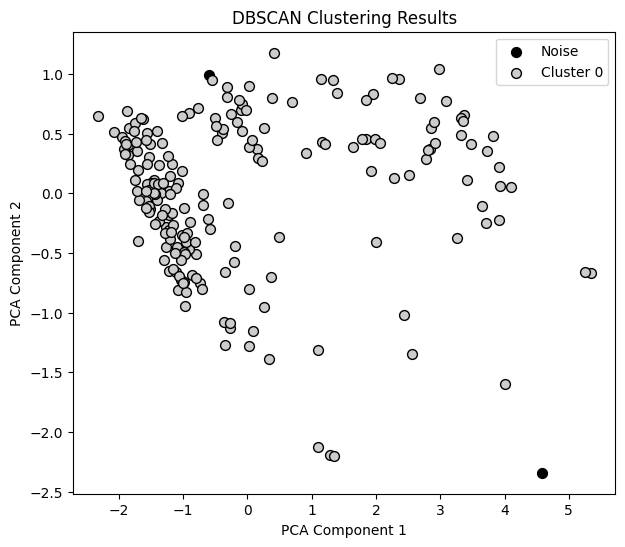

eps:  2
mins:  9


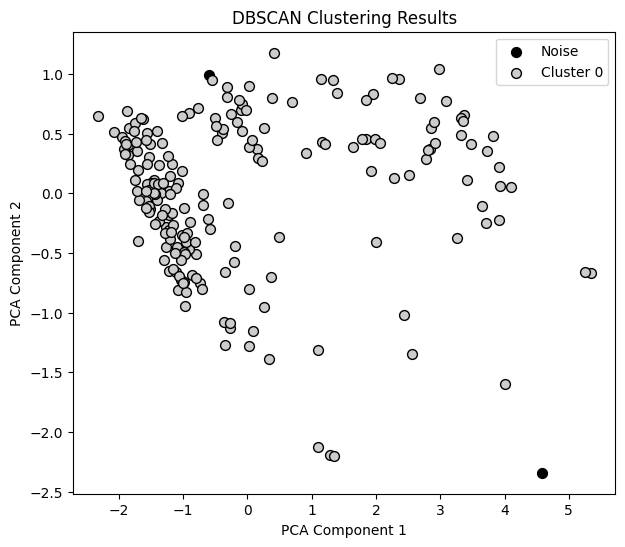

eps:  2
mins:  10


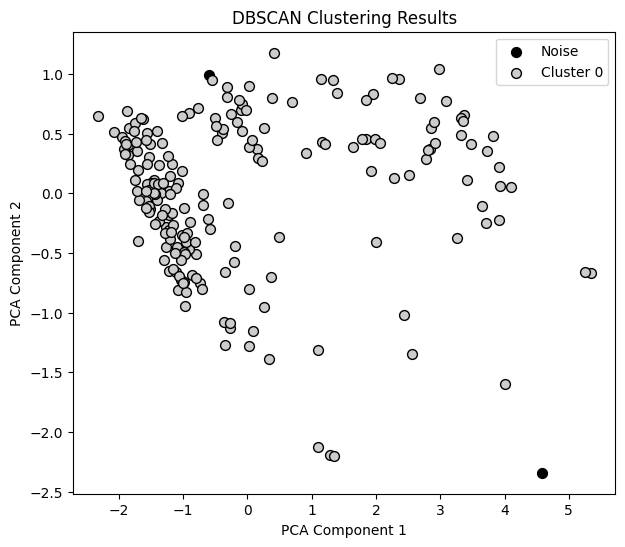

eps:  2
mins:  11


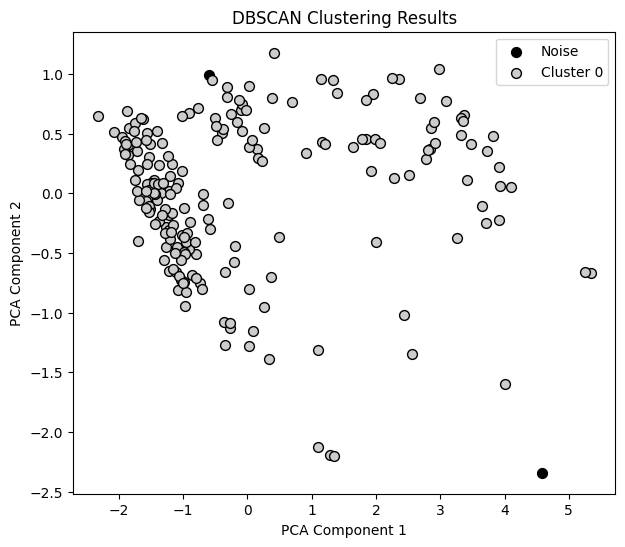

eps:  2
mins:  12


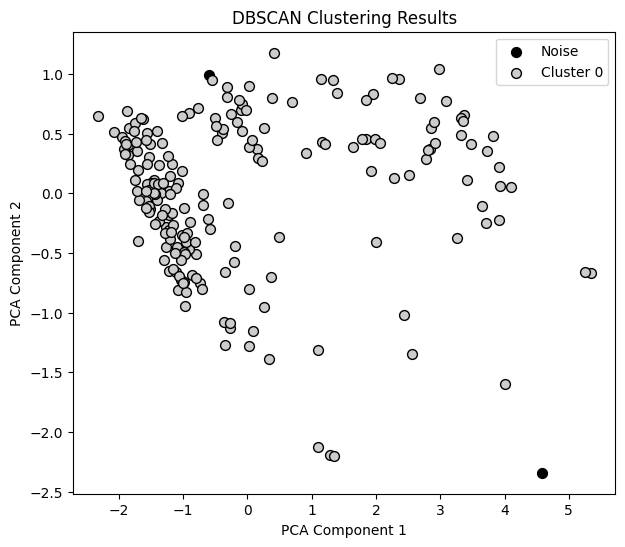

eps:  2
mins:  13


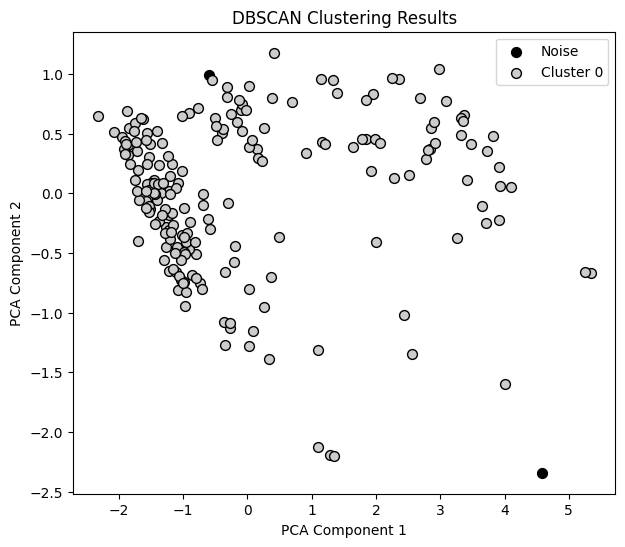

eps:  2
mins:  14


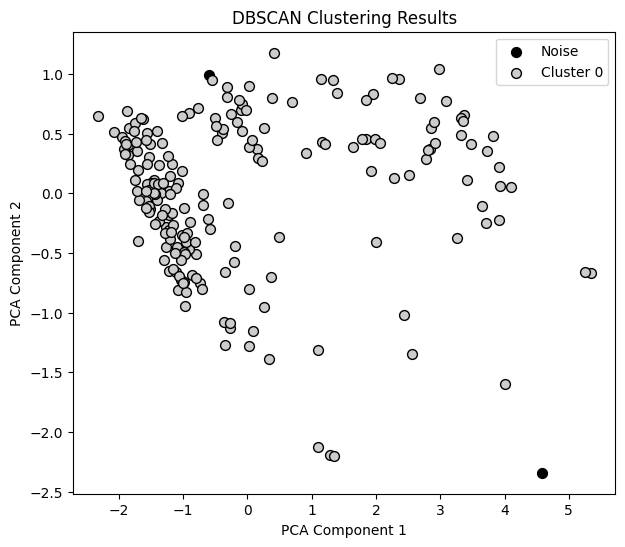

eps:  2
mins:  15


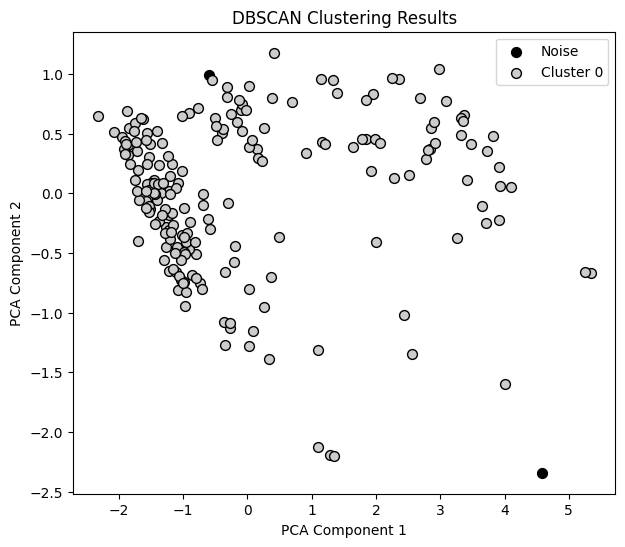

eps:  2
mins:  16


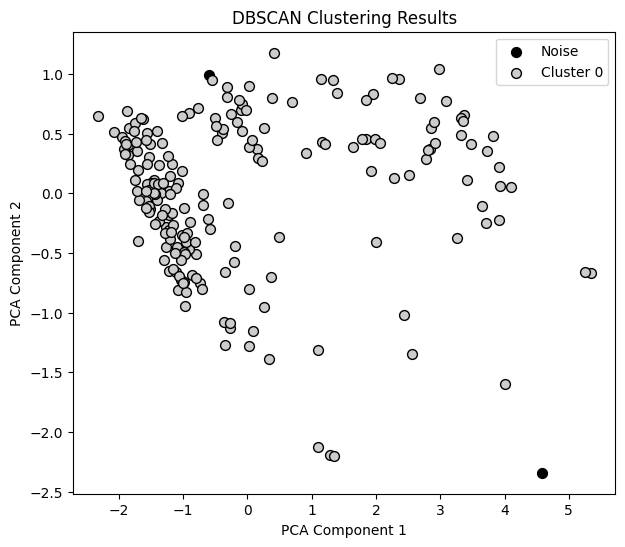

eps:  2
mins:  17


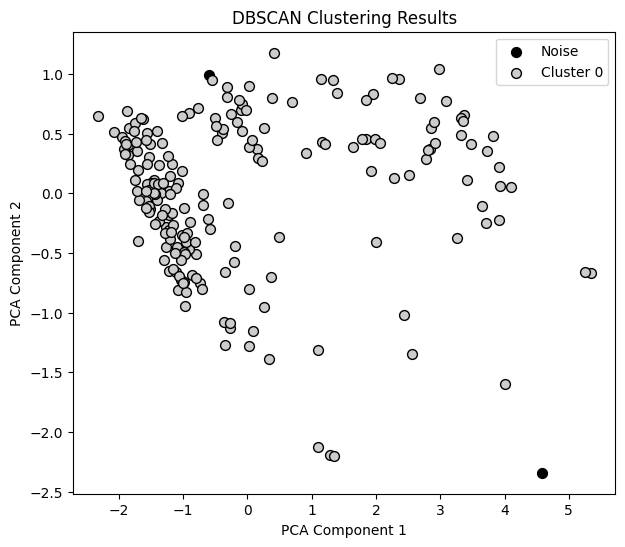

eps:  2
mins:  18


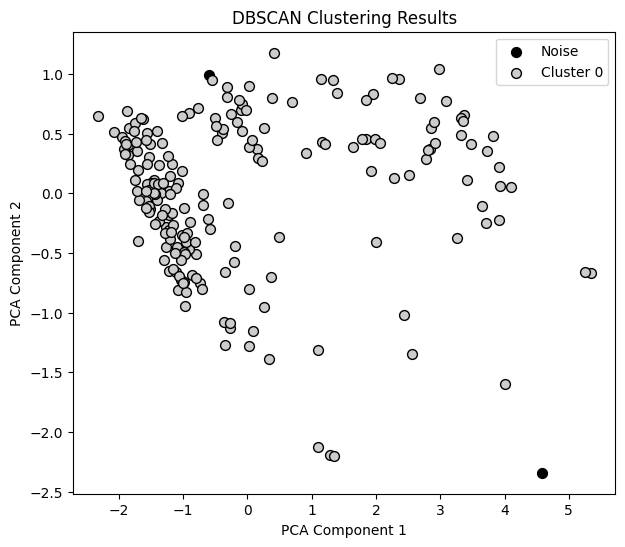

eps:  2
mins:  19


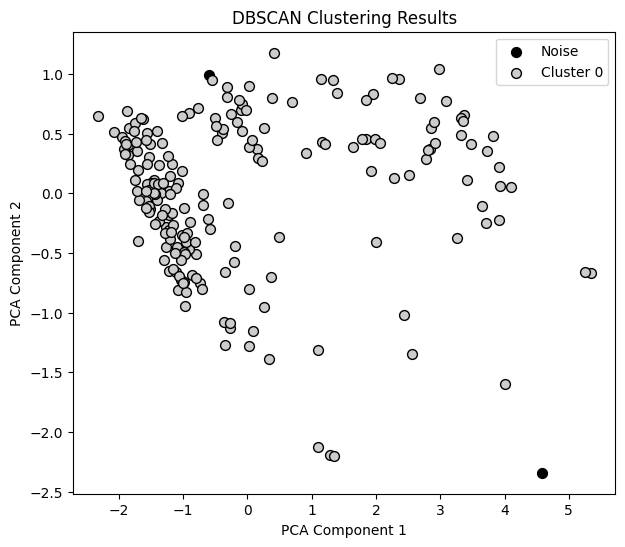

eps:  2
mins:  20


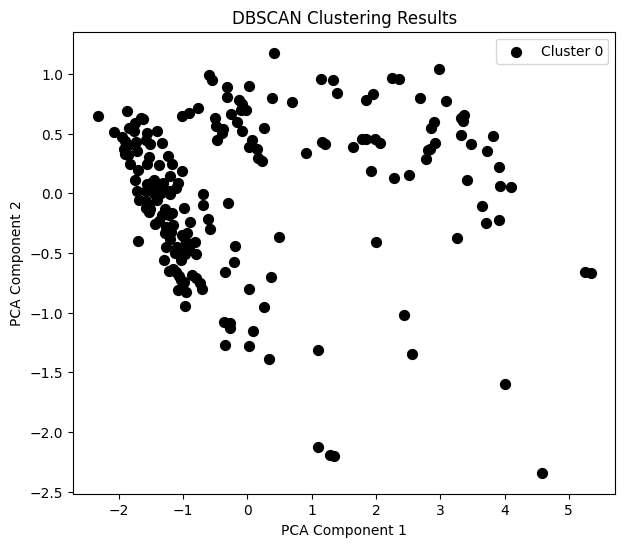

eps:  3
mins:  1


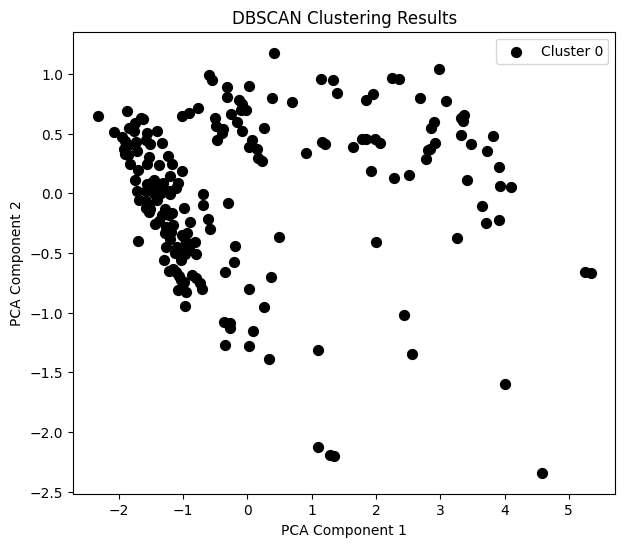

eps:  3
mins:  2


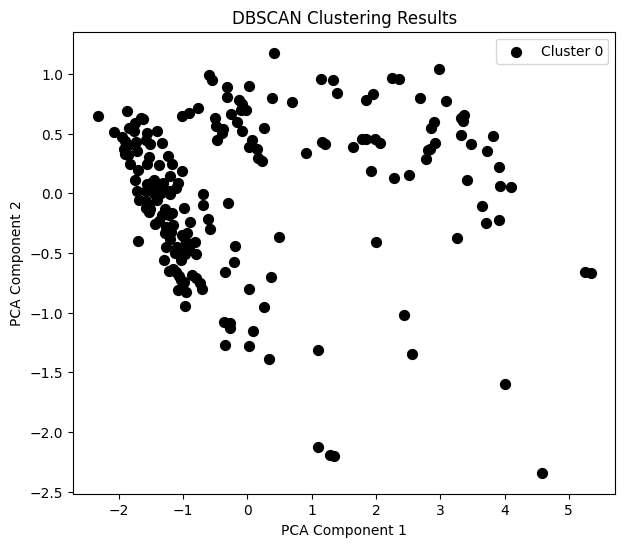

eps:  3
mins:  3


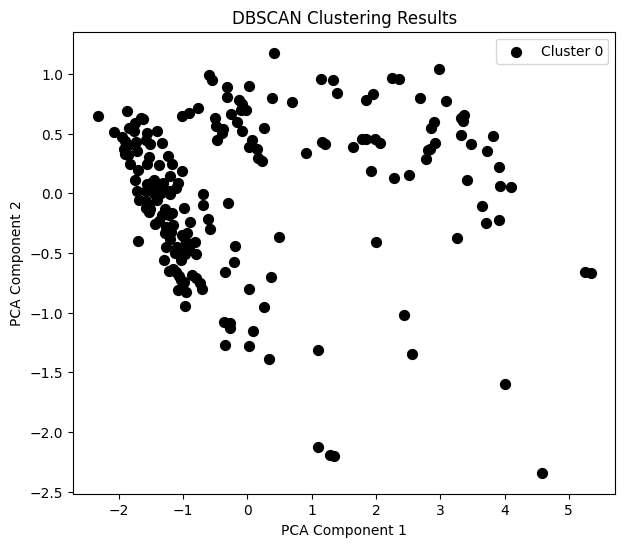

eps:  3
mins:  4


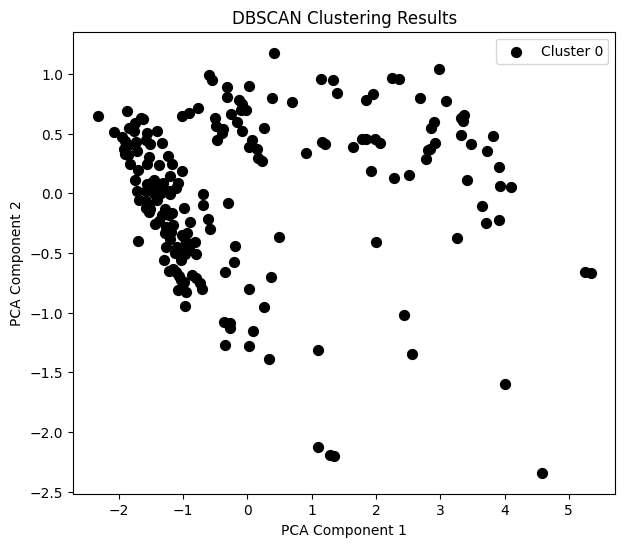

eps:  3
mins:  5


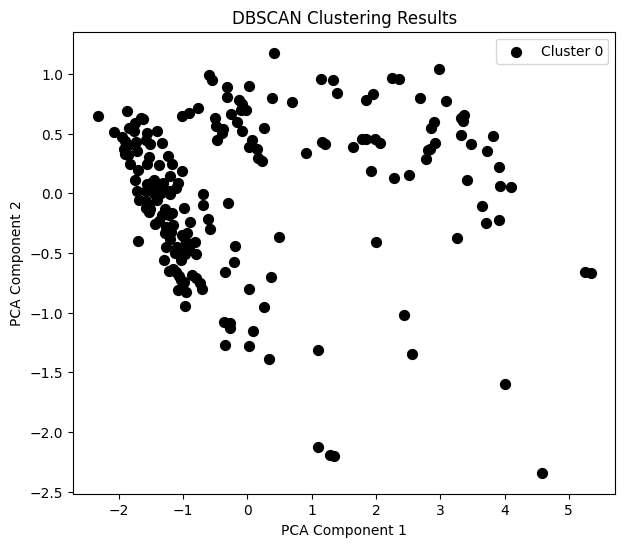

eps:  3
mins:  6


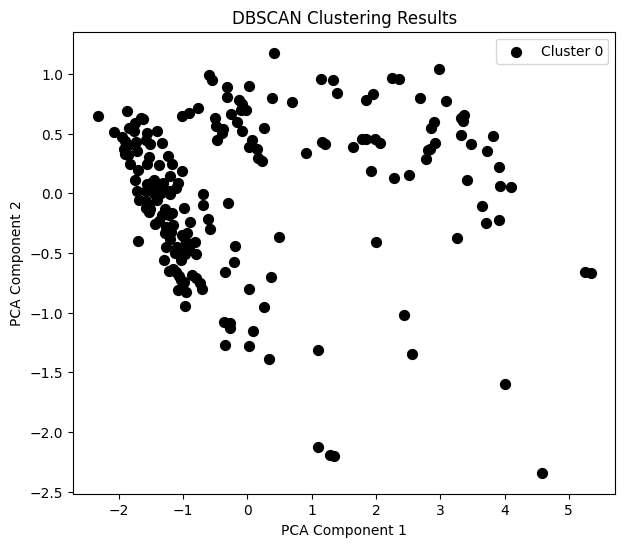

eps:  3
mins:  7


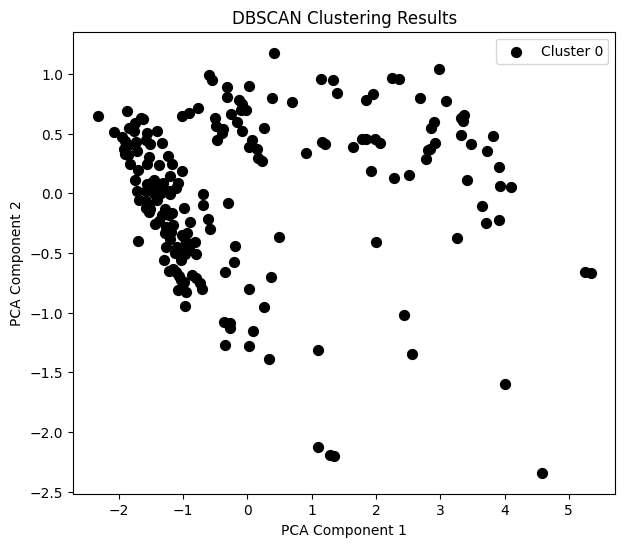

eps:  3
mins:  8


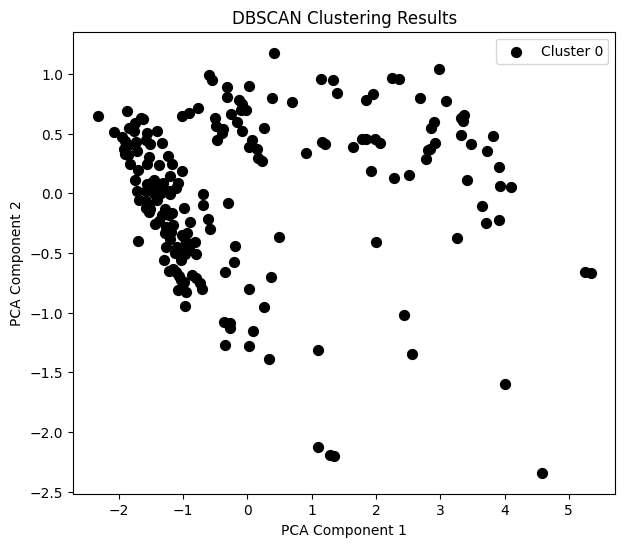

eps:  3
mins:  9


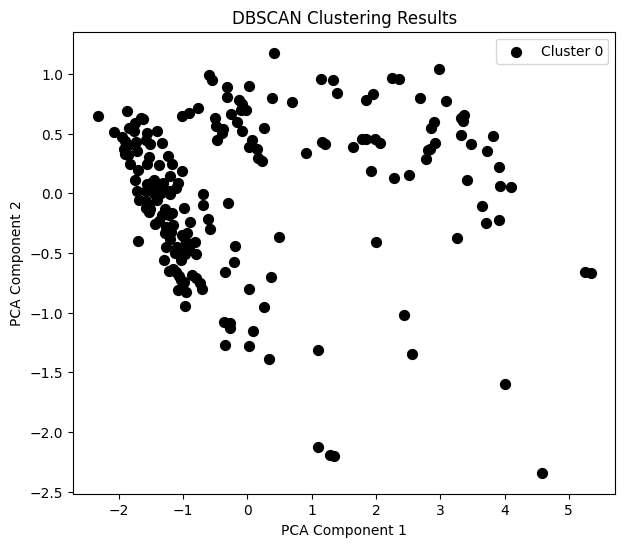

eps:  3
mins:  10


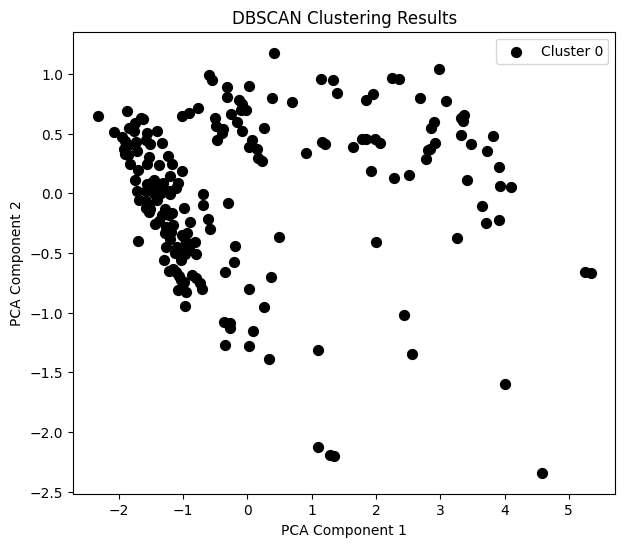

eps:  3
mins:  11


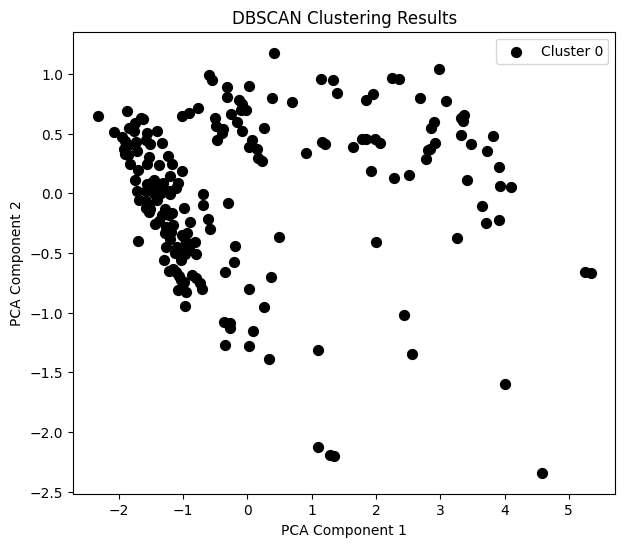

eps:  3
mins:  12


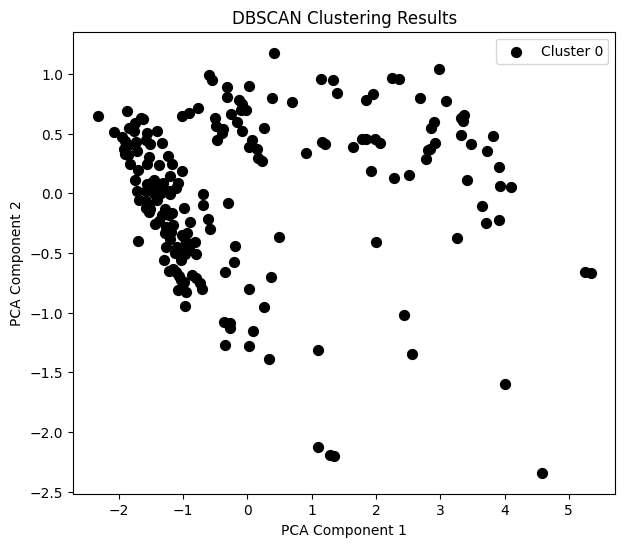

eps:  3
mins:  13


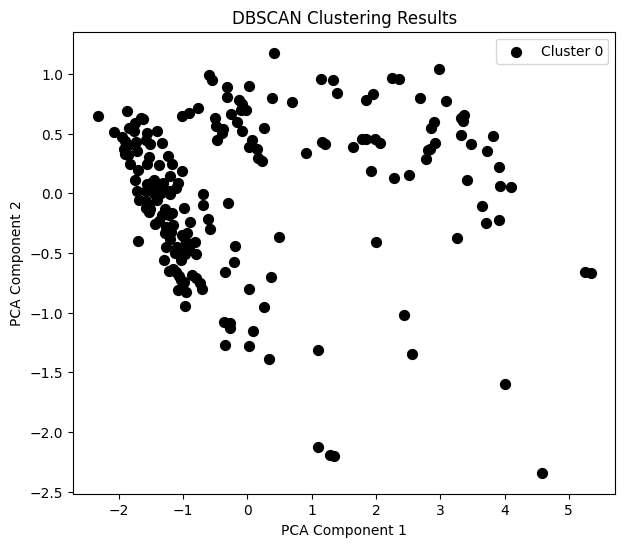

eps:  3
mins:  14


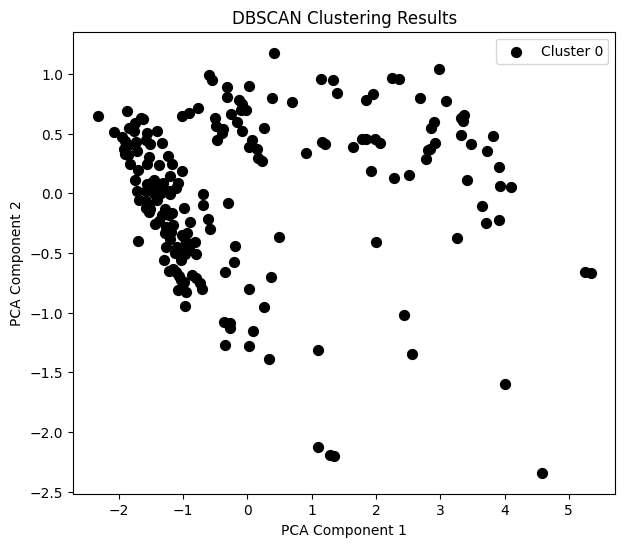

eps:  3
mins:  15


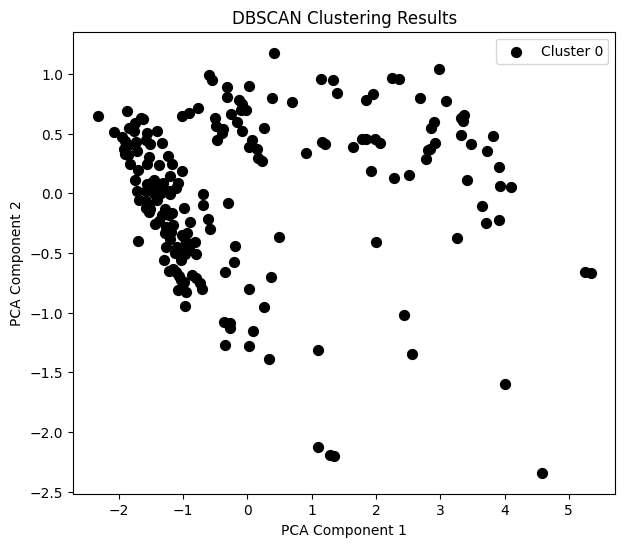

eps:  3
mins:  16


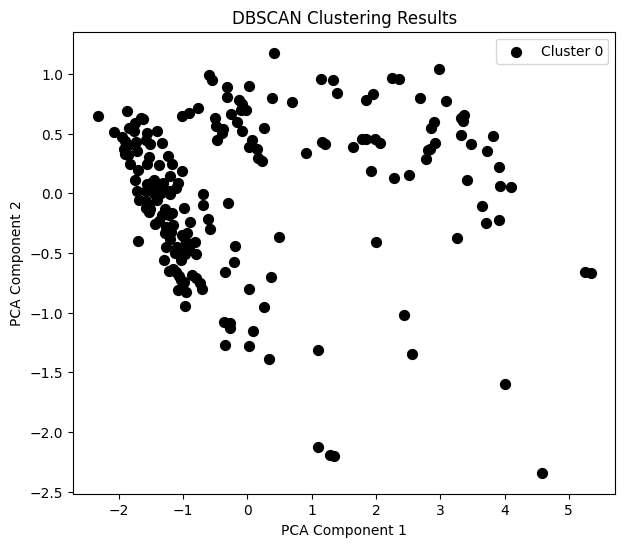

eps:  3
mins:  17


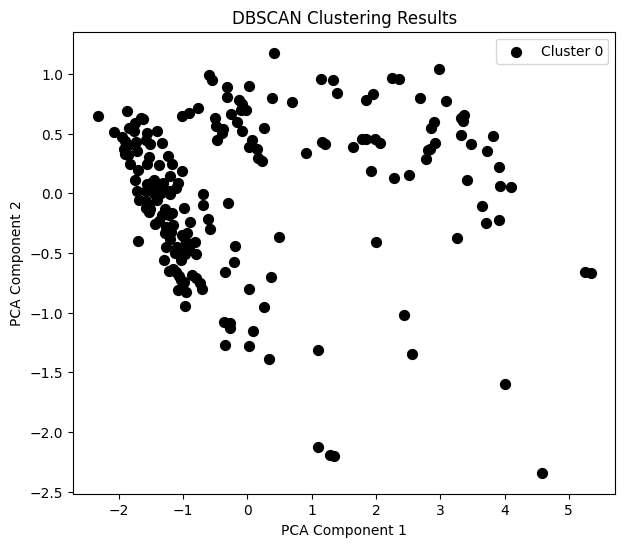

eps:  3
mins:  18


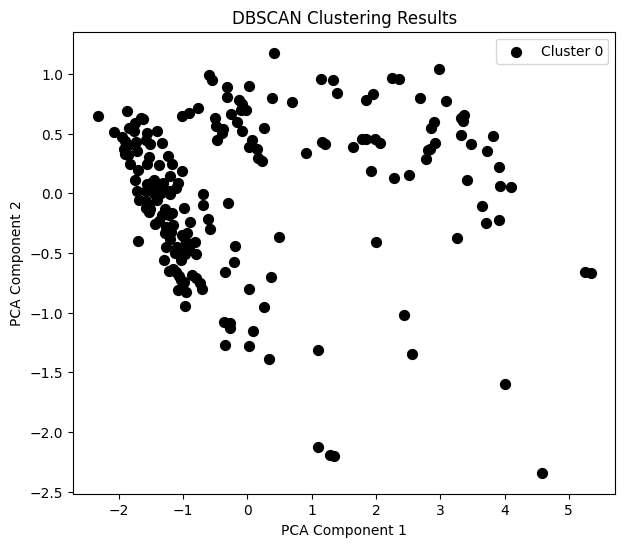

eps:  3
mins:  19


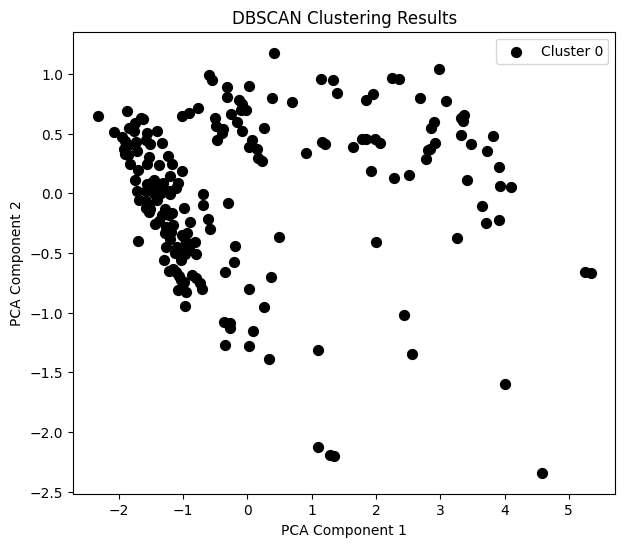

eps:  3
mins:  20


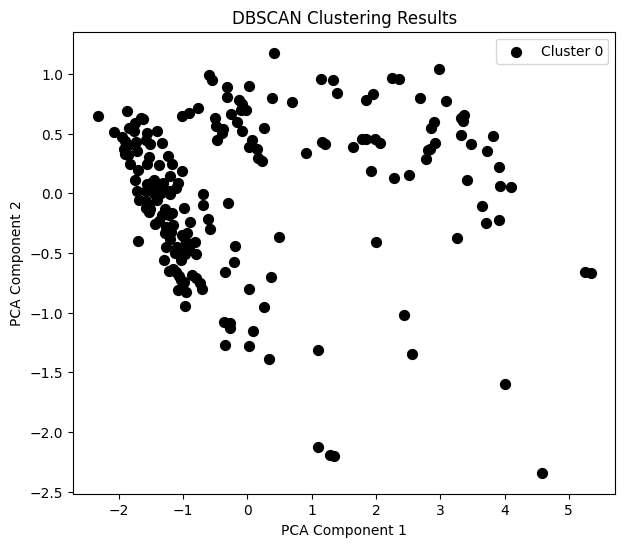

eps:  4
mins:  1


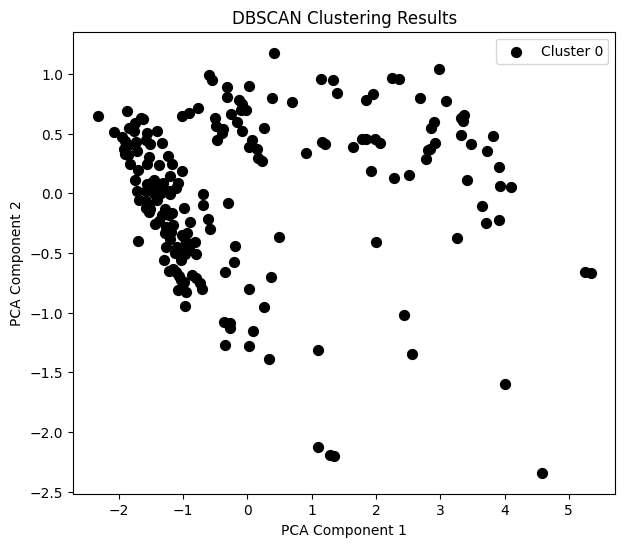

eps:  4
mins:  2


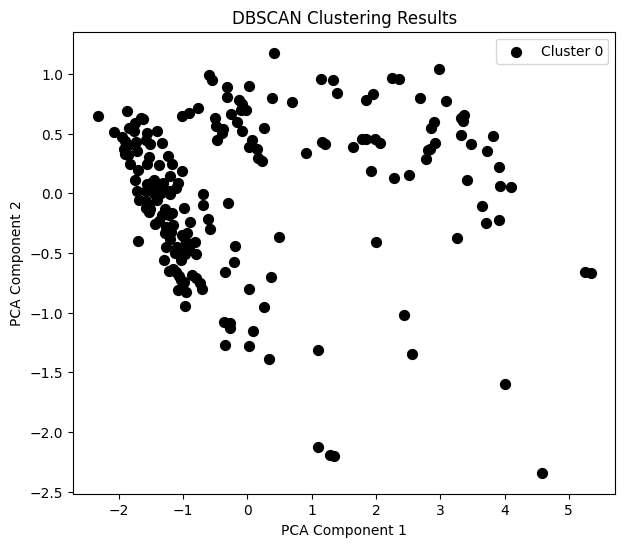

eps:  4
mins:  3


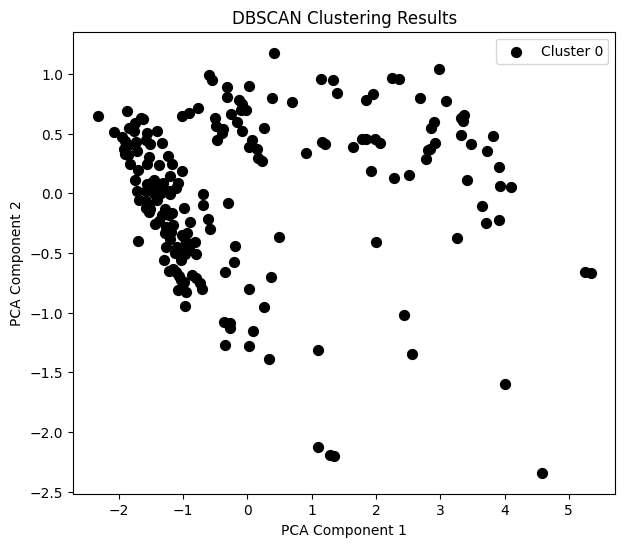

eps:  4
mins:  4


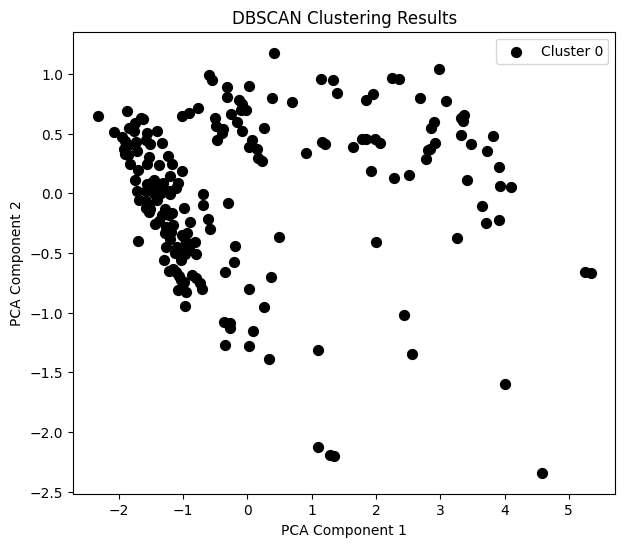

eps:  4
mins:  5


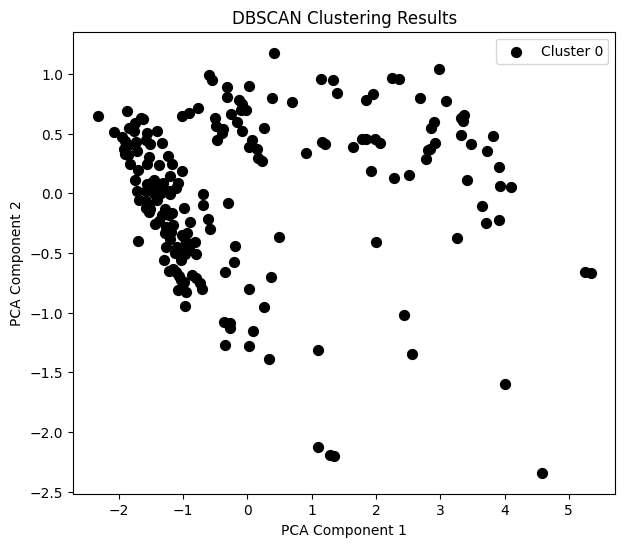

eps:  4
mins:  6


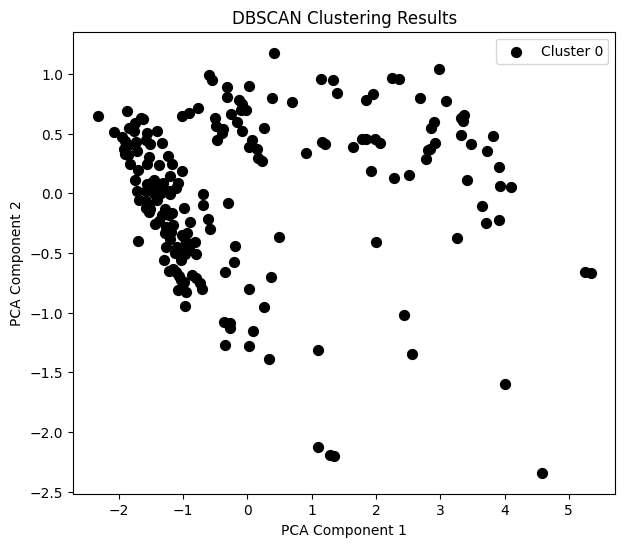

eps:  4
mins:  7


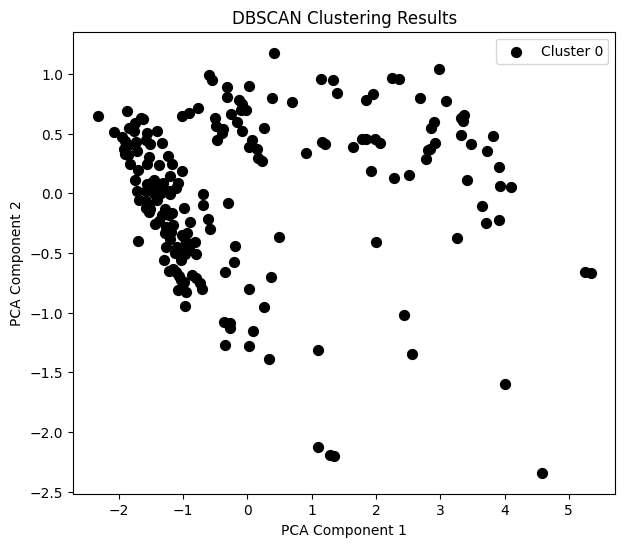

eps:  4
mins:  8


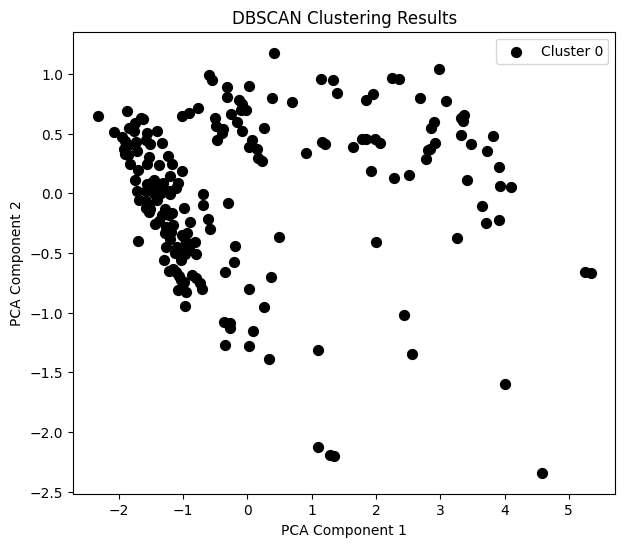

eps:  4
mins:  9


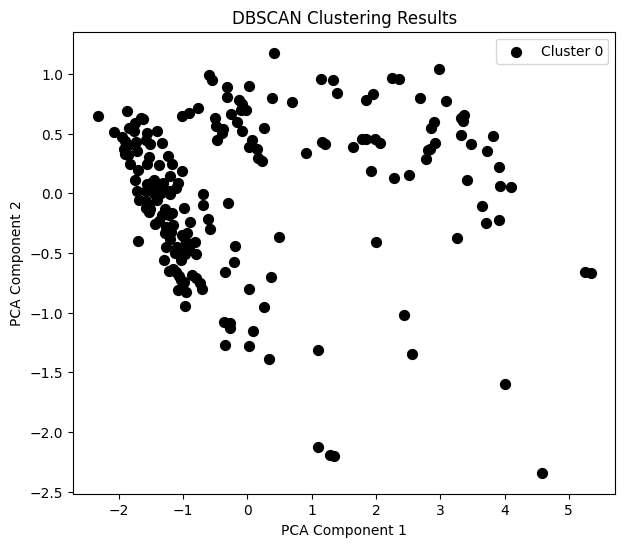

eps:  4
mins:  10


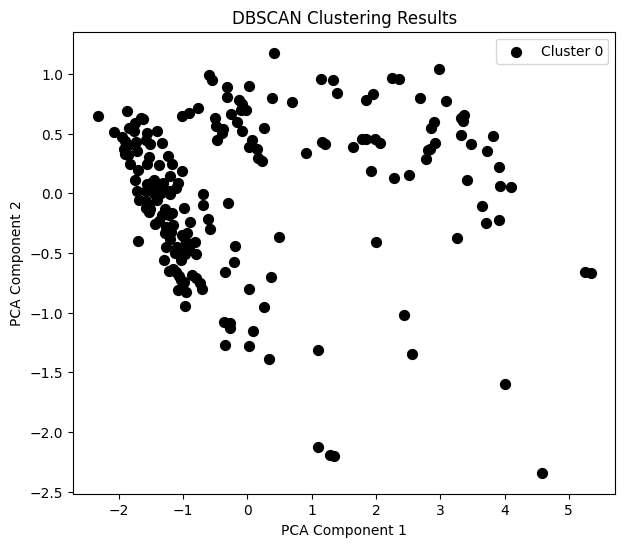

eps:  4
mins:  11


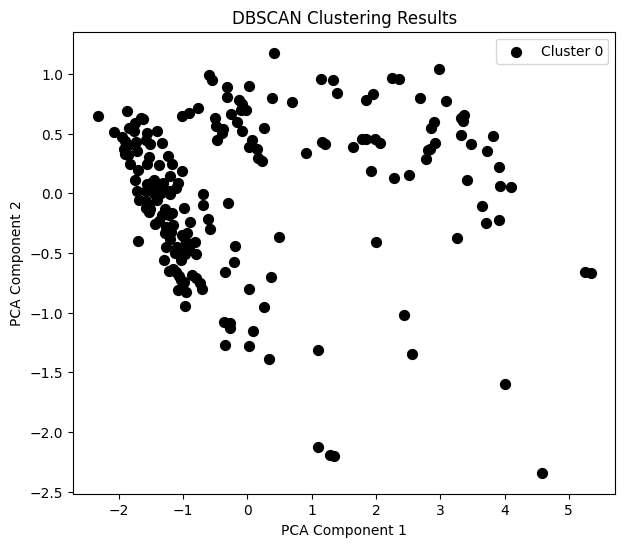

eps:  4
mins:  12


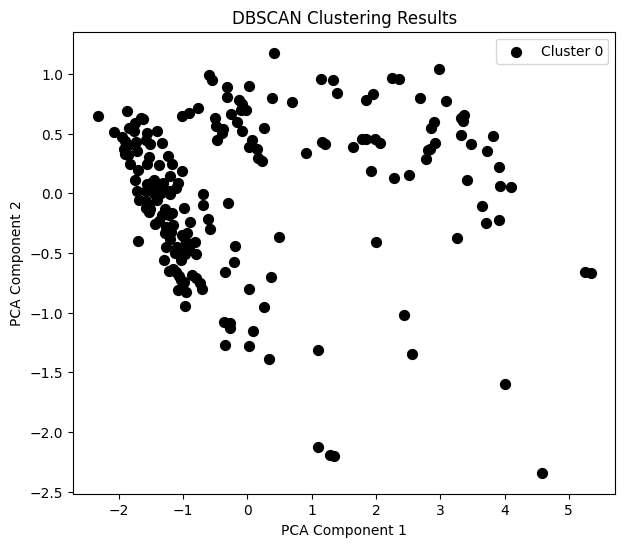

eps:  4
mins:  13


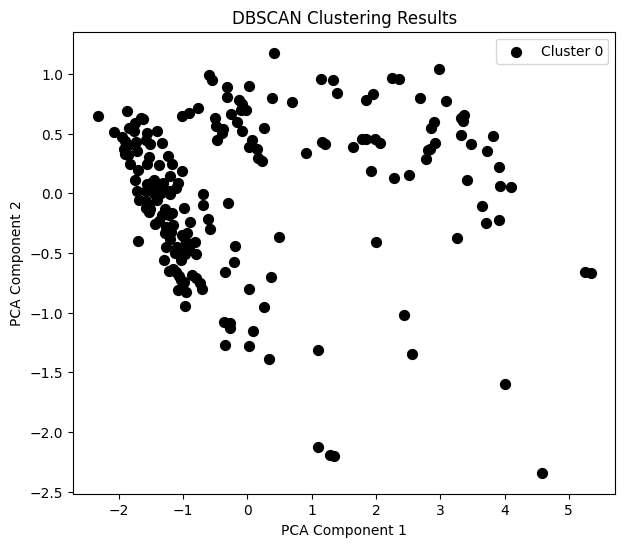

eps:  4
mins:  14


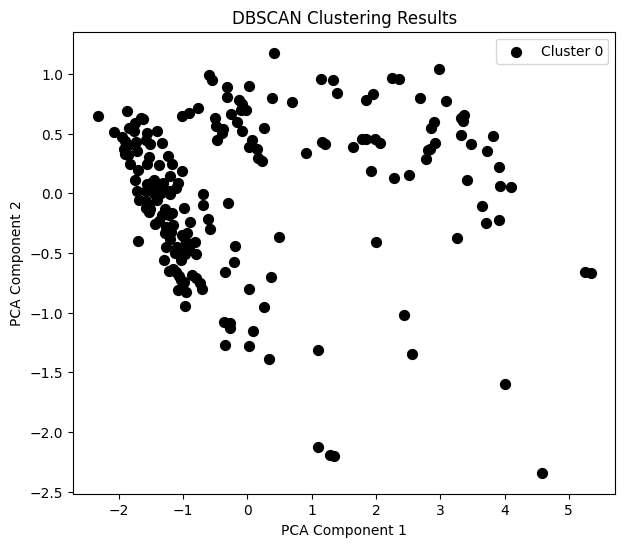

eps:  4
mins:  15


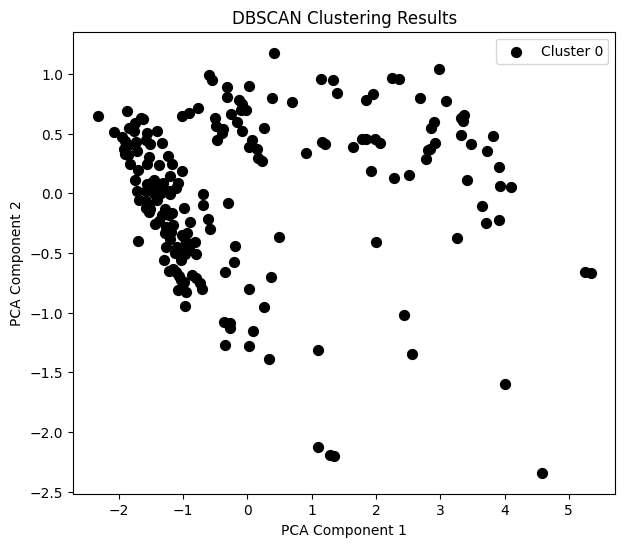

eps:  4
mins:  16


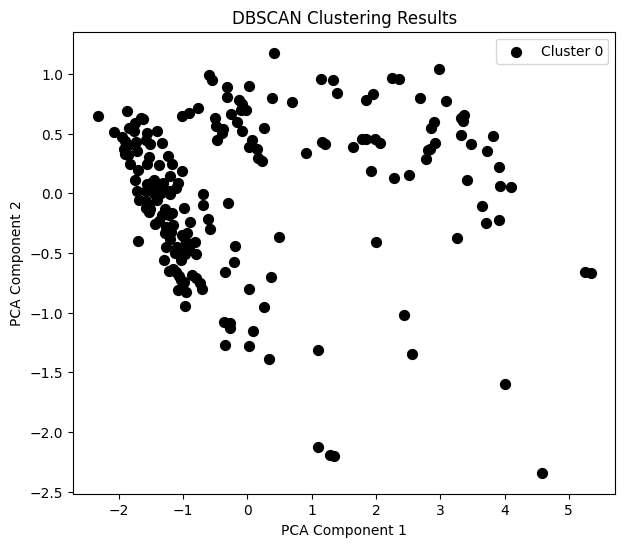

eps:  4
mins:  17


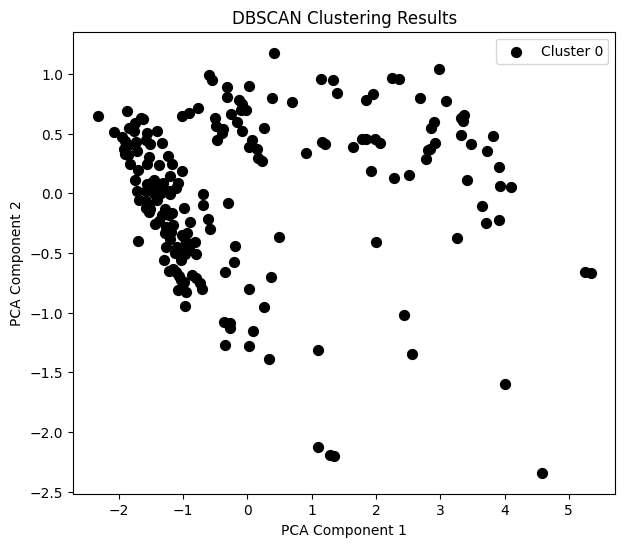

eps:  4
mins:  18


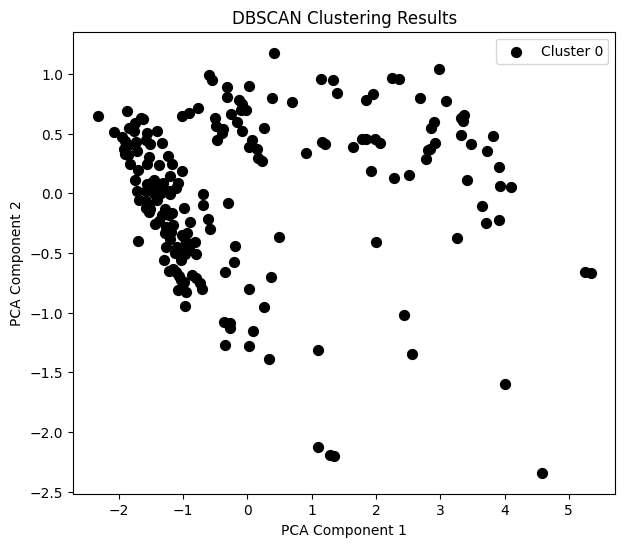

eps:  4
mins:  19


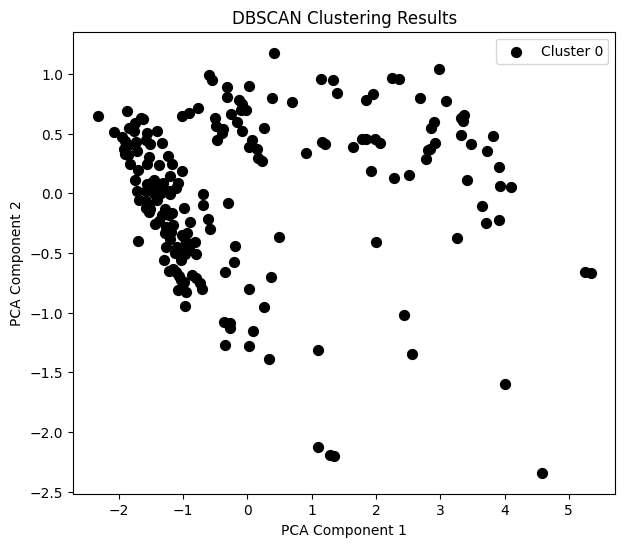

eps:  4
mins:  20


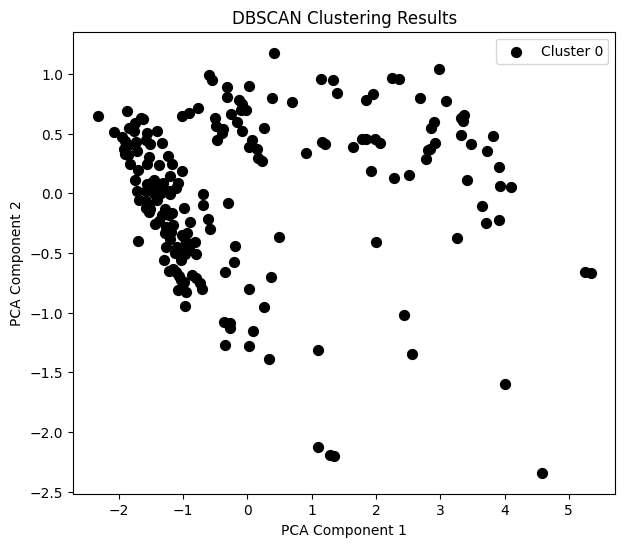

eps:  5
mins:  1


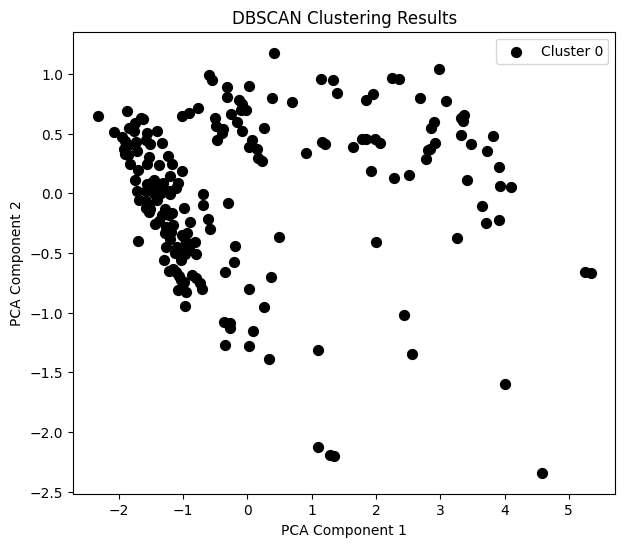

eps:  5
mins:  2


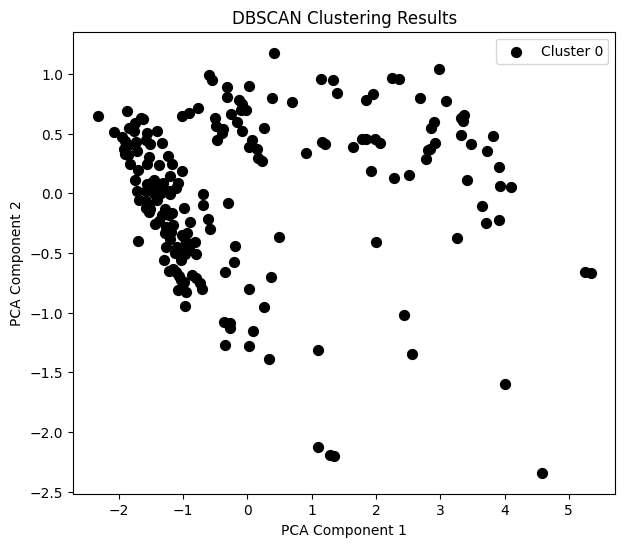

eps:  5
mins:  3


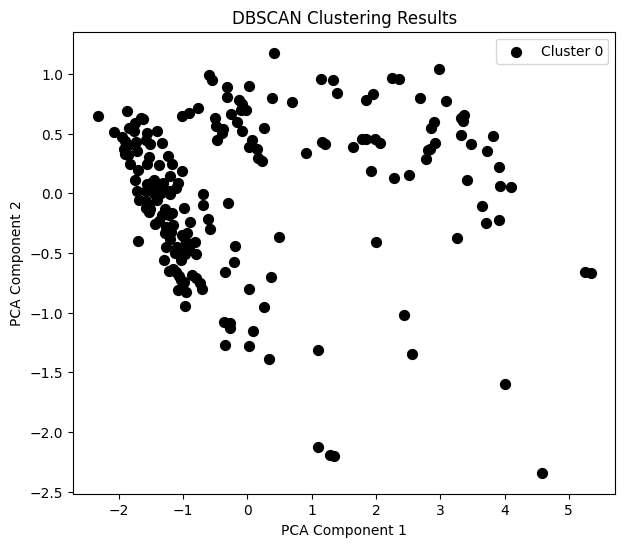

eps:  5
mins:  4


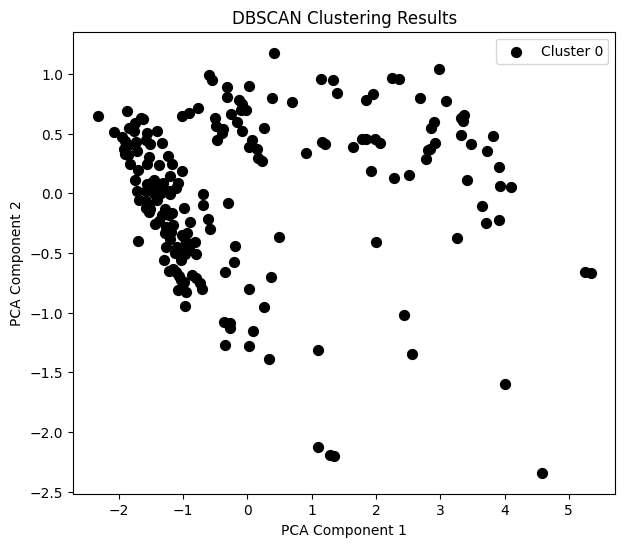

eps:  5
mins:  5


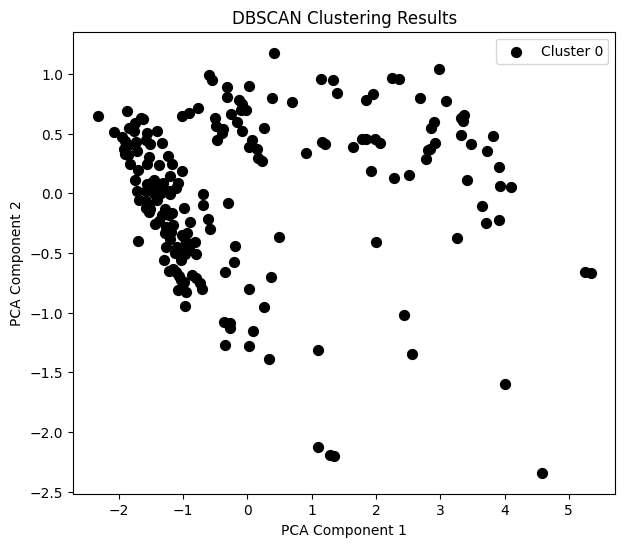

eps:  5
mins:  6


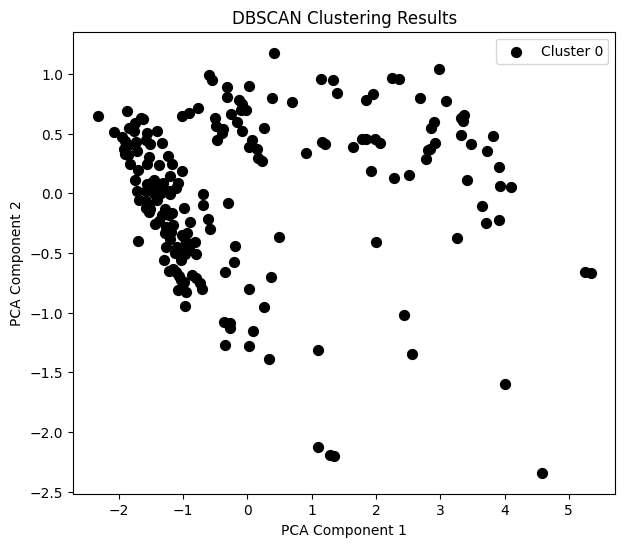

eps:  5
mins:  7


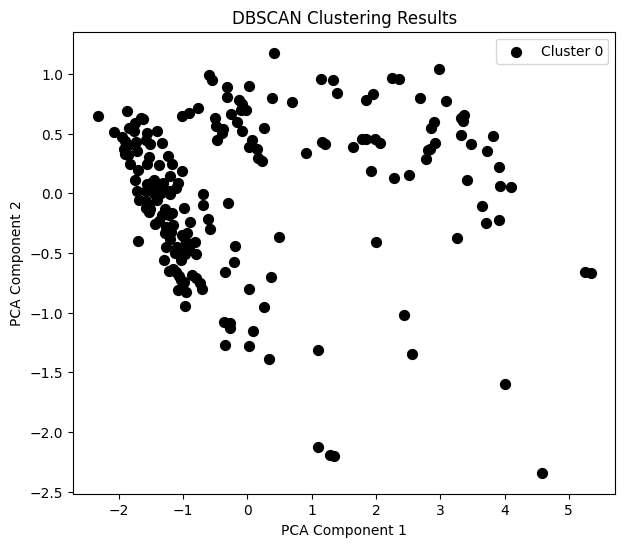

eps:  5
mins:  8


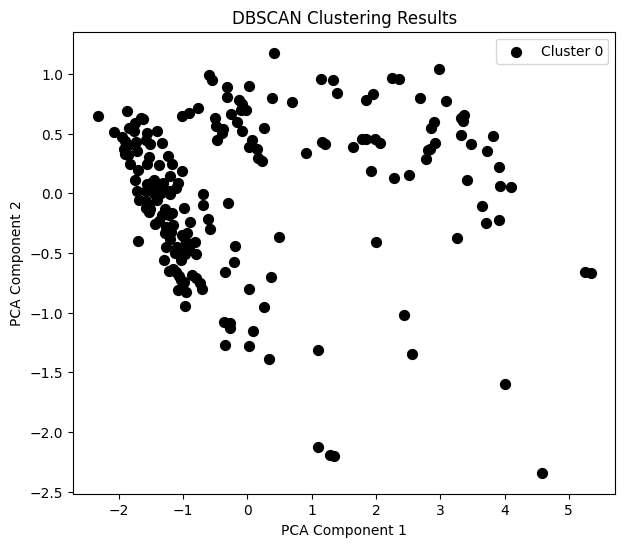

eps:  5
mins:  9


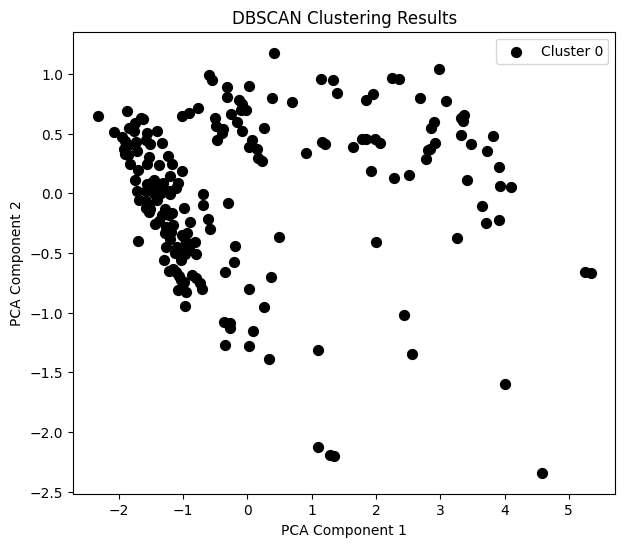

eps:  5
mins:  10


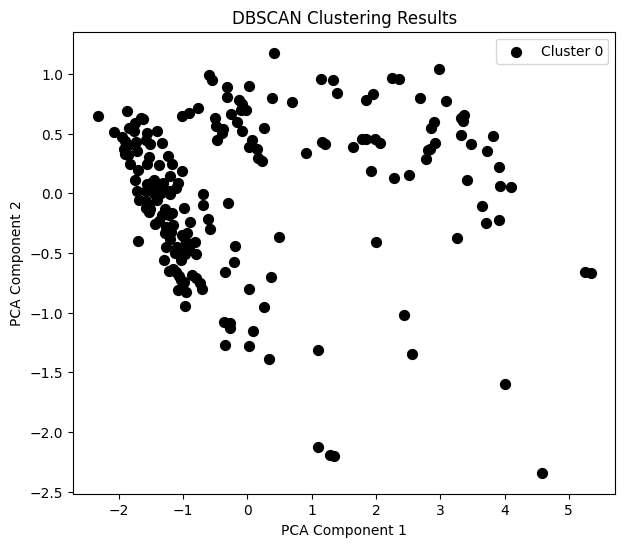

eps:  5
mins:  11


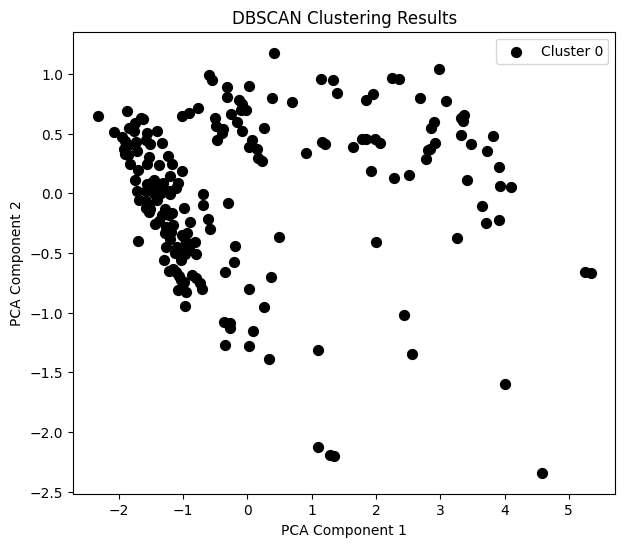

eps:  5
mins:  12


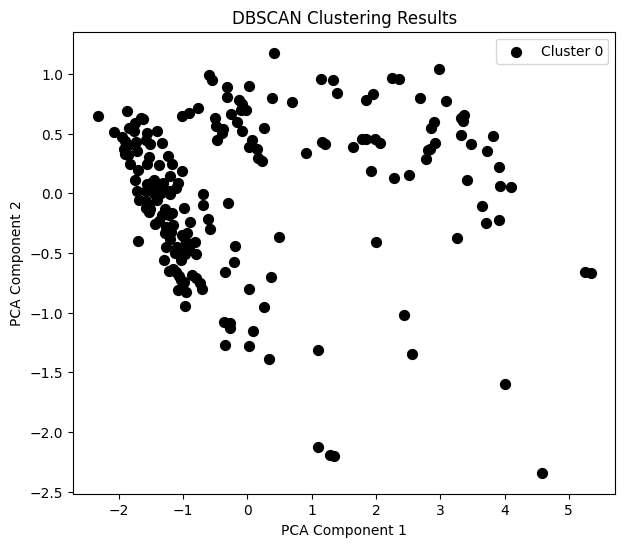

eps:  5
mins:  13


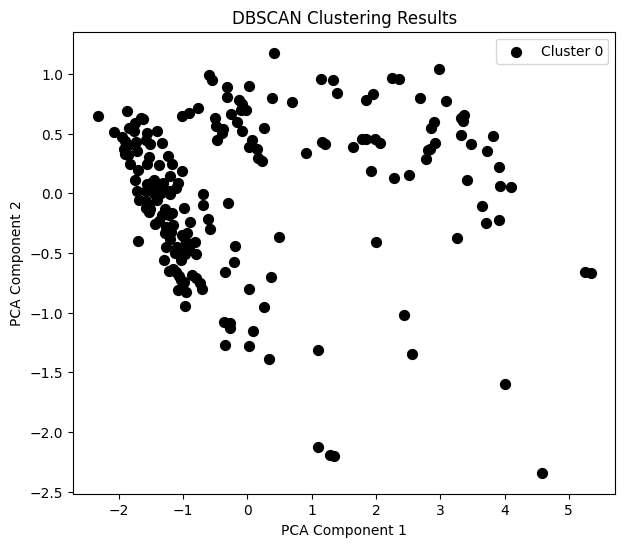

eps:  5
mins:  14


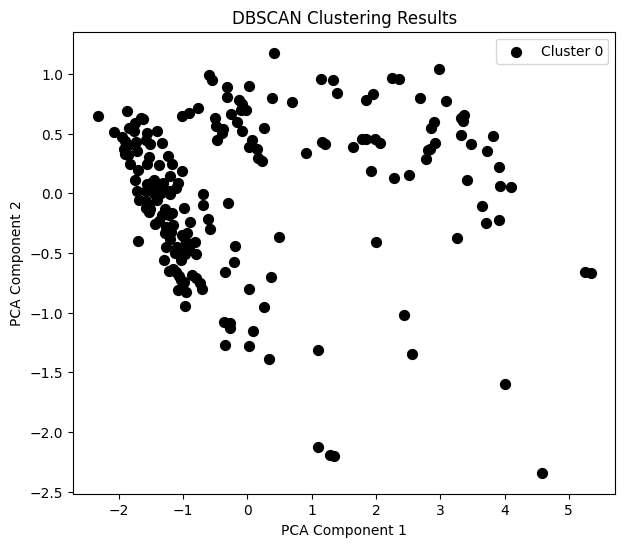

eps:  5
mins:  15


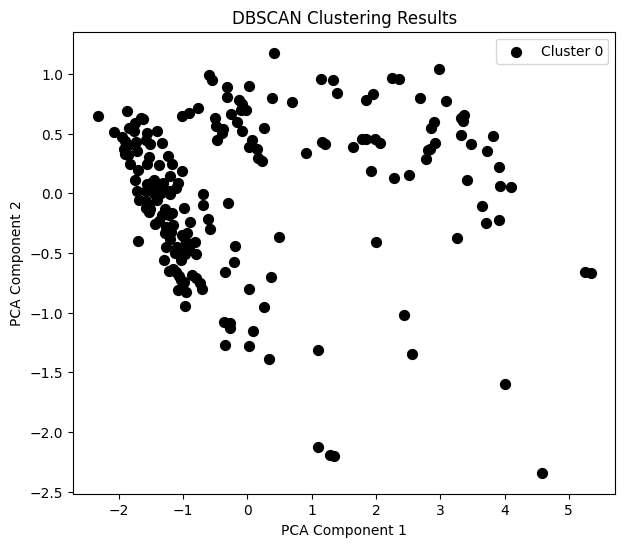

eps:  5
mins:  16


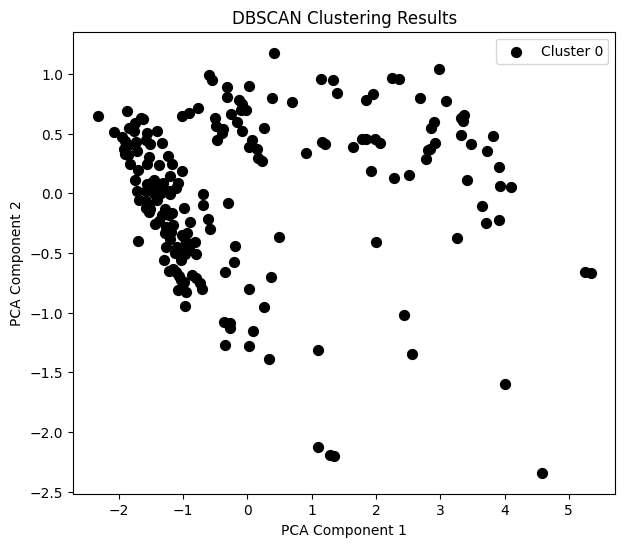

eps:  5
mins:  17


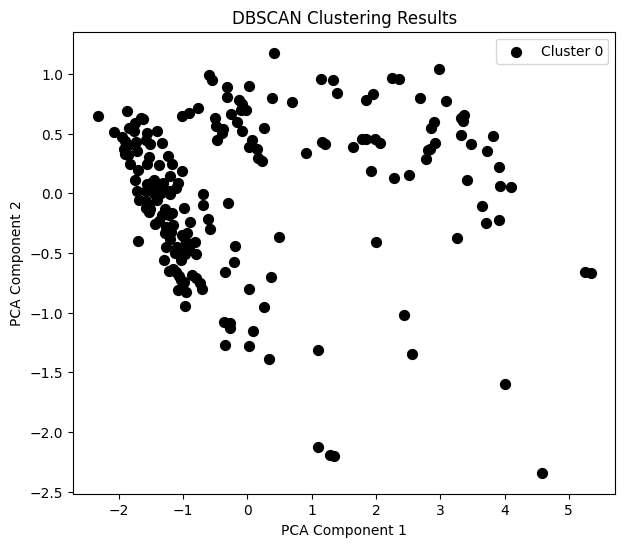

eps:  5
mins:  18


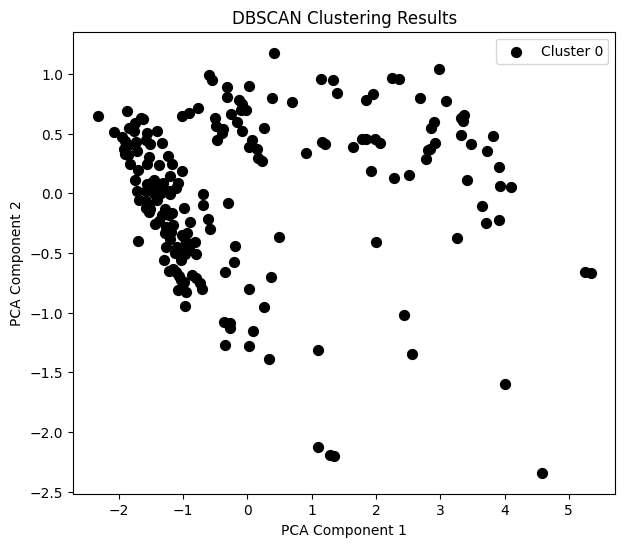

eps:  5
mins:  19


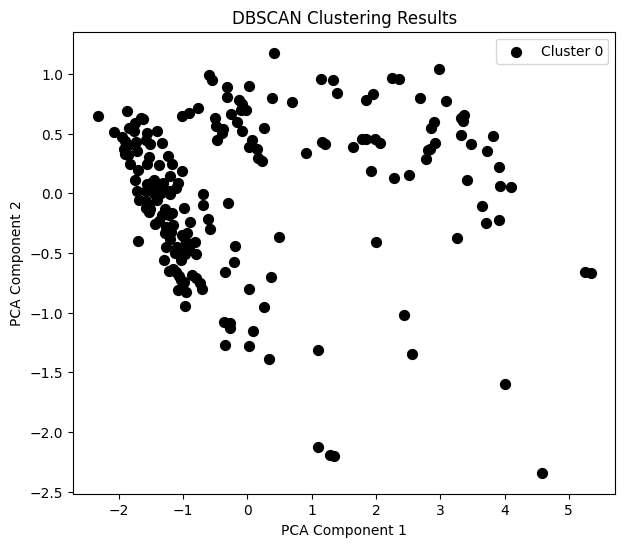

eps:  5
mins:  20


In [ ]:
epss = [1.3,1.4,1.5,1.6,1.7,1.8,1.9,2,3,4,5]
mins = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
for i in range(11):
  for j in range(20):
    cluster_labels = apply_dbscan(EEG_3D_mu_beta_car_T_csp58, epss[i], mins[j])
    plot_dbscan_clusters(EEG_3D_mu_beta_car_T_csp58, cluster_labels)
    print("eps: ", epss[i])
    print("mins: ", mins[j])